TECHNICAL TEST INSTRUCTIONS:
Use the example data set to answer following questions:
1. Which customers are most likely to churn?
2. What can we do to reduce churn?
3. Present your answers in a format you think is most appropriate for your stakeholders to get
your message across.
4. You can use whatever software and method you find appropriate to do your analysis, and
submit your code, notebook, markdown, github repo, or any format you used for your
analysis.
5. Any other findings in addition to above question 1 & 2 you want to share from your analysis?

### Import required packages

In [74]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

plt.style.use('ggplot')

width = 6
height = 6
plt.figure(figsize=(width, height))
sns.set(style="ticks", color_codes=True)

from feature_selector import FeatureSelector

import pickle

from collections import OrderedDict
import sys

from sklearn.preprocessing import Imputer

import sklearn.model_selection as model_selection
from sklearn.model_selection import train_test_split

from featexp import get_univariate_plots
from featexp import get_trend_stats

from sklearn.dummy import DummyClassifier
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold, cross_val_score
from sklearn.metrics import accuracy_score, roc_auc_score, roc_curve, auc, f1_score, classification_report, precision_score, recall_score

import xgboost as xgb
from xgboost import XGBClassifier, plot_importance

from pdpbox import info_plots, get_dataset

import shap
shap.initjs() 

import warnings
warnings.filterwarnings('ignore')

<Figure size 600x600 with 0 Axes>

### Import data

In [2]:
# Import the csv file
file_name = 'C:/Users/Lenovo/Desktop/churn.csv'
df = pd.read_csv(file_name,na_values=' ') #totalcharges has blank values and hence converted as string while importing

### Inspect data

In [3]:
# Shape of imported dataframe 
df.shape
print ("The number of observations is {rows} and the number or variables is {cols} in the dataframe".format(rows= df.shape[0],cols= df.shape[1]))

The number of observations is 7043 and the number or variables is 21 in the dataframe


In [4]:
# Make all variable names as lower case
df.columns = map(str.lower, df.columns)

In [5]:
# Peek at the imported dataframe
df.head()

,customerid,gender,seniorcitizen,partner,dependents,tenure,phoneservice,multiplelines,internetservice,onlinesecurity,...,deviceprotection,techsupport,streamingtv,streamingmovies,contract,paperlessbilling,paymentmethod,monthlycharges,totalcharges,churn
0,7590-VHVEG,Female,0,Yes,No,1,No,No phone service,DSL,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,29.85,29.85,No
1,5575-GNVDE,Male,0,No,No,34,Yes,No,DSL,Yes,...,Yes,No,No,No,One year,No,Mailed check,56.95,1889.50,No
2,3668-QPYBK,Male,0,No,No,2,Yes,No,DSL,Yes,...,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes
3,7795-CFOCW,Male,0,No,No,45,No,No phone service,DSL,Yes,...,Yes,Yes,No,No,One year,No,Bank transfer (automatic),42.30,1840.75,No
4,9237-HQITU,Female,0,No,No,2,Yes,No,Fiber optic,No,...,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes


customerid is the unique identifier

churn is the target variable

In [6]:
# Check for duplicates in dataframe
df['customerid'].nunique()
print ("The number of duplicates in the dataframe is {num_dupes}".format(num_dupes = len(df['customerid']) - df['customerid'].nunique()))

The number of duplicates in the dataframe is 0


In [7]:
# Converting target variable to binary and obtain frequency distribution
df.loc[df.churn=='Yes','churn'] = 1
df.loc[df.churn=='No','churn'] = 0
df['churn'] = df['churn'].astype('int')
target_dist = pd.value_counts(df['churn'],normalize=True)
print ("The churn rate in the population is {:.2f}%".format(target_dist.iloc[1]*100))

The churn rate in the population is 26.54%


The churn rate seems to be pretty high. Client seems to be facing challenges with customer retention.

In [8]:
# Check the dataframe info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 21 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerid        7043 non-null   object 
 1   gender            7043 non-null   object 
 2   seniorcitizen     7043 non-null   int64  
 3   partner           7043 non-null   object 
 4   dependents        7043 non-null   object 
 5   tenure            7043 non-null   int64  
 6   phoneservice      7043 non-null   object 
 7   multiplelines     7043 non-null   object 
 8   internetservice   7043 non-null   object 
 9   onlinesecurity    7043 non-null   object 
 10  onlinebackup      7043 non-null   object 
 11  deviceprotection  7043 non-null   object 
 12  techsupport       7043 non-null   object 
 13  streamingtv       7043 non-null   object 
 14  streamingmovies   7043 non-null   object 
 15  contract          7043 non-null   object 
 16  paperlessbilling  7043 non-null   object 


total charges seems to have very few missing values. Let's check. Format of all the variables look alright

In [9]:
# Missing value distribution in dataframe
print ("Missing value distribution in dataframe")
df.isna().mean()*100

Missing value distribution in dataframe


customerid          0.000000
gender              0.000000
seniorcitizen       0.000000
partner             0.000000
dependents          0.000000
tenure              0.000000
phoneservice        0.000000
multiplelines       0.000000
internetservice     0.000000
onlinesecurity      0.000000
onlinebackup        0.000000
deviceprotection    0.000000
techsupport         0.000000
streamingtv         0.000000
streamingmovies     0.000000
contract            0.000000
paperlessbilling    0.000000
paymentmethod       0.000000
monthlycharges      0.000000
totalcharges        0.156183
churn               0.000000
dtype: float64

totalcharges column has 11 missing values (~ 0.15%). Will decide on a suitable imputation post EDA

In [10]:
# Obtain ount of different datatypes in the dataframe
df.drop(['customerid','churn'],axis=1).dtypes.value_counts()

object     15
int64       2
float64     2
dtype: int64

Majority of features in the dataframe are categorical variables

In [11]:
#Number of unique values for each of teh variables in dataframe
df.nunique()

customerid          7043
gender                 2
seniorcitizen          2
partner                2
dependents             2
tenure                73
phoneservice           2
multiplelines          3
internetservice        3
onlinesecurity         3
onlinebackup           3
deviceprotection       3
techsupport            3
streamingtv            3
streamingmovies        3
contract               3
paperlessbilling       2
paymentmethod          4
monthlycharges      1585
totalcharges        6530
churn                  2
dtype: int64

Senior citizen has just 2 values, but is in integer format. Should be a binary variable

In [12]:
# Frequency distribution of seniorcitizen variable
df['seniorcitizen'].value_counts()

0    5901
1    1142
Name: seniorcitizen, dtype: int64

In [13]:
# Convert seniorcitizen to categorical variable for purposes of EDA
df.loc[df.seniorcitizen== 1,'seniorcitizen'] = 'Yes'
df.loc[df.seniorcitizen== 0,'seniorcitizen'] = 'No'
df['seniorcitizen'].value_counts()

No     5901
Yes    1142
Name: seniorcitizen, dtype: int64

In [14]:
# Assign key and target variables
key_col = ['customerid']
target_col = ['churn']

### EDA - categorical variables

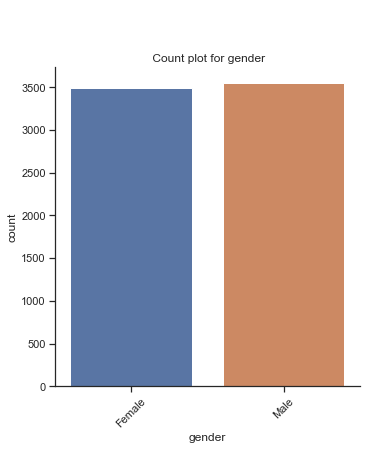

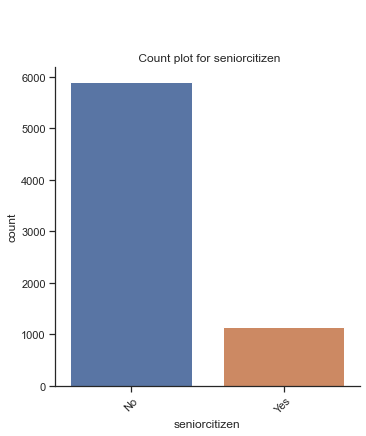

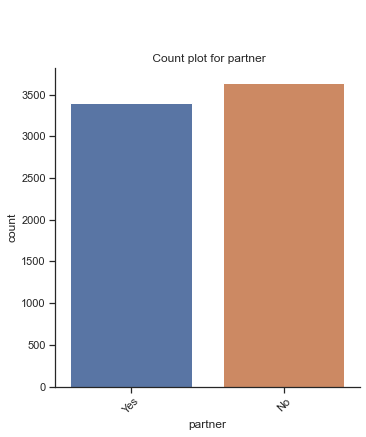

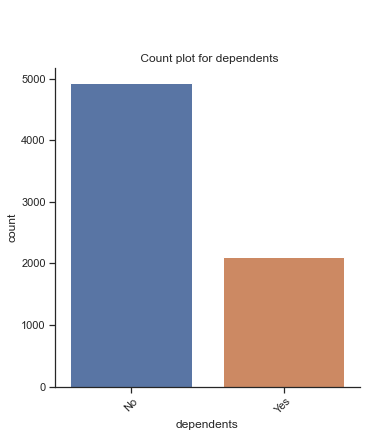

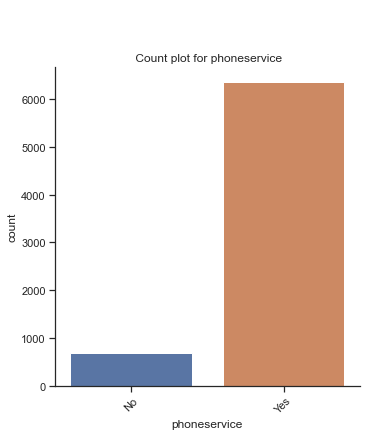

...

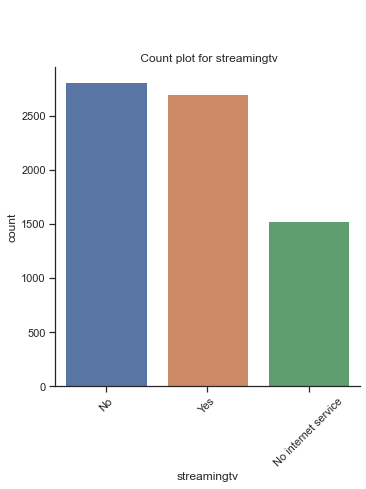

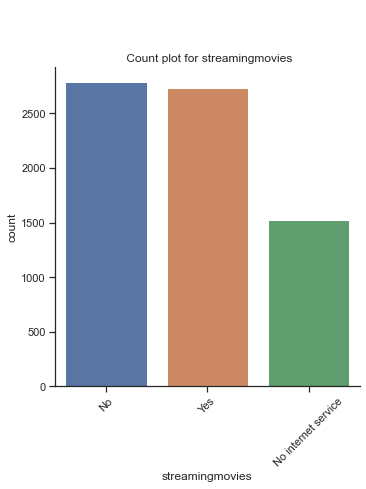

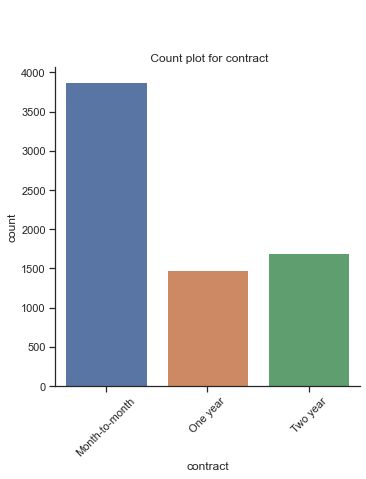

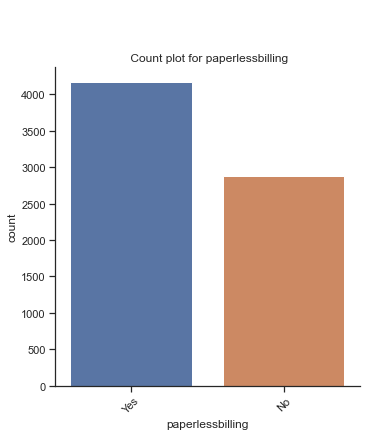

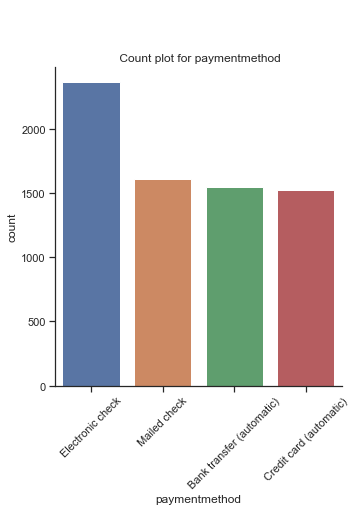

In [15]:
# Count plots for all categorical variables in dataframe4
%matplotlib inline
cat_cols = [x for x in df.select_dtypes(include=['object', 'category']).columns if x not in key_col if x not in target_col]
for col in cat_cols:
    sns.catplot(x=col, kind="count", data=df)
    plt.xticks(rotation=45)
    plt.title("\n\n\n\n Count plot for {}".format(col))
    plt.show()

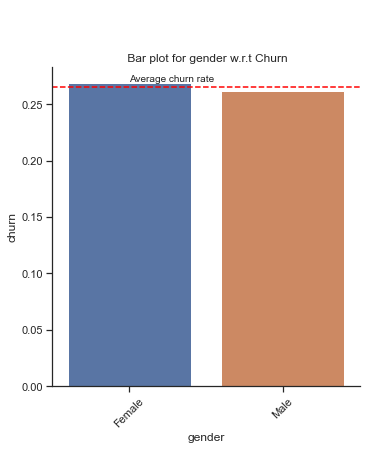

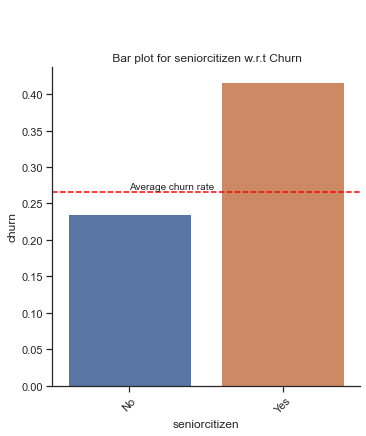

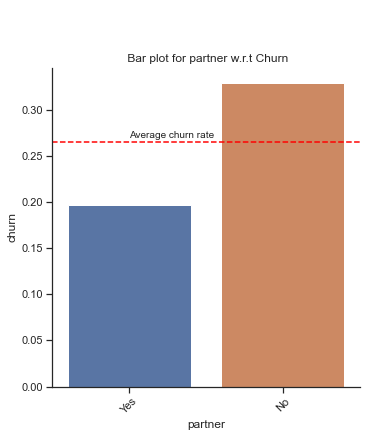

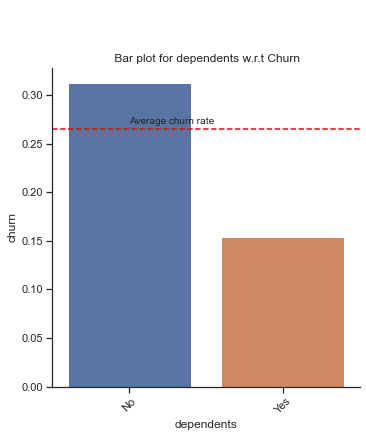

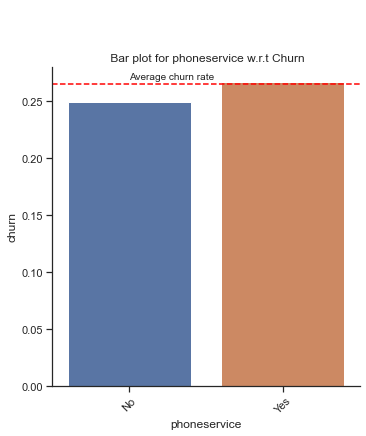

...

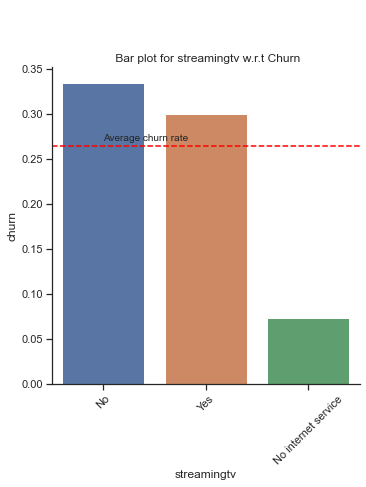

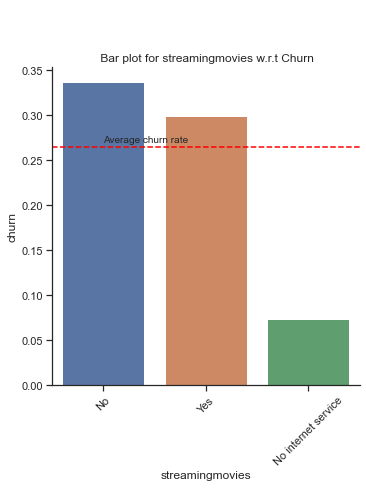

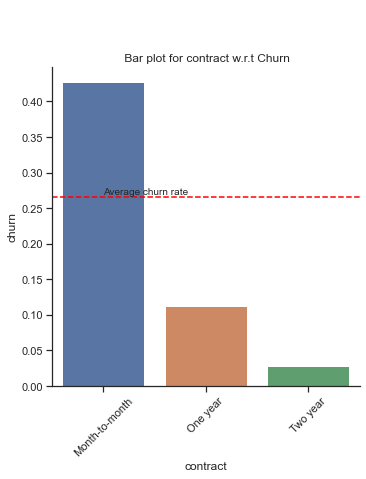

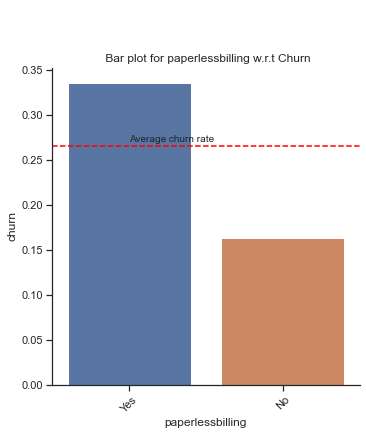

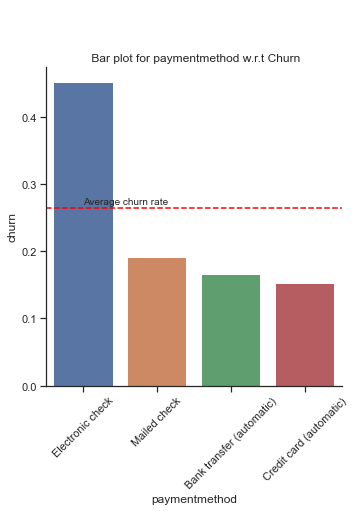

In [16]:
# Bar plots for all categorical variables wrt target variable in dataframe
cat_cols = [x for x in df.select_dtypes(include=['object', 'category']).columns if x not in key_col if x not in target_col]
for col in cat_cols:
    sns.catplot(x=col, y="churn", kind="bar", data=df, ci=None)
    plt.axhline(y=0.265, ls='--', c='red')
    plt.text(0,0.27, "Average churn rate")
    plt.xticks(rotation=45)
    plt.title(" \n\n\n\n Bar plot for {} w.r.t Churn".format(col))

Interested in all categories of customers who breach the red line (i.e average churn rate) in the plots above 

### EDA - discrete and continuous variables

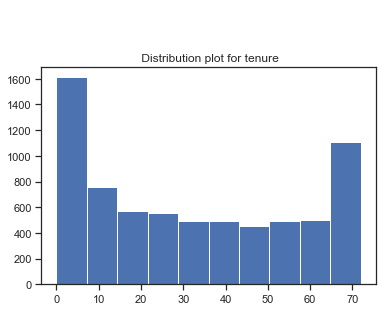

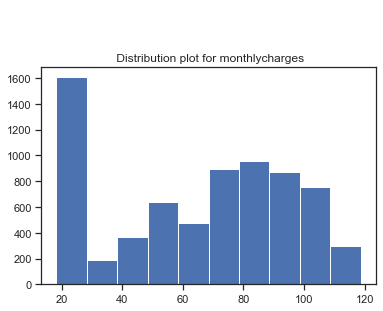

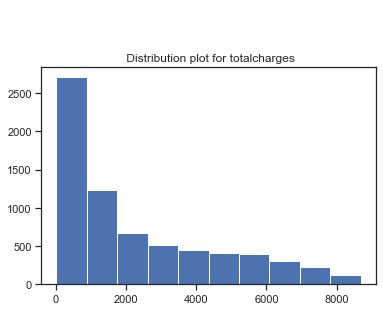

In [17]:
# Histogram plots for all discrete and continuous variables wrt target variable in dataframe
num_cols = [x for x in df.select_dtypes(include=['int64','float']).columns if x not in key_col if x not in target_col]
for col in num_cols:
    plt.title("\n\n\n\n Distribution plot for {}".format(col))
    plt.hist(df[col], bins = 10)
    plt.show()

Tenure is bimodal

Monthly charges is skewed towwards lesser monthly charges

Total charges has a long right tail and left skewed

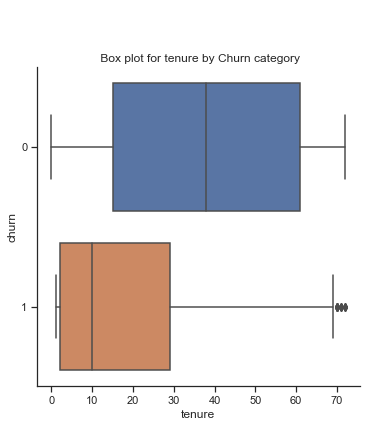

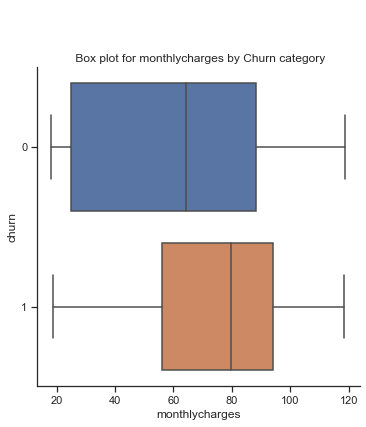

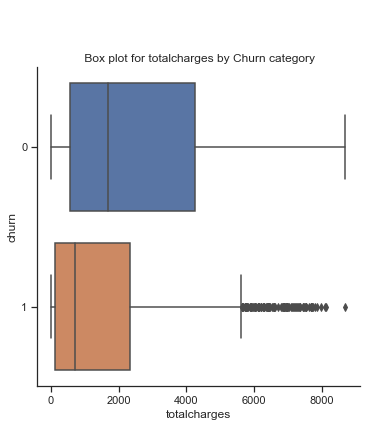

In [18]:
# Box plots for all discrete and continuous variables wrt target variable in dataframe
num_cols = [x for x in df.select_dtypes(include=['int64','float']).columns if x not in key_col if x not in target_col]
for col in num_cols:
    sns.catplot(x=col, y="churn", kind="box", orient="h", data=df)
    plt.title("\n\n\n\n Box plot for {} by Churn category".format(col))
    plt.show()

As expected lower tenure expected with higher churn rate

Higher monthly charges associated with churn

Interesting. Customers whose total charges are lesser tend to churn. This could be because their usage of services has gradually decreased prior to churn

### Missing value imputation for totalcharges

In [19]:
df.describe(include=np.number)

,tenure,monthlycharges,totalcharges,churn
count,7043.000000,7043.000000,7032.000000,7043.000000
mean,32.371149,64.761692,2283.300441,0.265370
std,24.559481,30.090047,2266.771362,0.441561
min,0.000000,18.250000,18.800000,0.000000
25%,9.000000,35.500000,401.450000,0.000000
50%,29.000000,70.350000,1397.475000,0.000000
75%,55.000000,89.850000,3794.737500,1.000000
max,72.000000,118.750000,8684.800000,1.000000


The mean and median are quite far away from each other for totalcharges as we saw in the histogram. Since the distribution is left skewed,let's impute by median which is a better representation of central measure than the mean.

In [20]:
# Missing value imputation for totalcharges
imr = Imputer(missing_values=np.NaN, strategy="median")
imr = imr.fit(df[['totalcharges']])
df["totalcharges"] = imr.transform(df[["totalcharges"]]).ravel()

In [21]:
# Sanity check if missing values have been imputed
df["totalcharges"].isna().sum().sum()

0

### Outlier detection and treatment

#### Note - Will revisit if perfomance of tree based methods not satisfactory and have to use GLMs

In [22]:
# Cap outliers based on IQR
# def winsorise(x):
#     q1, q3 = np.percentile(x,(25,75))
#     iqr = q3 - q1
#     limit = q3 + 1.5*iqr
#     return [min(i, limit) for i in x]

# df_w = df.loc[:,['totalcharges','monthlycharges']].apply(winsorise)

### Quick feature engineering

#### Note - Could use automated feature engineering packages - featuretools but will explore if required as the process is computationally expensive and also will have to regularize later if we have too mnay features that are hard to explain

In [23]:
# Function to create a new feature to binarize Internet service
def f(x):
  if x['internetservice'] == 'No': return 1
  else: return 0

In [24]:
# Apply the above function
df['feat_internet_service'] = df.apply(f, axis=1)
df['feat_internet_service'].value_counts()

# Replace values of categorical variables to avoid confusion when converted to dummies
df.replace("No internet service", "no_internet", inplace=True)
df.replace("No phone service", "no_phone",inplace=True)

In [25]:
df['onlinesecurity'].value_counts()

No             3498
Yes            2019
no_internet    1526
Name: onlinesecurity, dtype: int64

In [26]:
# Creating new features based on combination of categorical variables i.e service and features
df['feat_gpd'] = df['gender'] + "_Partner_" + df['partner'] + "_Dependents_" + df['dependents'] # gender + partners + dependents
df['feat_gs'] = df['gender'] + "_Sr_Citizen_" + df['seniorcitizen']  # gender + senior citizen
df['feat_gscp'] = df['gender'] + "_Sr_Citizen_" + df['seniorcitizen'] + "_Partner_" + df['partner'] # gender + senior citizen +partner
df['feat_sb'] = "Security_" + df['onlinesecurity'] + "_Backup_" + df['onlinebackup'] # Online security + Backup
df['feat_sbd'] = "Security_" + df['onlinesecurity'] + "_Backup_" + df['onlinebackup'] + "_DeviceProtect_" + df['deviceprotection'] # Online security + Online backup + Device protection
df['feat_sbdt'] = "Security_" + df['onlinesecurity'] + "_Backup_" + df['onlinebackup'] + "_DeviceProtect_" + df['deviceprotection'] + "_TechSupport_" + df['techsupport'] # Online security + Online backup + Device protection + Tech Support
df['feat_stream'] =  "StreamingTV_" + df['streamingtv'] + "_StreamingMovies_" + df['streamingmovies'] # Streaming TV + Streaming Movies

In [27]:
# Feature engineering for the charges variable
df['feat_charges_ratio'] = df['monthlycharges']/df['totalcharges'] # Monthly charges as ratio of total charges
df['feat_charges_delta'] = df['totalcharges'] - df['monthlycharges'] # Difference in total and monthly charges

### One hot encoding of categorical variables

In [28]:
cat_cols = [x for x in df.select_dtypes(include=['object', 'category']).columns if x not in key_col if x not in target_col]

In [29]:
df_ohe = pd.get_dummies(data=df, columns=cat_cols, drop_first=True)

In [30]:
# df_ohe_copy = df_ohe.copy()

In [31]:
len(df_ohe.columns)

84

### Check for target leakage and correlations (collinearity)

In [32]:
# Correlation between target variable - Churn and the features
corr_matrix = pd.DataFrame(df_ohe[df_ohe.columns[1:]].corr()['churn'][:])
corr_matrix.drop('churn',axis=0,inplace=True)
corr_matrix.columns = ['Corr_coeff']
corr_matrix = corr_matrix.iloc[corr_matrix['Corr_coeff'].abs().argsort()]
corr_matrix.tail()

,Corr_coeff
paymentmethod_Electronic check,0.301919
contract_Two year,-0.302253
internetservice_Fiber optic,0.308020
feat_charges_ratio,0.318824
tenure,-0.352229


Correlation coefficients suggest that the variable with the highest correlation is tenure (negative correlation) but is weak so there is no evidence of any target leakage

In [33]:
# Find highly correlated features
features = [x for x in df_ohe.columns if x not in key_col if x not in target_col]
df_feat_sel = df_ohe[features]

fs_coll = FeatureSelector(data=df_feat_sel, labels = features)
fs_coll.identify_collinear(correlation_threshold = 0.9)

13 features with a correlation magnitude greater than 0.90.



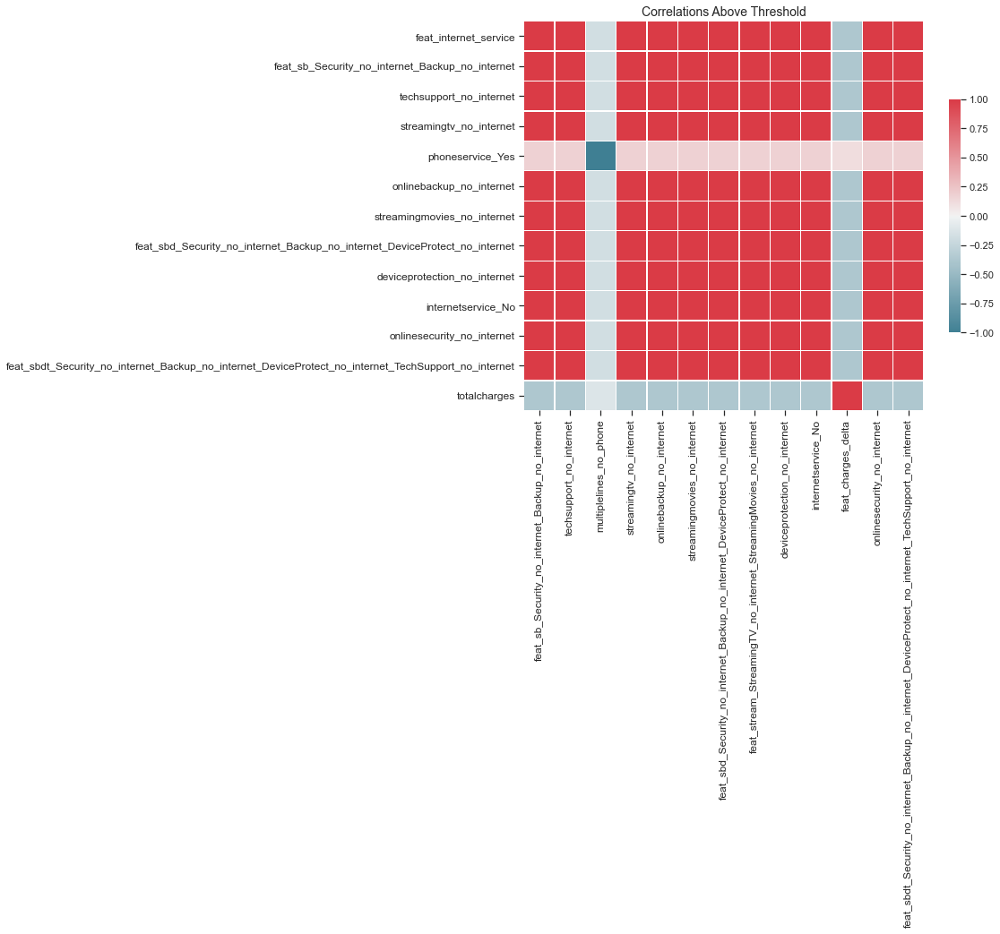

In [34]:
# Plot for variables that are highly collinear (>0.9)
fs_coll.plot_collinear()

In [35]:
# List of collinear features that we will remove
collinear_features = fs_coll.ops['collinear']

# Dataframe of collinear features
fs_coll.record_collinear.head()

,drop_feature,corr_feature,corr_value
0,feat_charges_delta,totalcharges,0.999948
1,multiplelines_no_phone,phoneservice_Yes,-1.000000
2,internetservice_No,feat_internet_service,1.000000
3,onlinesecurity_no_internet,feat_internet_service,1.000000
4,onlinesecurity_no_internet,internetservice_No,1.000000


In [36]:
# Make a list of redundant features to be dropped
drop_feat = fs_coll.record_collinear.drop_feature.unique().tolist()
drop_feat

['feat_charges_delta',
 'multiplelines_no_phone',
 'internetservice_No',
 'onlinesecurity_no_internet',
 'onlinebackup_no_internet',
 'deviceprotection_no_internet',
 'techsupport_no_internet',
 'streamingtv_no_internet',
 'streamingmovies_no_internet',
 'feat_sb_Security_no_internet_Backup_no_internet',
 'feat_sbd_Security_no_internet_Backup_no_internet_DeviceProtect_no_internet',
 'feat_sbdt_Security_no_internet_Backup_no_internet_DeviceProtect_no_internet_TechSupport_no_internet',
 'feat_stream_StreamingTV_no_internet_StreamingMovies_no_internet']

In [37]:
# Remove redundant features from the dataframe
df_ohe.drop(drop_feat,axis=1,inplace=True)

### Feature Selection

#### Remove pedictors that have zero feature importance

In [38]:
# Pass in the appropriate parameters
features = [x for x in df_ohe.columns if x not in key_col if x not in target_col]
df_feat_sel = df_ohe[features]

target_var = df_ohe['churn']
fs_fi = FeatureSelector(data= df_feat_sel, labels = target_var)

fs_fi.identify_zero_importance(task = 'classification', 
                            eval_metric = 'auc', 
                            n_iterations = 10, 
                             early_stopping = True)
# list of zero importance features
zero_importance_features = fs_fi.ops['zero_importance']

Training Gradient Boosting Model

Training until validation scores don't improve for 100 rounds.
Early stopping, best iteration is:
[81]	valid_0's auc: 0.853822
Training until validation scores don't improve for 100 rounds.
Early stopping, best iteration is:
[44]	valid_0's auc: 0.865176
Training until validation scores don't improve for 100 rounds.
Early stopping, best iteration is:
[45]	valid_0's auc: 0.844854
Training until validation scores don't improve for 100 rounds.
Early stopping, best iteration is:
[71]	valid_0's auc: 0.838003
Training until validation scores don't improve for 100 rounds.
Early stopping, best iteration is:
[27]	valid_0's auc: 0.865267
Training until validation scores don't improve for 100 rounds.
Early stopping, best iteration is:
[56]	valid_0's auc: 0.848361
Training until validation scores don't improve for 100 rounds.
Early stopping, best iteration is:
[28]	valid_0's auc: 0.853206
Training until validation scores don't improve for 100 rounds.
Early stopping

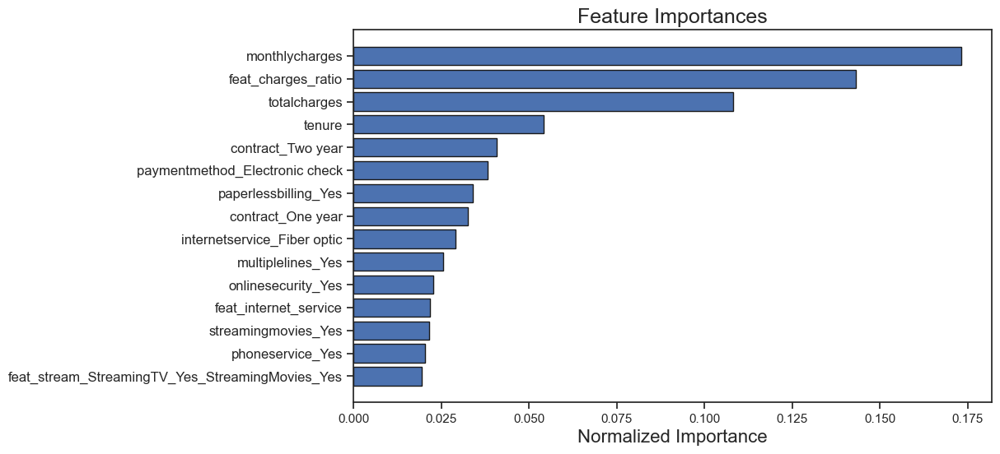

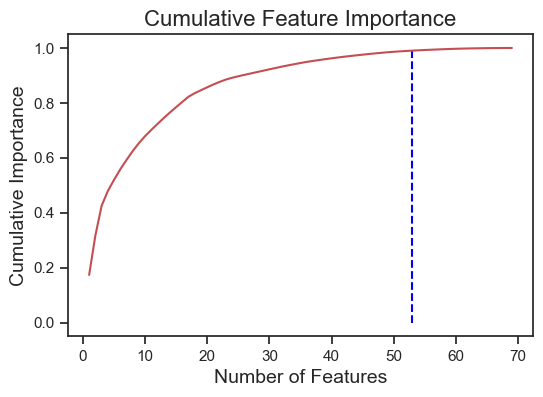

53 features required for 0.99 of cumulative importance


In [39]:
# plot the feature importances
fs_fi.plot_feature_importances(threshold = 0.99, plot_n = 15)

In [40]:
zero_importance_features

['feat_gscp_Male_Sr_Citizen_Yes_Partner_No']

There are no features that are of 0 importance

In [41]:
# # Remove zero importance features from the dataframe
# df_ohe.drop(zero_importance_features,axis=1,inplace=True)

In [42]:
# Identify features with low importance
fs_fi.identify_low_importance(cumulative_importance = 0.99)

52 features required for cumulative importance of 0.99 after one hot encoding.
17 features do not contribute to cumulative importance of 0.99.



Let's not drop features with low importance for now although their contribution is marginal

In [43]:
# Check features with 0 variance
fs_fi.identify_single_unique()

0 features with a single unique value.



### Univariate plots to check consistency of features if data is split into train and holdout

In [44]:
# Prepare data for univariate plots
modelling_df = df_ohe.iloc[:,1:] 

In [45]:
# Split data univariate plots
data_train, data_holdout = train_test_split(modelling_df,test_size=0.2,random_state=3)

### Univariate plots to check consistency of features between train and holdout

                                           Plots for tenure                                           
                                           Train data plots                                           


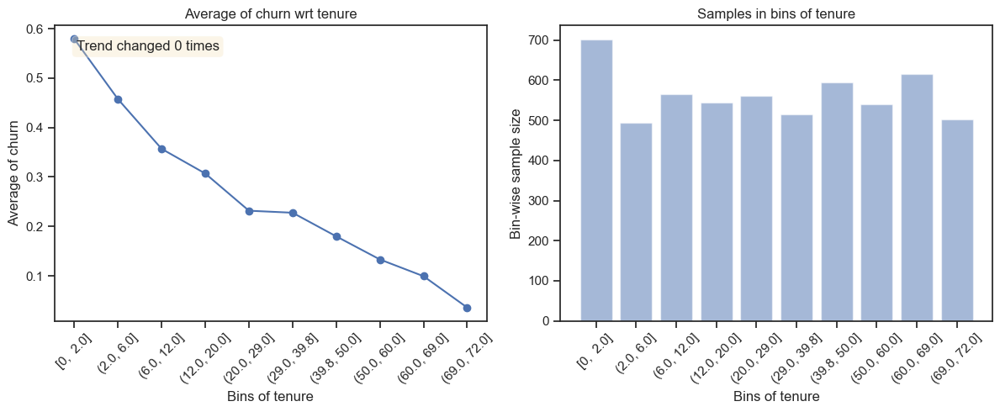

                                           Test data plots                                            


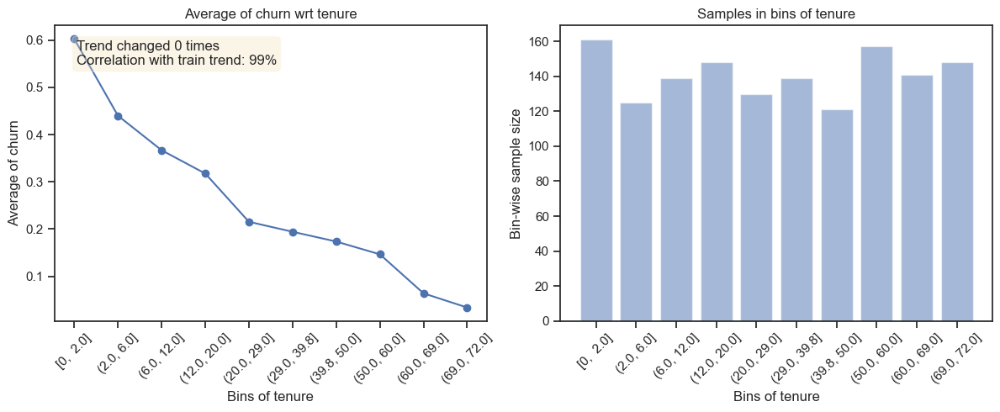

--------------------------------------------------------------------------------------------------------------


                                       Plots for monthlycharges                                       
                                           Train data plots                                           


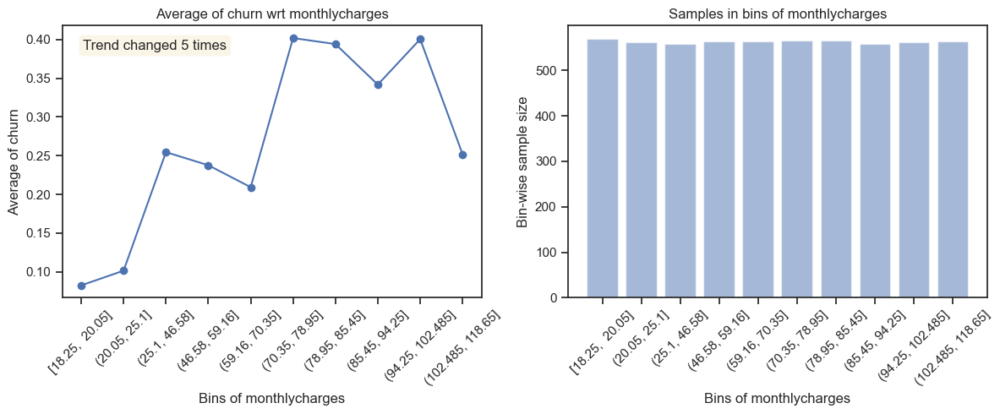

                                           Test data plots                                            


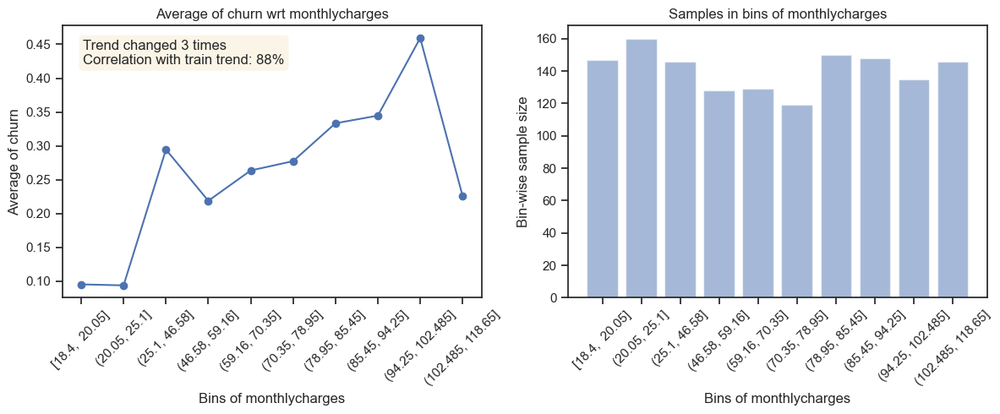

--------------------------------------------------------------------------------------------------------------


                                        Plots for totalcharges                                        
                                           Train data plots                                           


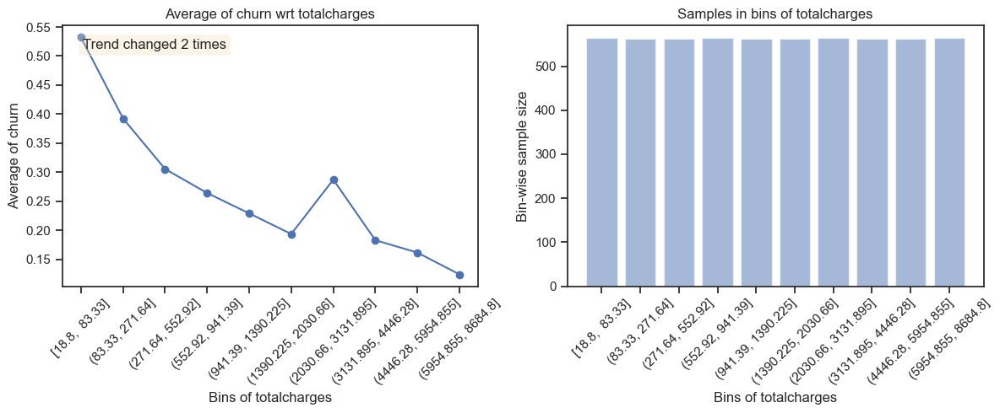

                                           Test data plots                                            


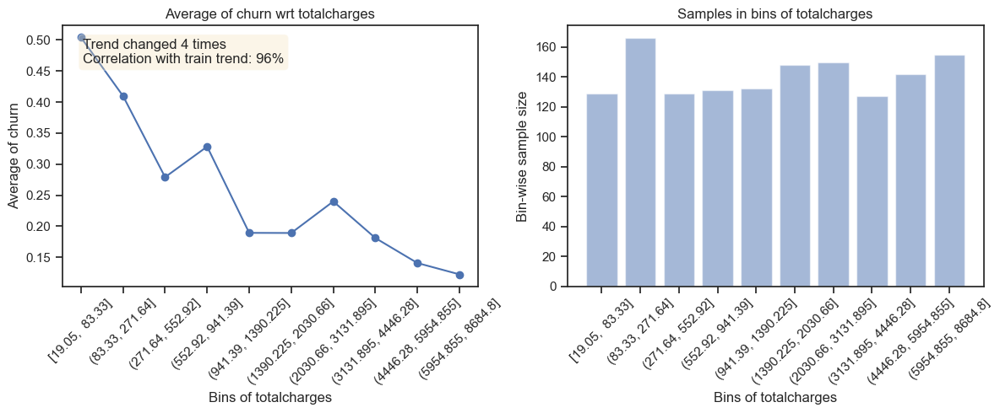

--------------------------------------------------------------------------------------------------------------


                                   Plots for feat_internet_service                                    
                                           Train data plots                                           


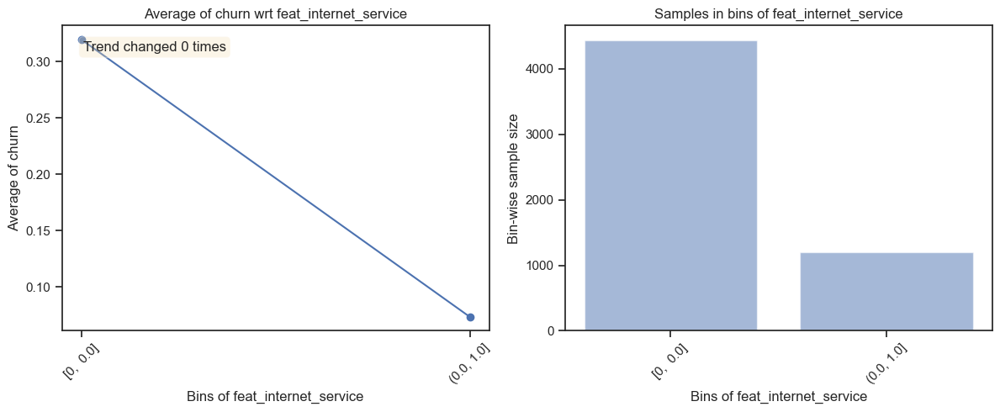

                                           Test data plots                                            


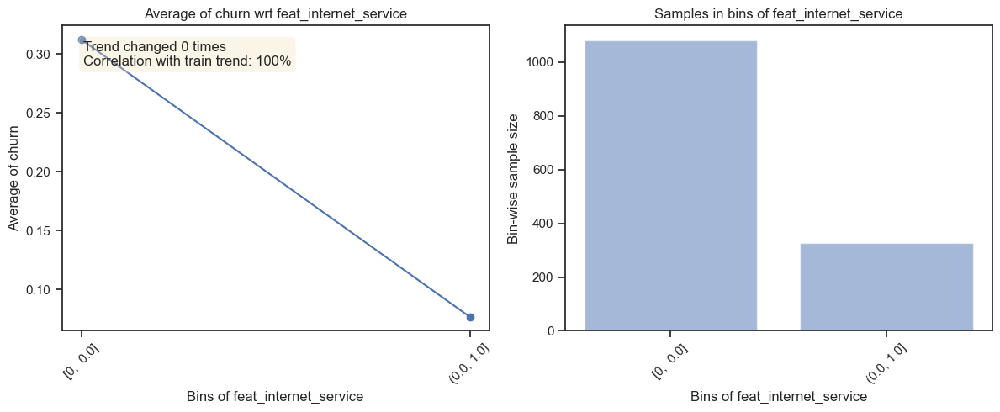

--------------------------------------------------------------------------------------------------------------


                                     Plots for feat_charges_ratio                                     
                                           Train data plots                                           


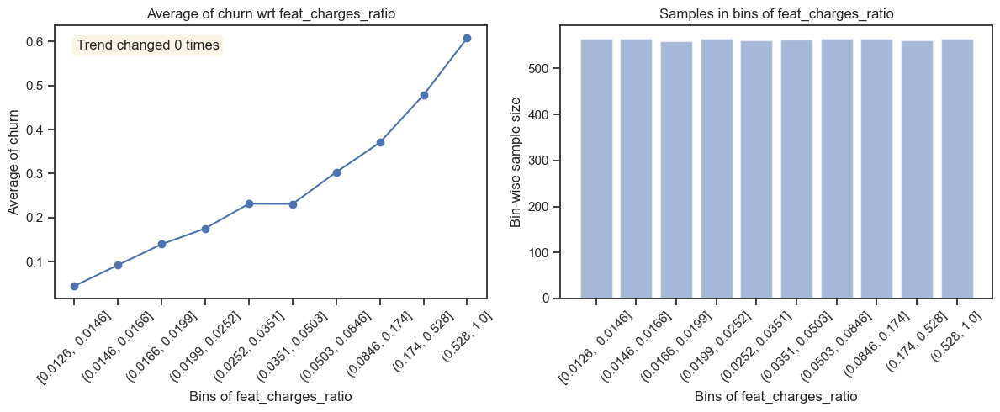

                                           Test data plots                                            


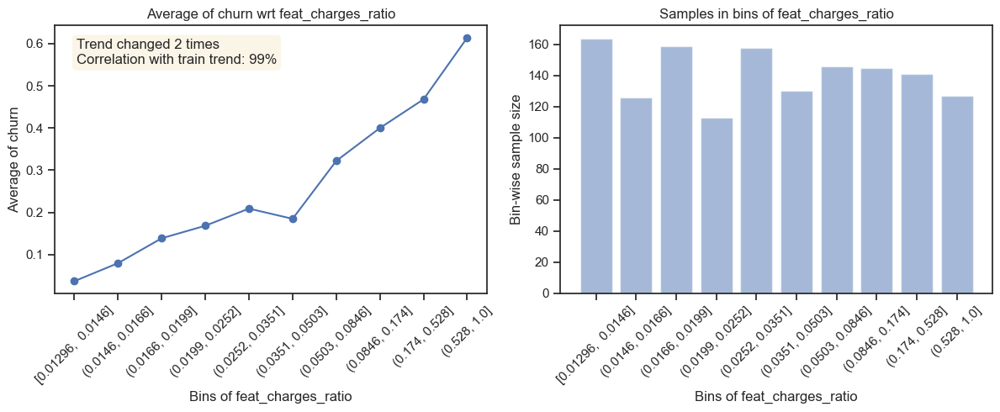

--------------------------------------------------------------------------------------------------------------


                                        Plots for gender_Male                                         
                                           Train data plots                                           


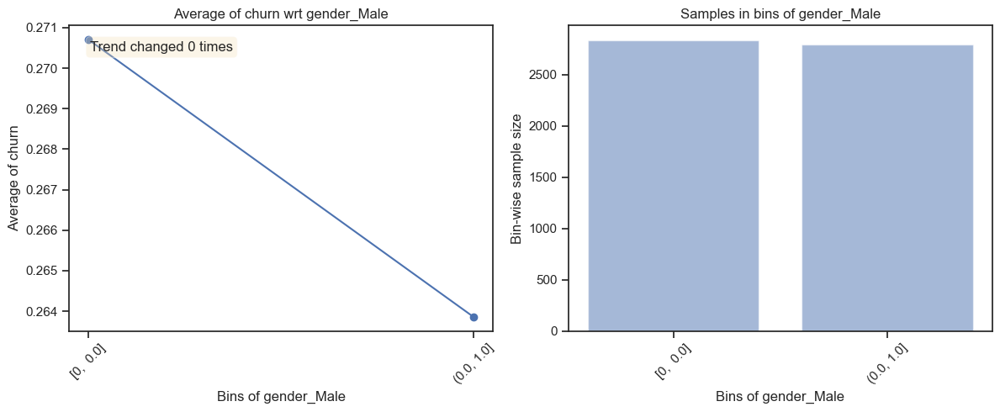

                                           Test data plots                                            


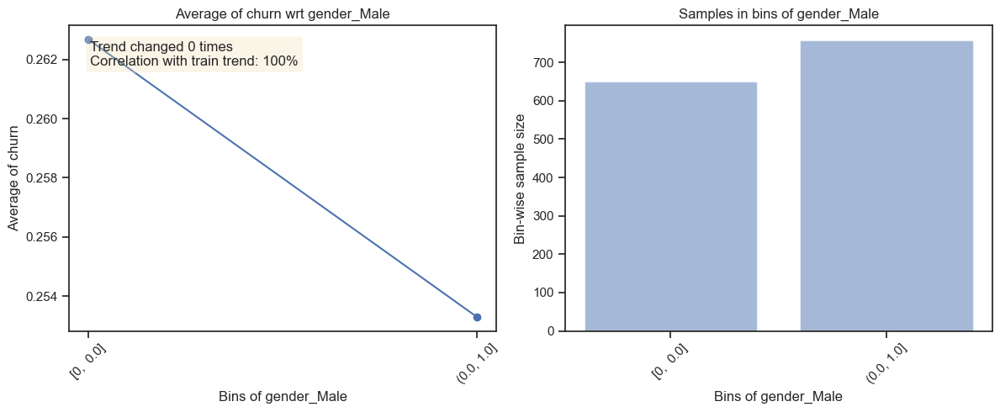

--------------------------------------------------------------------------------------------------------------


                                     Plots for seniorcitizen_Yes                                      
                                           Train data plots                                           


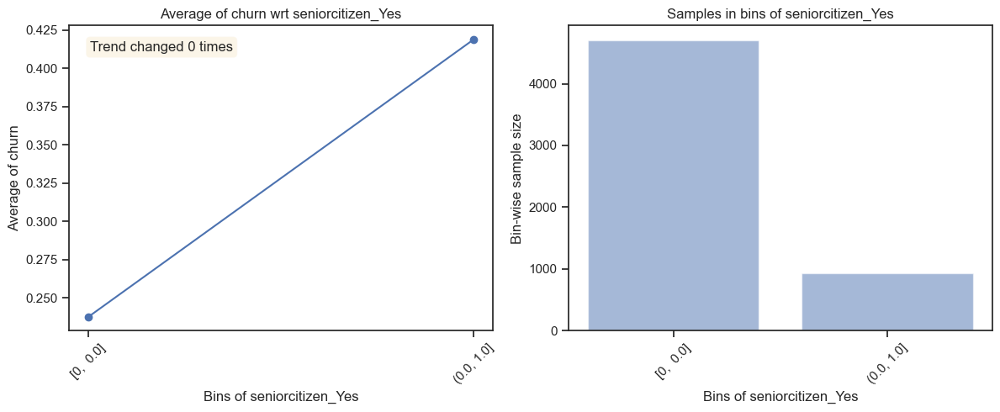

                                           Test data plots                                            


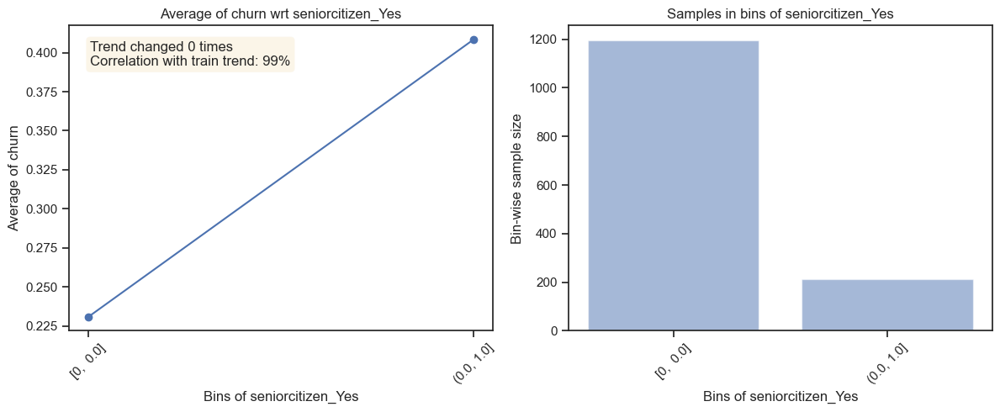

--------------------------------------------------------------------------------------------------------------


                                        Plots for partner_Yes                                         
                                           Train data plots                                           


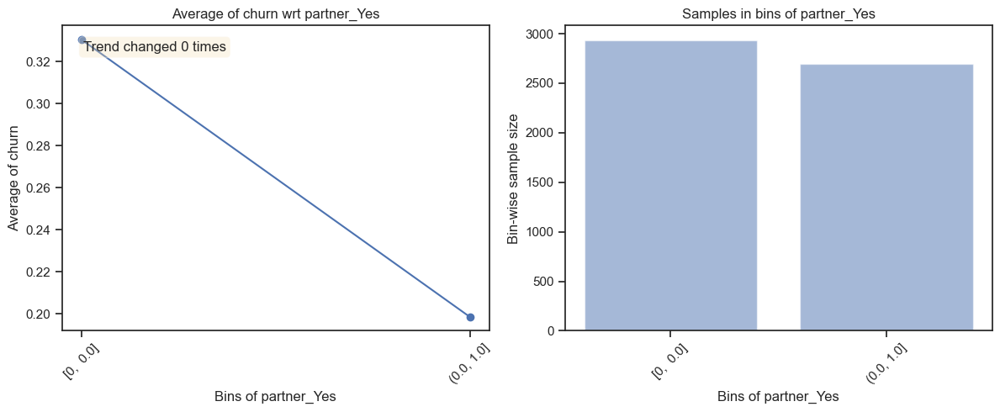

                                           Test data plots                                            


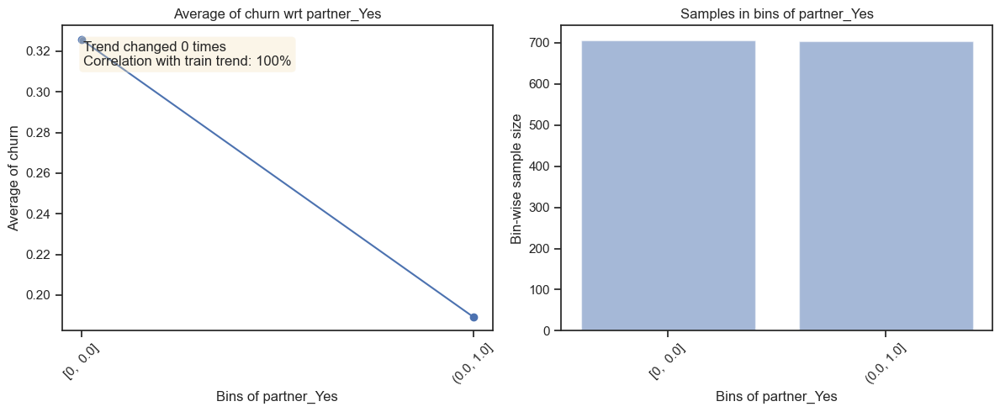

--------------------------------------------------------------------------------------------------------------


                                       Plots for dependents_Yes                                       
                                           Train data plots                                           


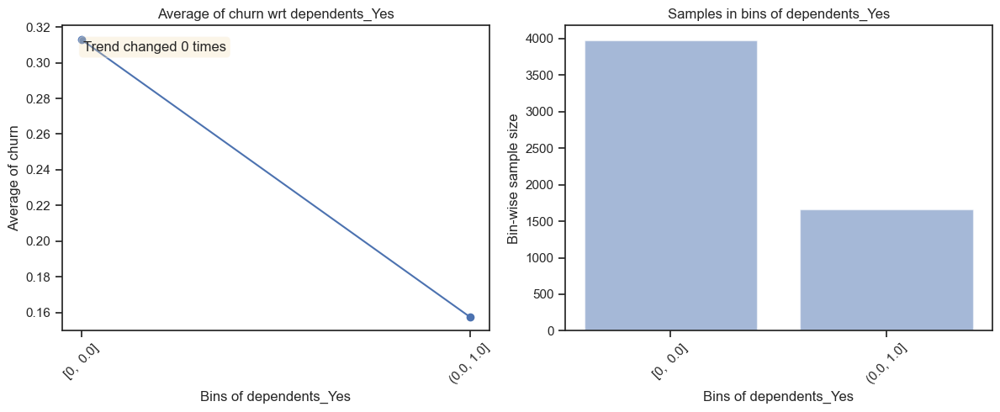

                                           Test data plots                                            


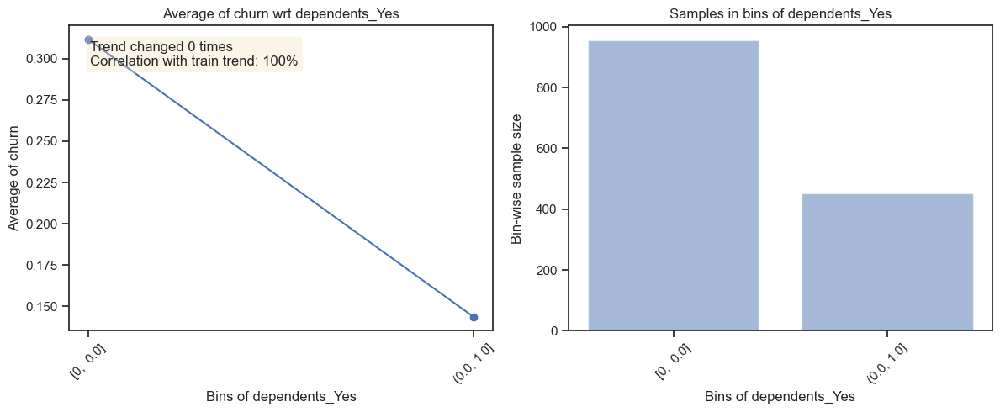

--------------------------------------------------------------------------------------------------------------


                                      Plots for phoneservice_Yes                                      
Only one bin created for phoneservice_Yes. Correlation can't be calculated
                                           Train data plots                                           


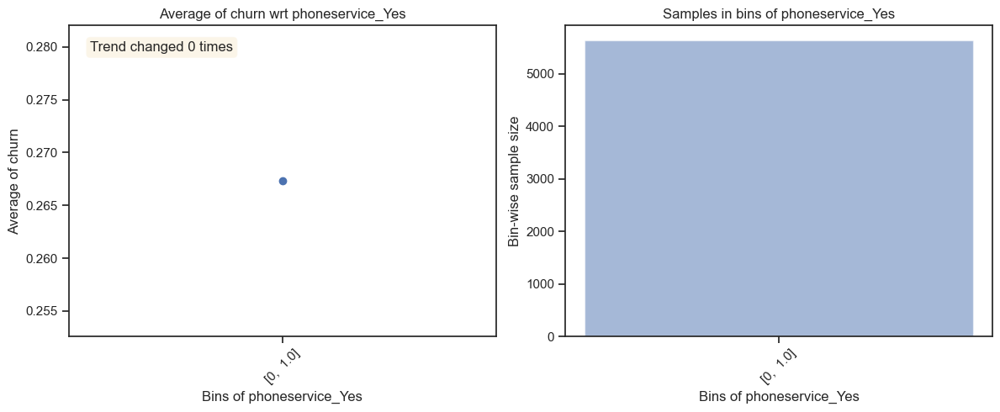

                                           Test data plots                                            


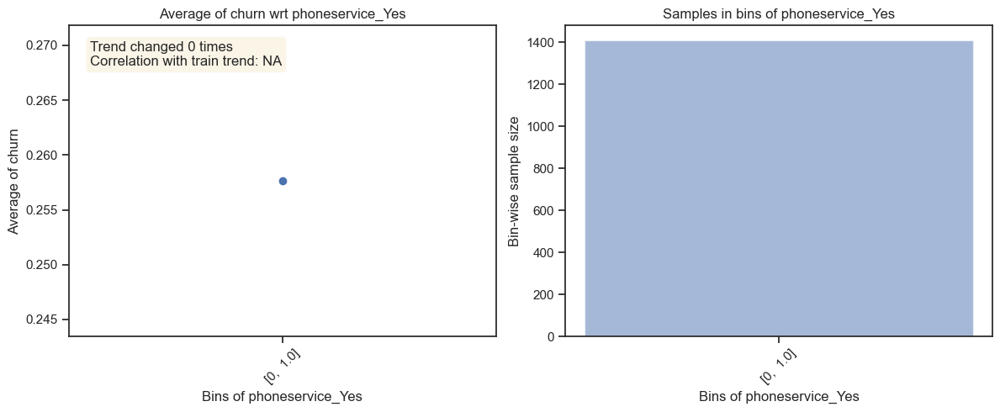

--------------------------------------------------------------------------------------------------------------


                                     Plots for multiplelines_Yes                                      
                                           Train data plots                                           


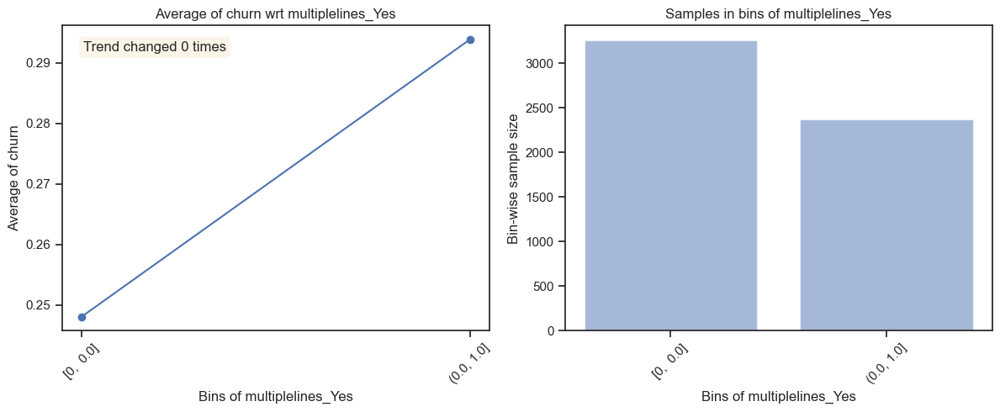

                                           Test data plots                                            


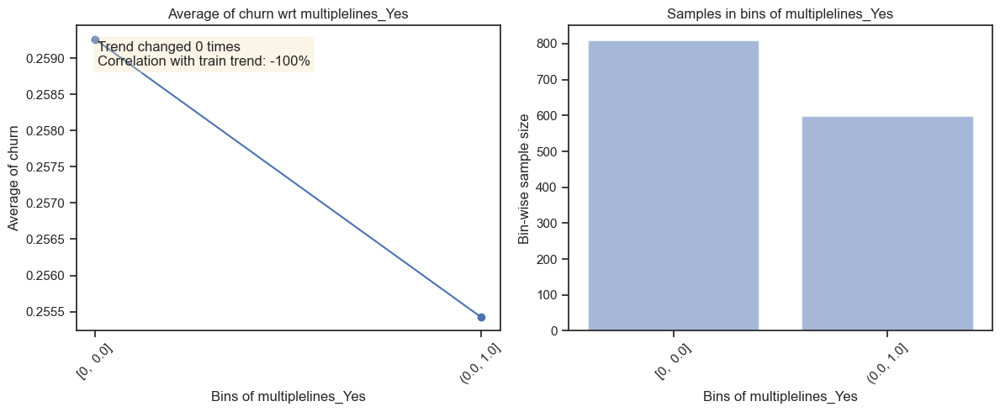

--------------------------------------------------------------------------------------------------------------


                                Plots for internetservice_Fiber optic                                 
                                           Train data plots                                           


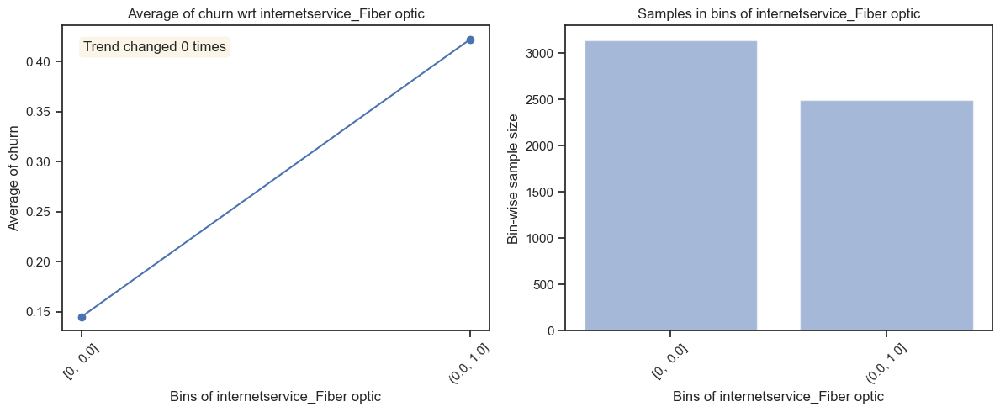

                                           Test data plots                                            


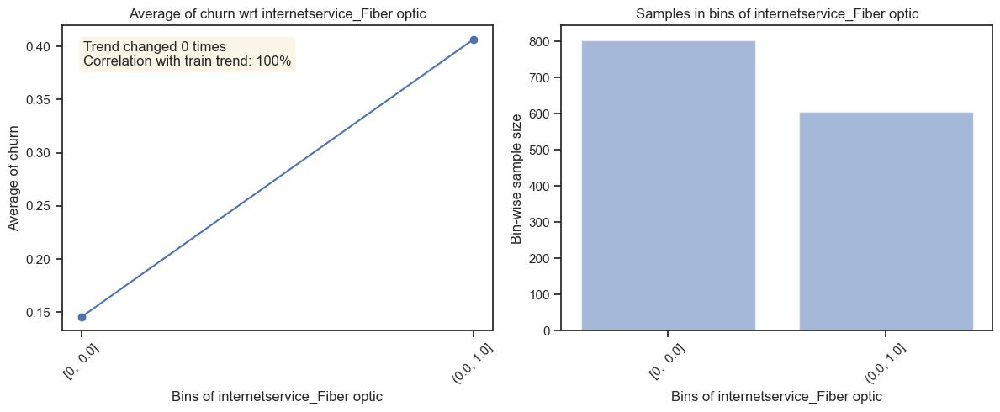

--------------------------------------------------------------------------------------------------------------


                                     Plots for onlinesecurity_Yes                                     
                                           Train data plots                                           


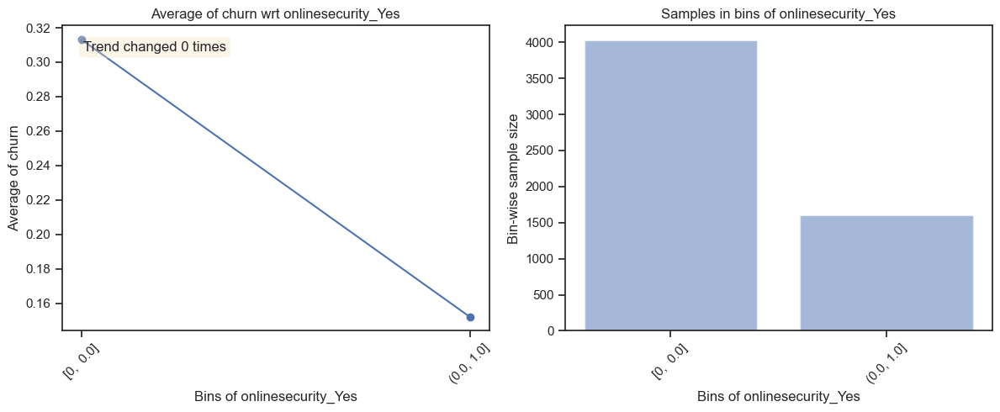

                                           Test data plots                                            


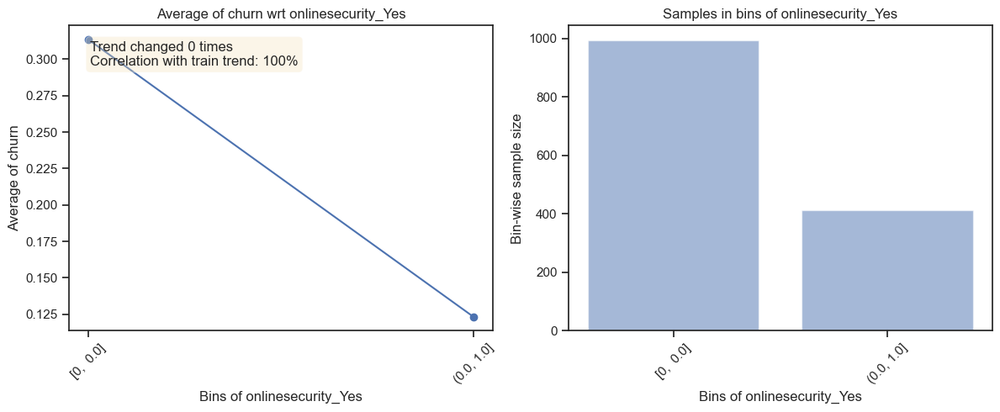

--------------------------------------------------------------------------------------------------------------


                                      Plots for onlinebackup_Yes                                      
                                           Train data plots                                           


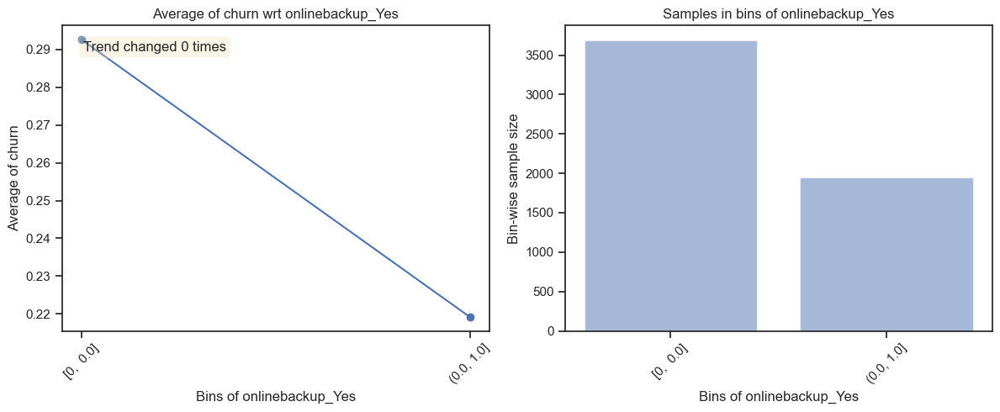

                                           Test data plots                                            


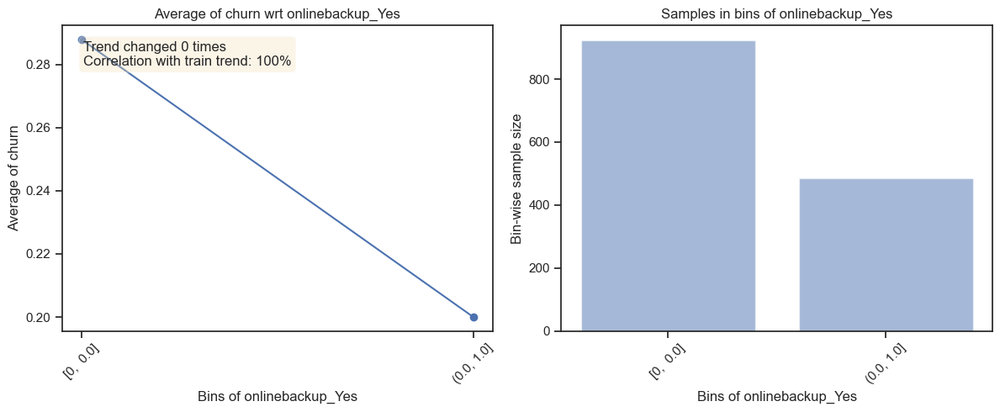

--------------------------------------------------------------------------------------------------------------


                                    Plots for deviceprotection_Yes                                    
                                           Train data plots                                           


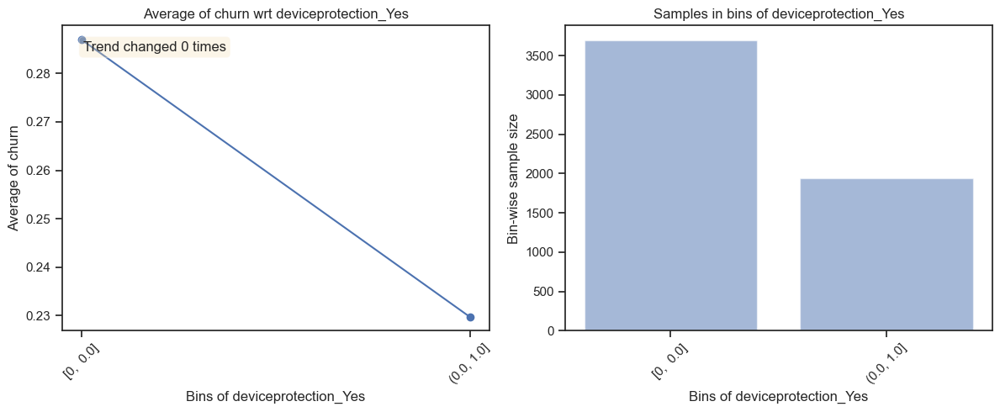

                                           Test data plots                                            


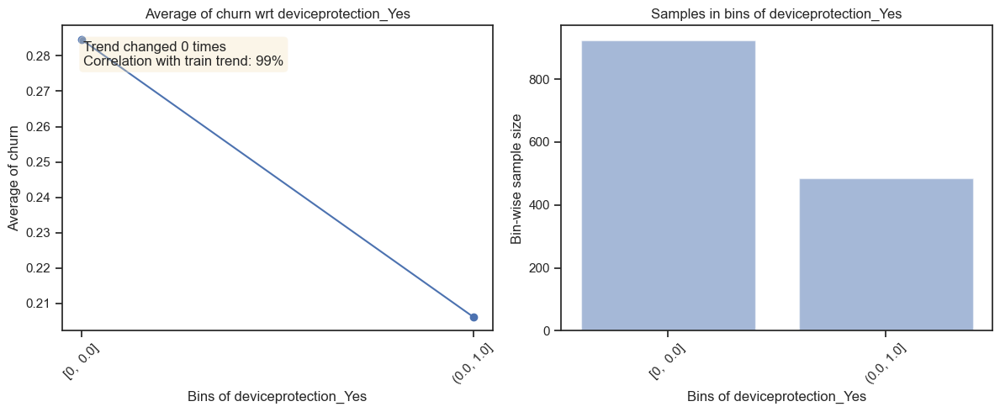

--------------------------------------------------------------------------------------------------------------


                                      Plots for techsupport_Yes                                       
                                           Train data plots                                           


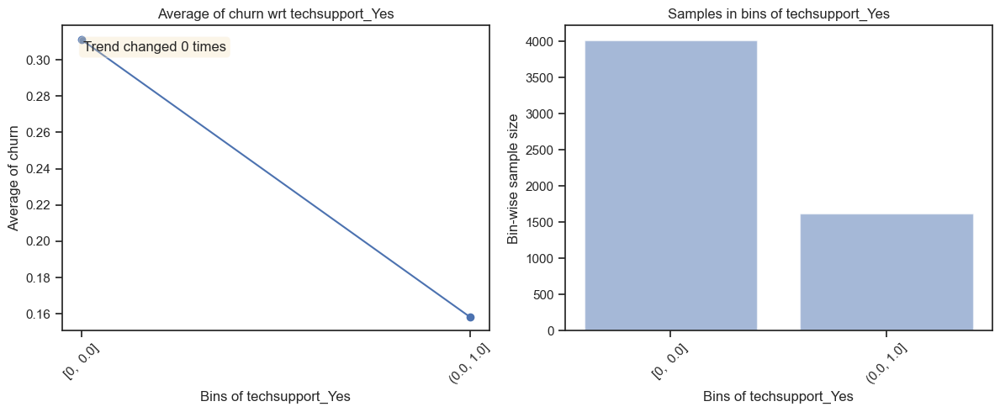

                                           Test data plots                                            


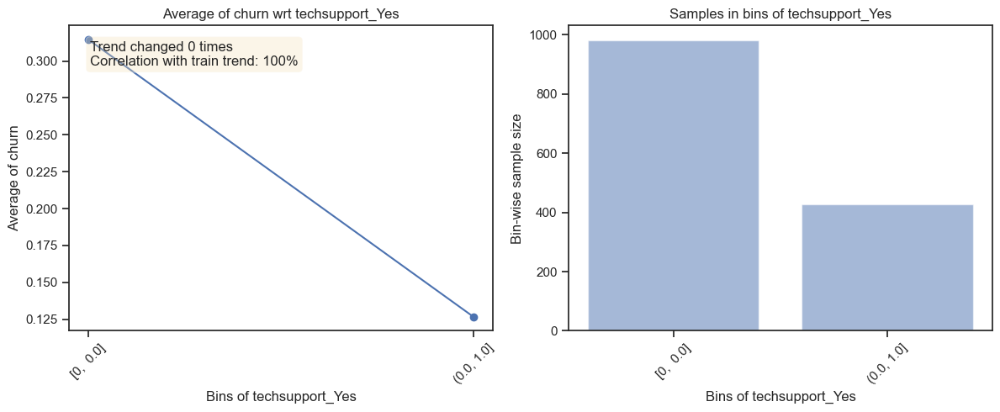

--------------------------------------------------------------------------------------------------------------


                                      Plots for streamingtv_Yes                                       
                                           Train data plots                                           


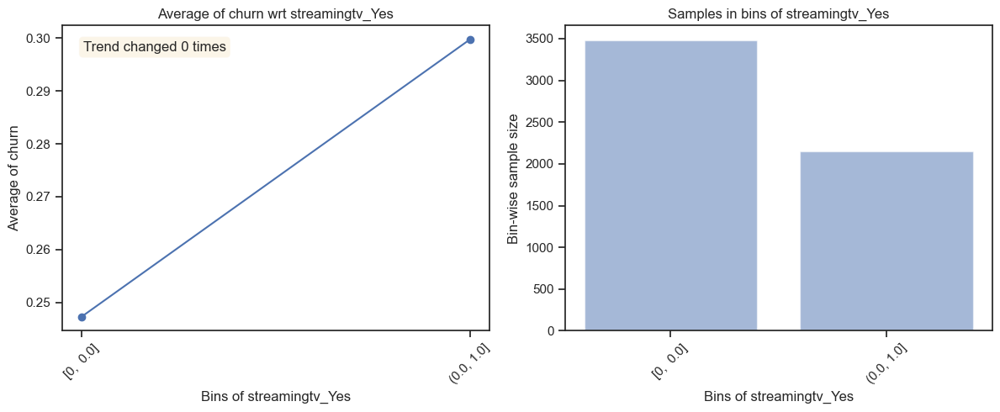

                                           Test data plots                                            


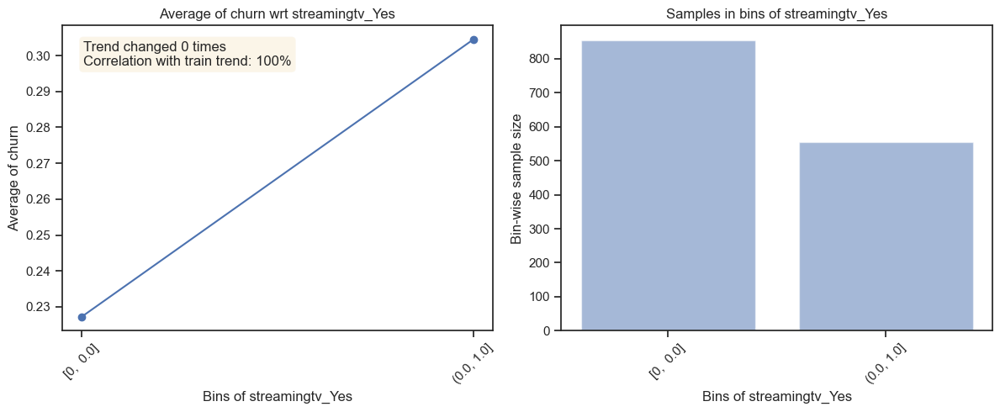

--------------------------------------------------------------------------------------------------------------


                                    Plots for streamingmovies_Yes                                     
                                           Train data plots                                           


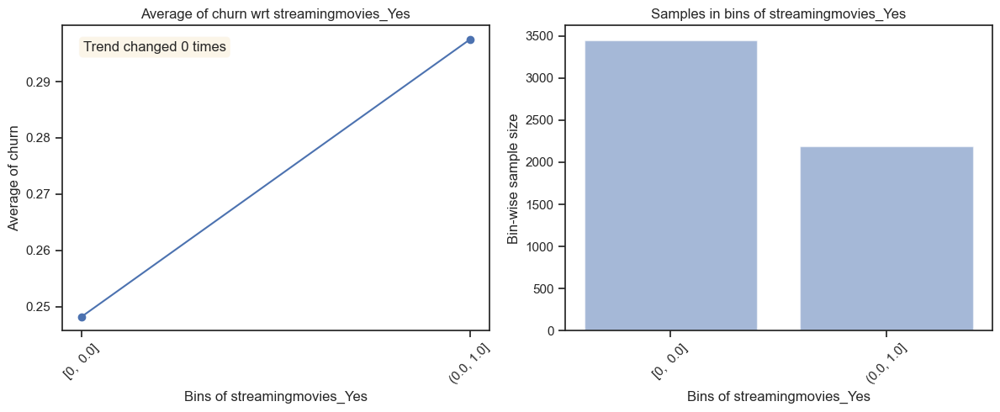

                                           Test data plots                                            


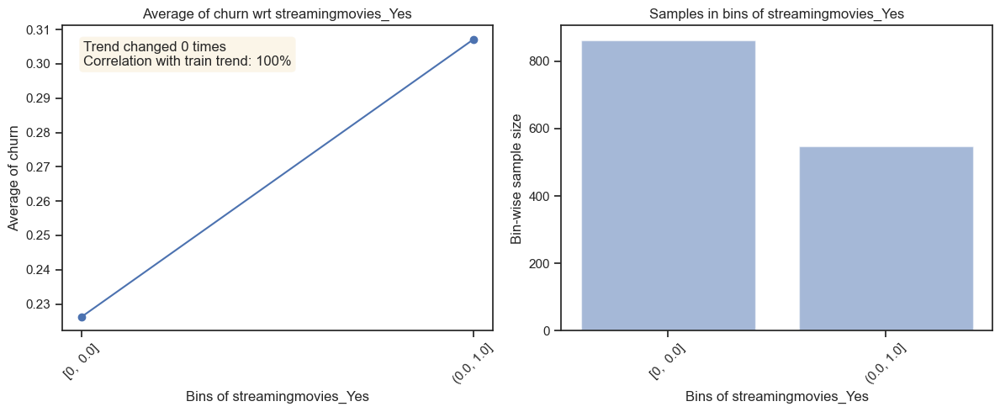

--------------------------------------------------------------------------------------------------------------


                                     Plots for contract_One year                                      
                                           Train data plots                                           


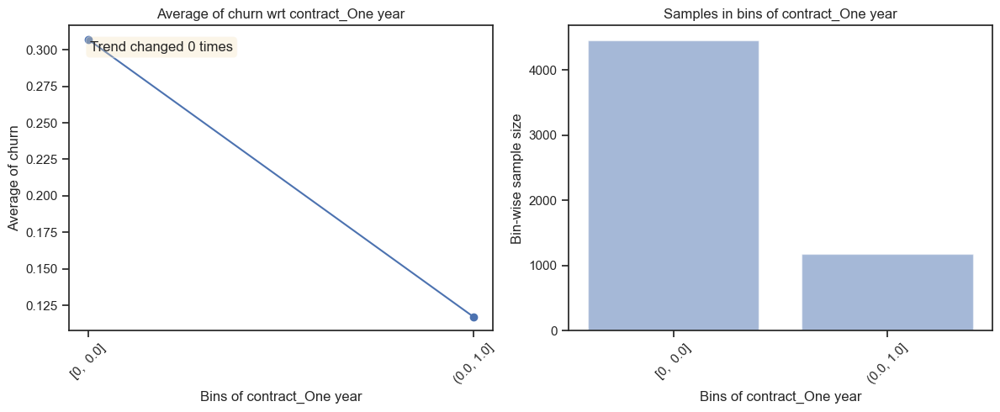

                                           Test data plots                                            


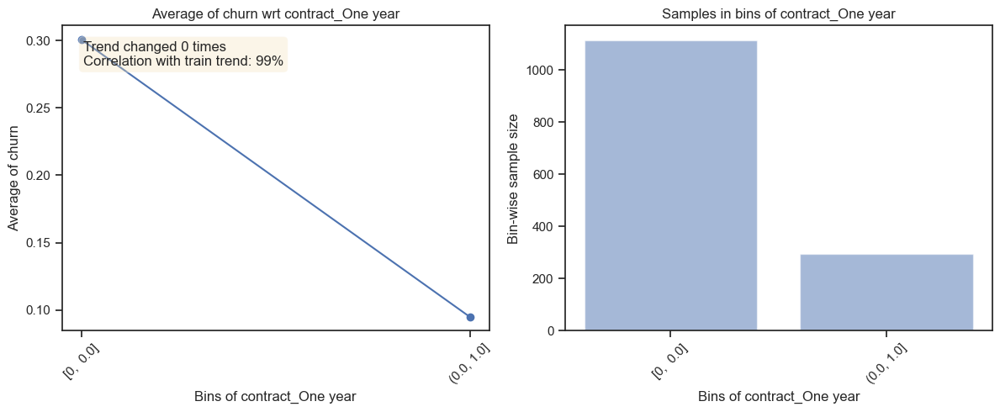

--------------------------------------------------------------------------------------------------------------


                                     Plots for contract_Two year                                      
                                           Train data plots                                           


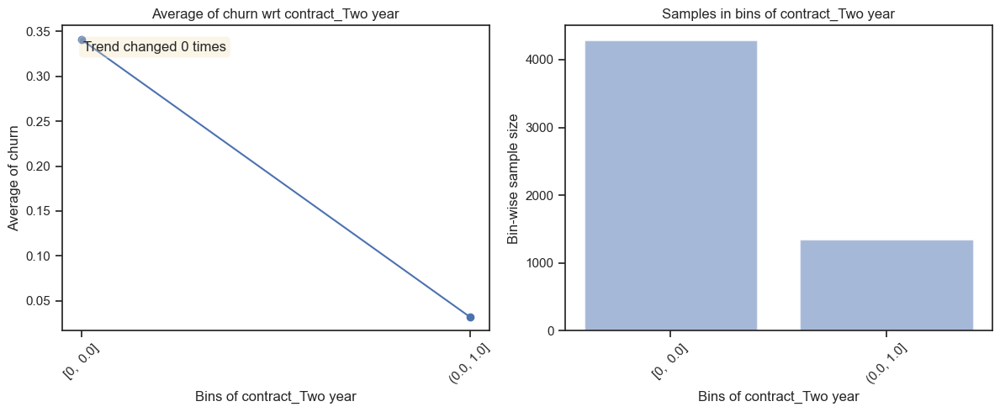

                                           Test data plots                                            


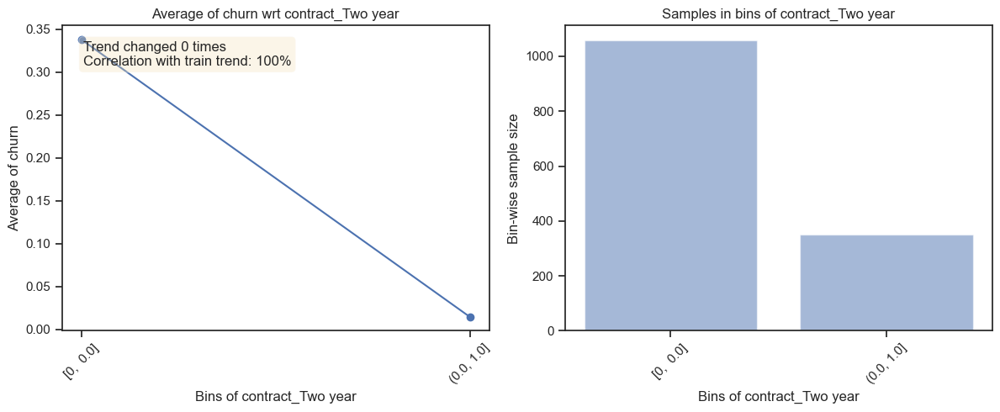

--------------------------------------------------------------------------------------------------------------


                                    Plots for paperlessbilling_Yes                                    
                                           Train data plots                                           


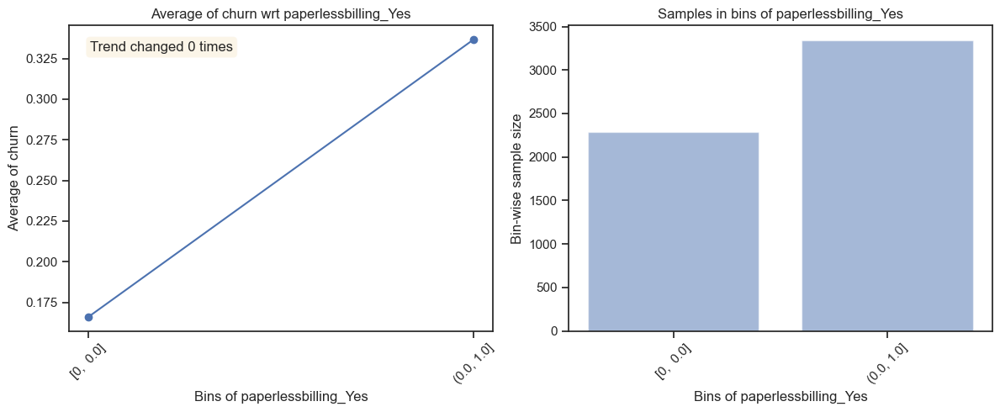

                                           Test data plots                                            


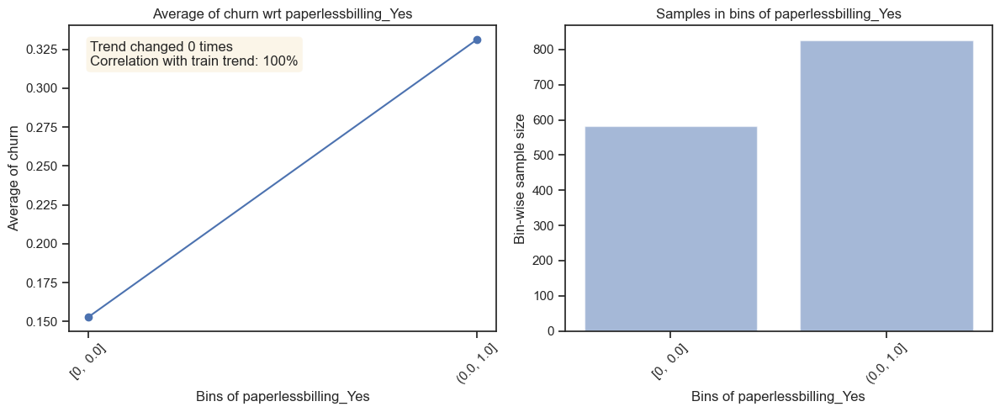

--------------------------------------------------------------------------------------------------------------


                           Plots for paymentmethod_Credit card (automatic)                            
                                           Train data plots                                           


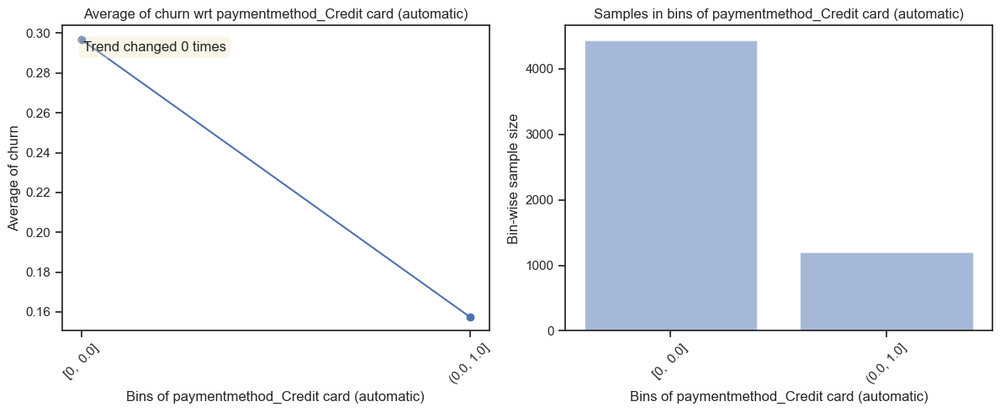

                                           Test data plots                                            


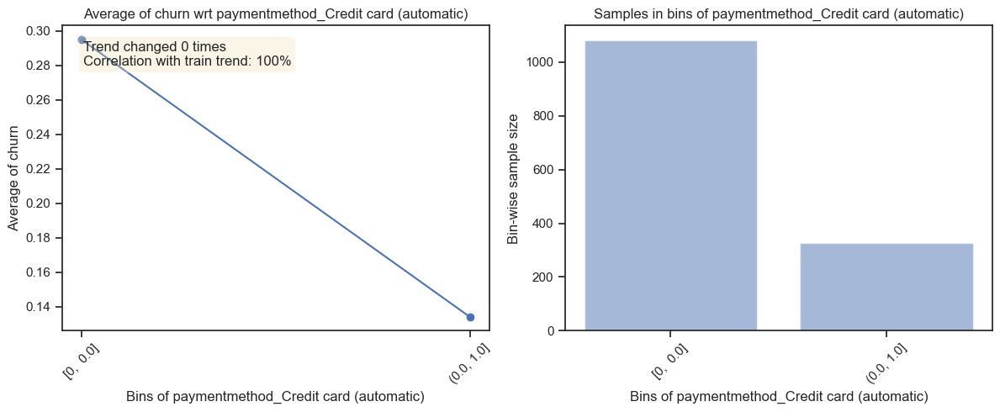

--------------------------------------------------------------------------------------------------------------


                               Plots for paymentmethod_Electronic check                               
                                           Train data plots                                           


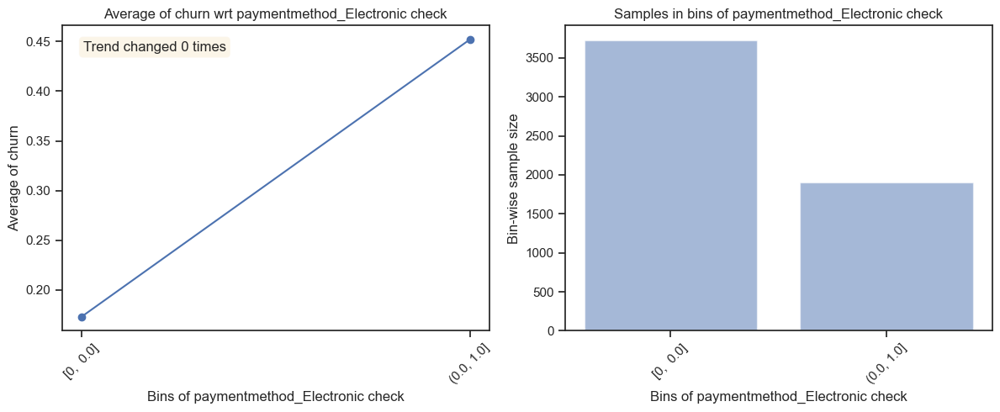

                                           Test data plots                                            


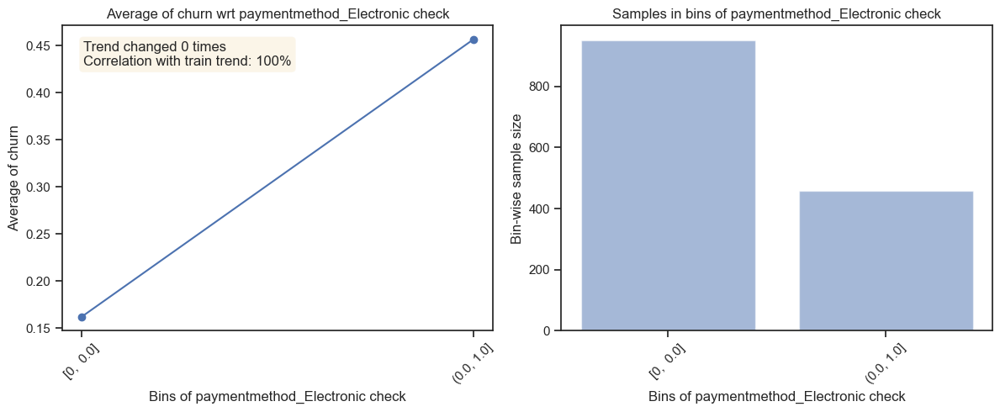

--------------------------------------------------------------------------------------------------------------


                                 Plots for paymentmethod_Mailed check                                 
                                           Train data plots                                           


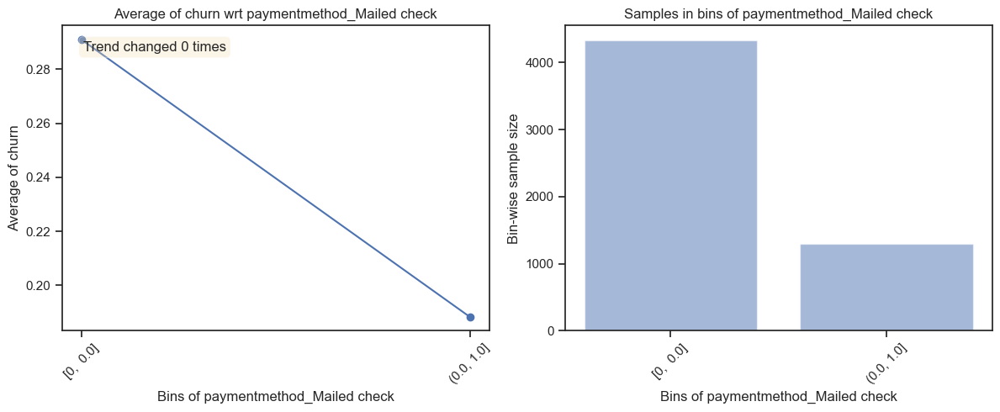

                                           Test data plots                                            


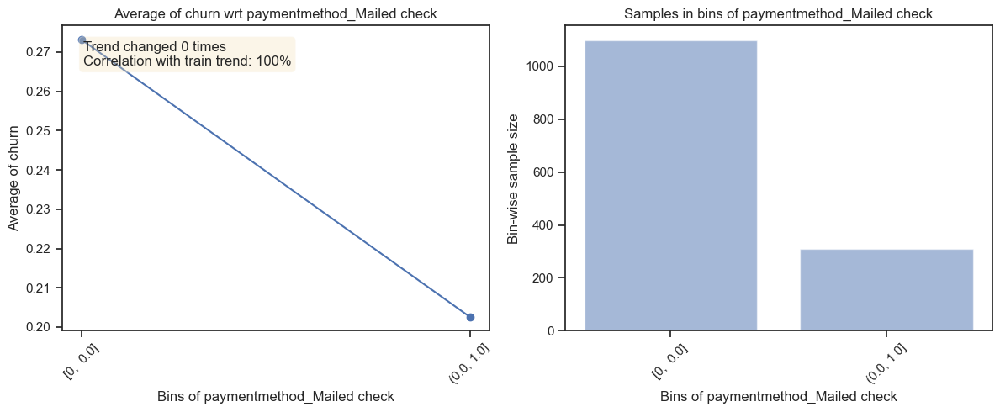

--------------------------------------------------------------------------------------------------------------


                         Plots for feat_gpd_Female_Partner_No_Dependents_Yes                          
                                           Train data plots                                           


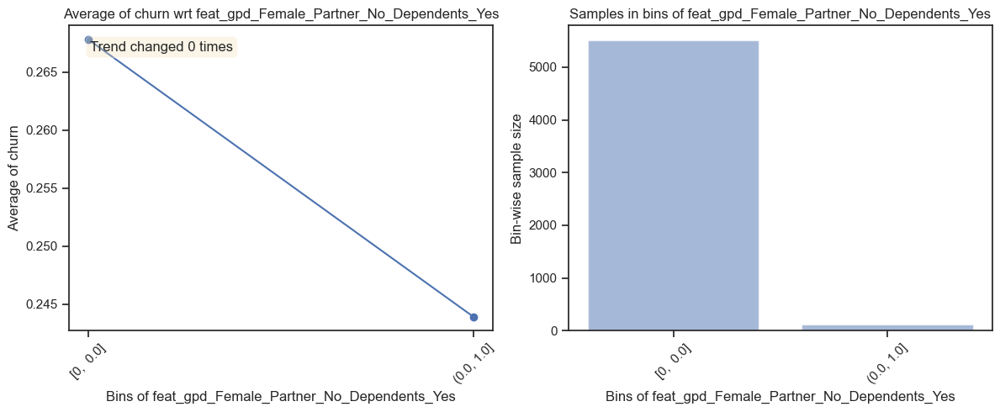

                                           Test data plots                                            


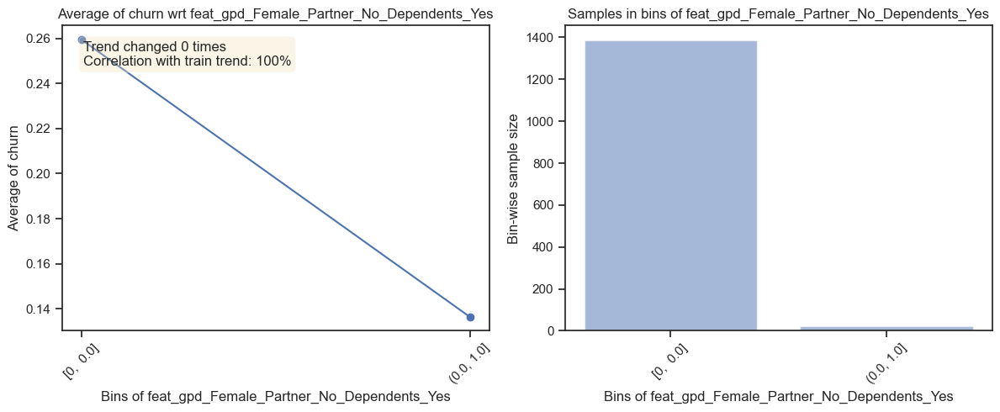

--------------------------------------------------------------------------------------------------------------


                         Plots for feat_gpd_Female_Partner_Yes_Dependents_No                          
                                           Train data plots                                           


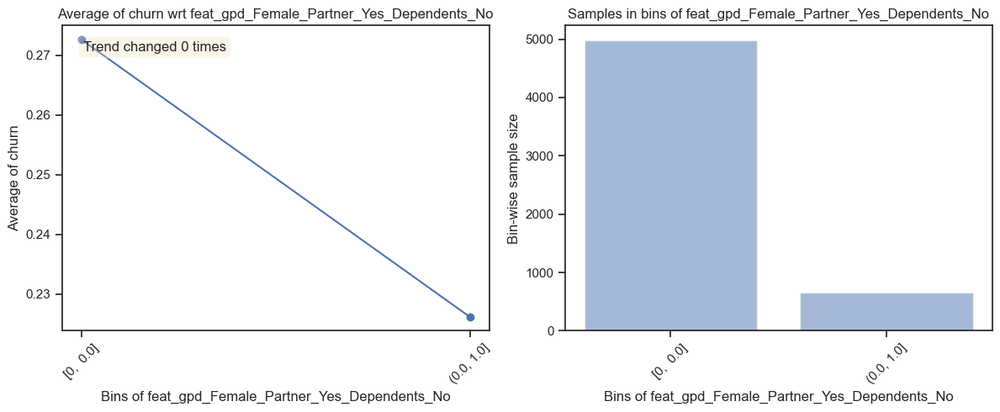

                                           Test data plots                                            


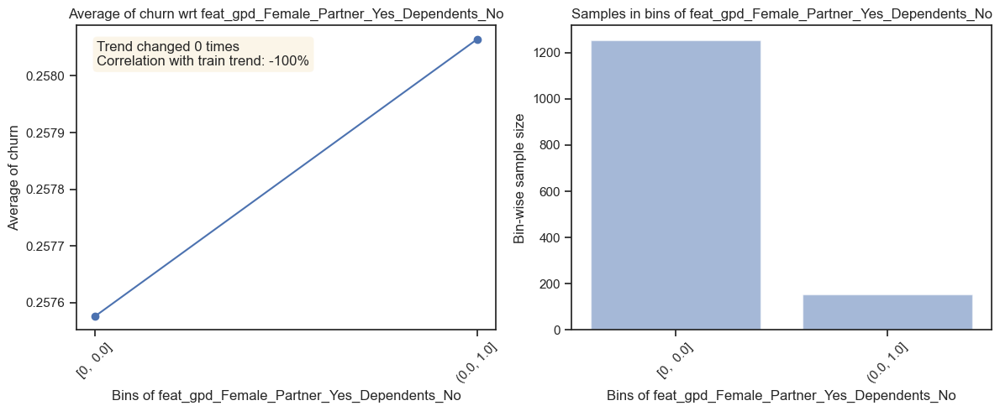

--------------------------------------------------------------------------------------------------------------


                         Plots for feat_gpd_Female_Partner_Yes_Dependents_Yes                         
                                           Train data plots                                           


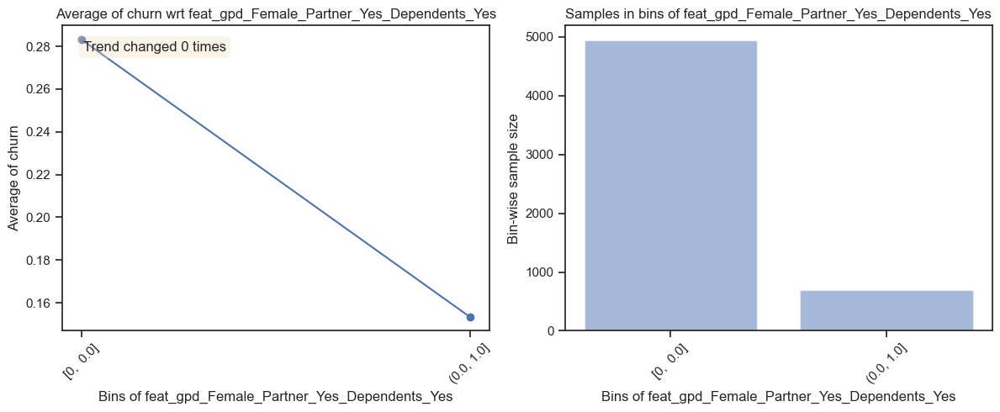

                                           Test data plots                                            


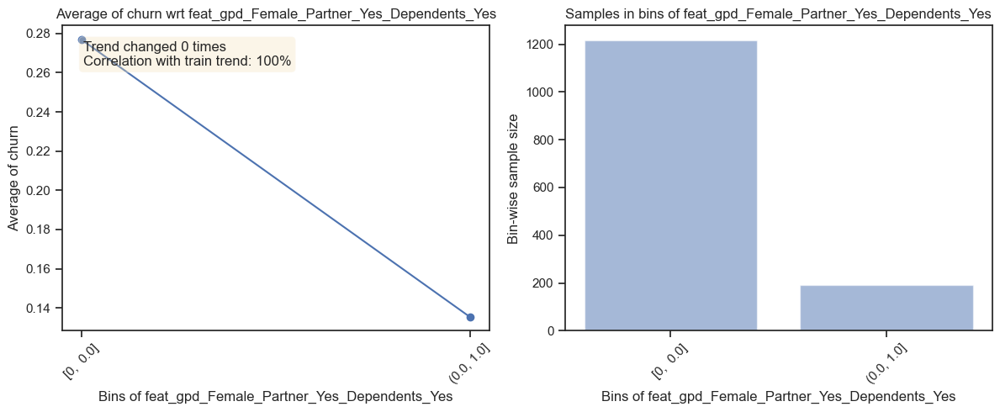

--------------------------------------------------------------------------------------------------------------


                           Plots for feat_gpd_Male_Partner_No_Dependents_No                           
                                           Train data plots                                           


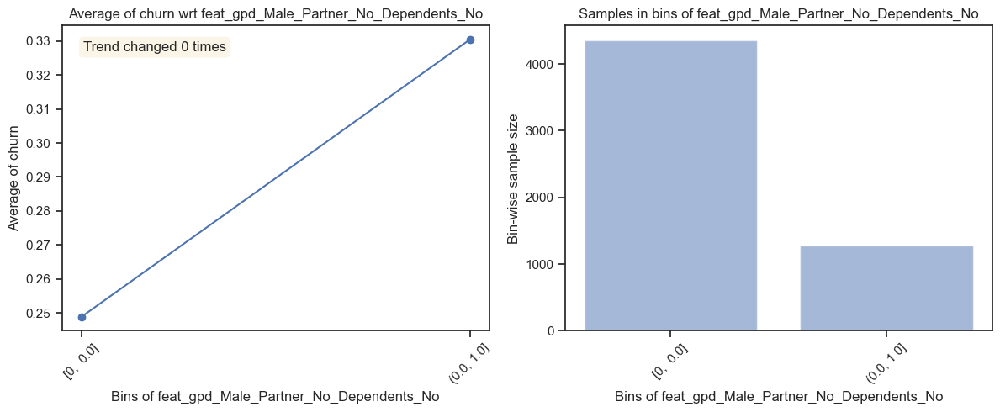

                                           Test data plots                                            


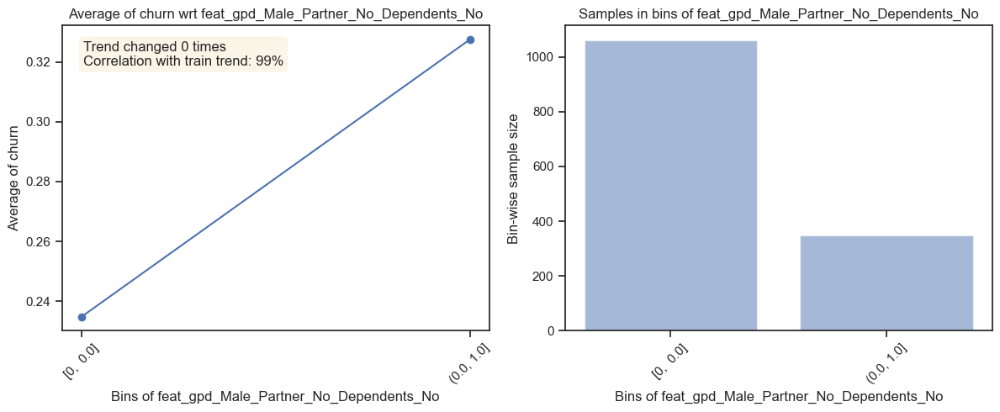

--------------------------------------------------------------------------------------------------------------


                          Plots for feat_gpd_Male_Partner_No_Dependents_Yes                           
                                           Train data plots                                           


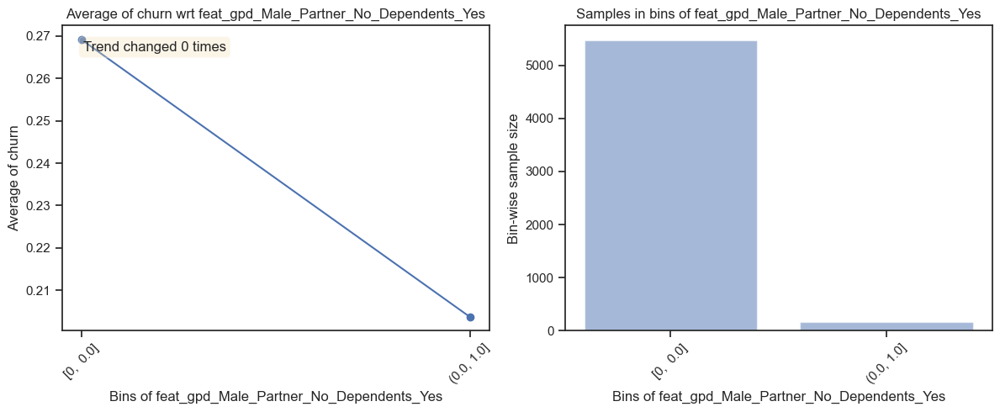

                                           Test data plots                                            


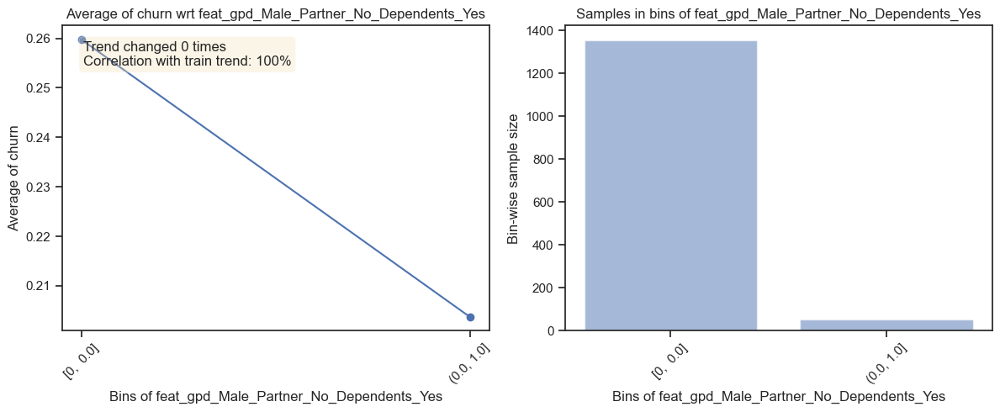

--------------------------------------------------------------------------------------------------------------


                          Plots for feat_gpd_Male_Partner_Yes_Dependents_No                           
                                           Train data plots                                           


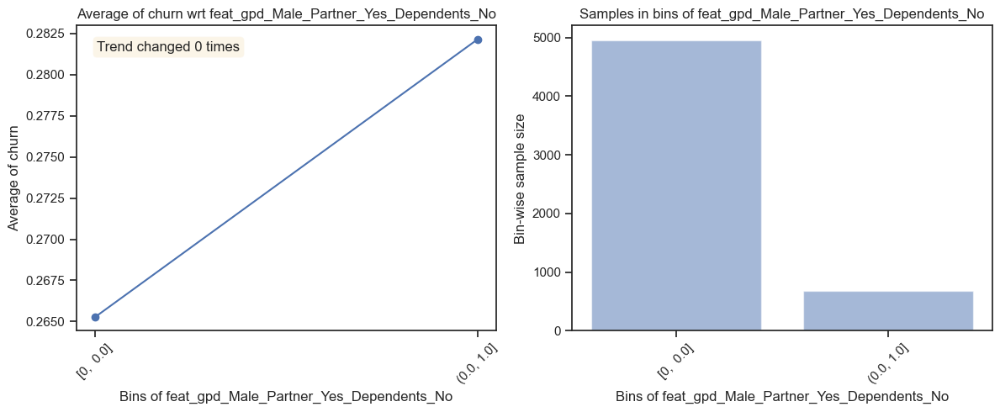

                                           Test data plots                                            


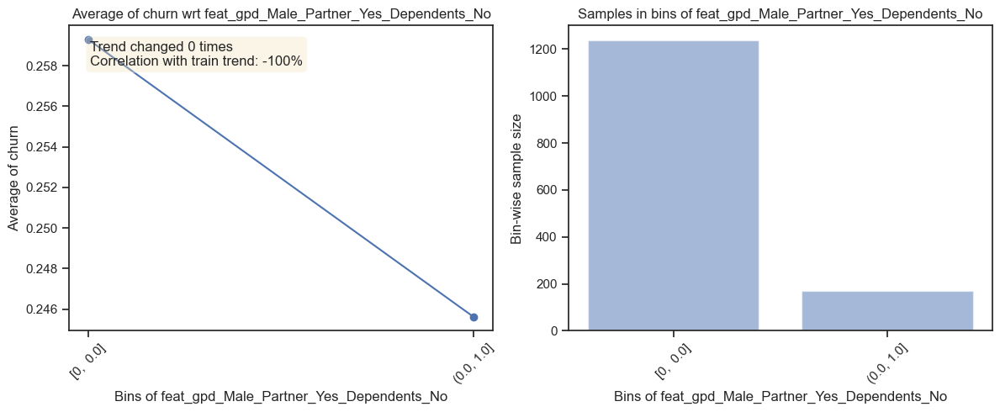

--------------------------------------------------------------------------------------------------------------


                          Plots for feat_gpd_Male_Partner_Yes_Dependents_Yes                          
                                           Train data plots                                           


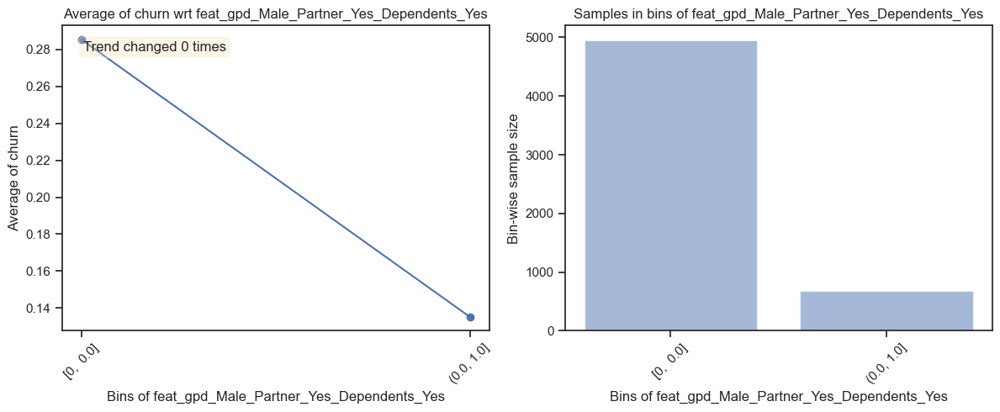

                                           Test data plots                                            


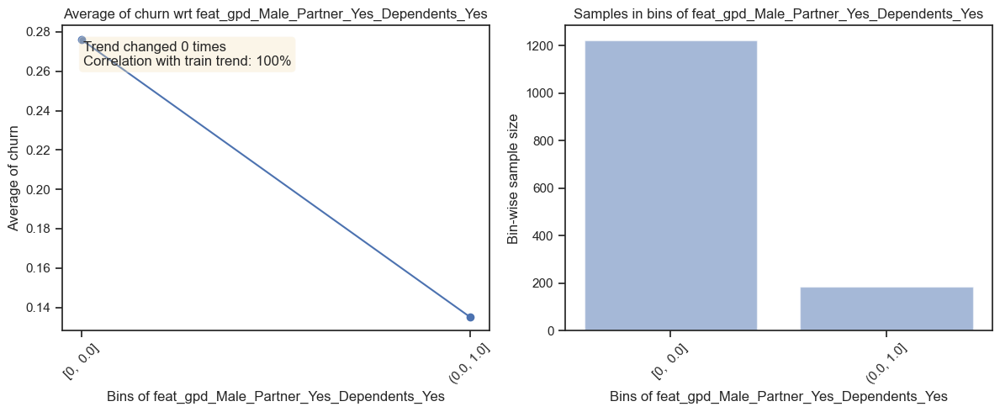

--------------------------------------------------------------------------------------------------------------


                               Plots for feat_gs_Female_Sr_Citizen_Yes                                
                                           Train data plots                                           


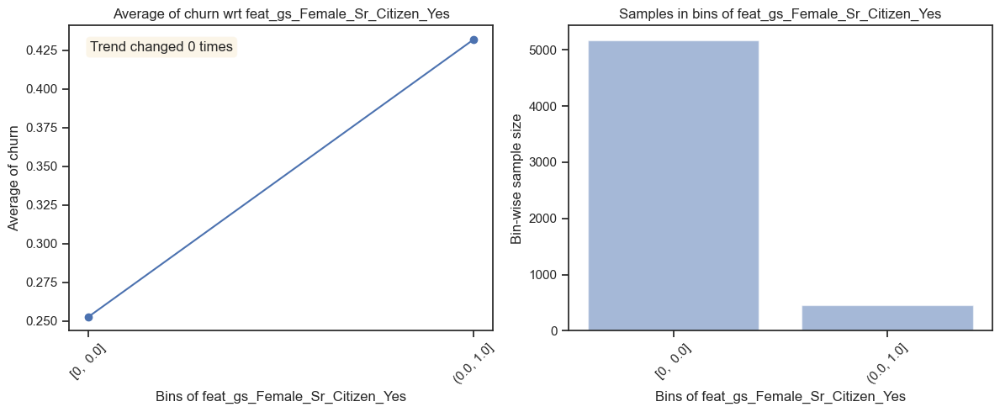

                                           Test data plots                                            


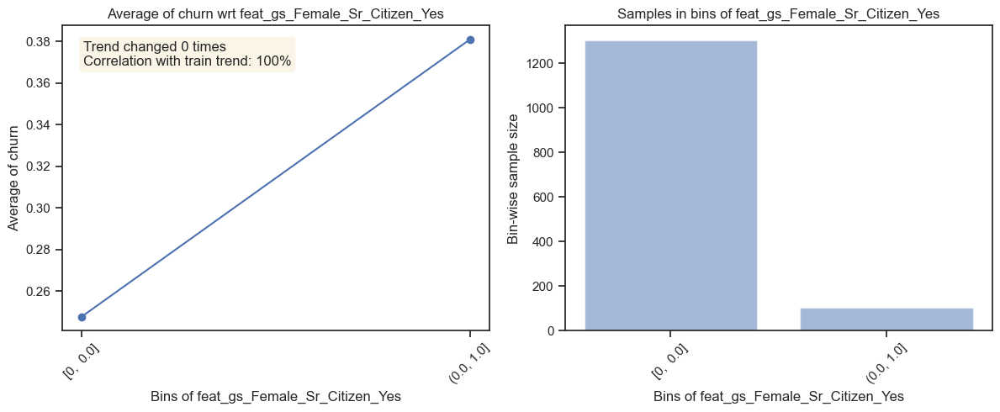

--------------------------------------------------------------------------------------------------------------


                                 Plots for feat_gs_Male_Sr_Citizen_No                                 
                                           Train data plots                                           


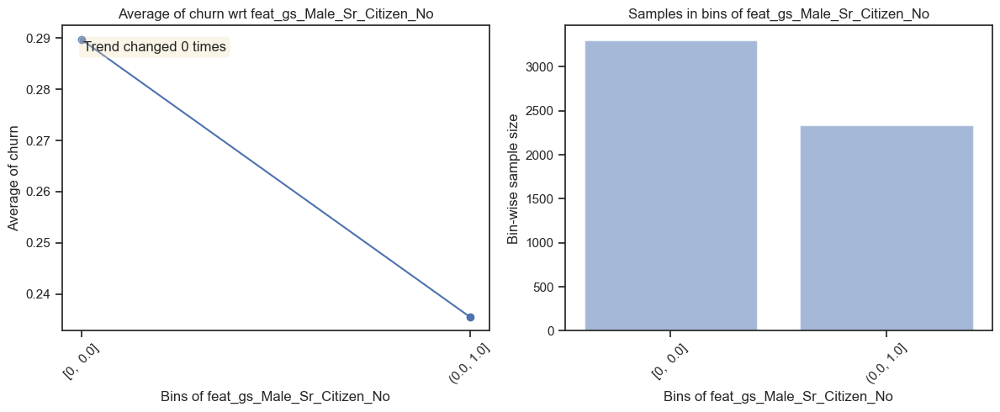

                                           Test data plots                                            


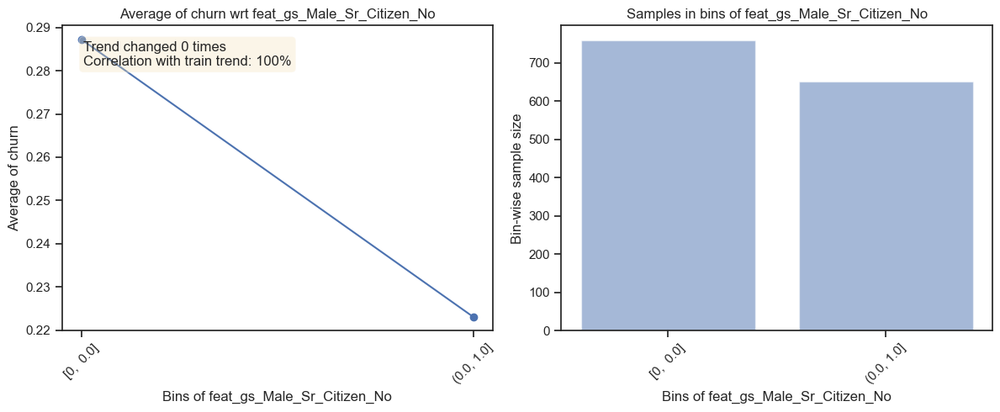

--------------------------------------------------------------------------------------------------------------


                                Plots for feat_gs_Male_Sr_Citizen_Yes                                 
                                           Train data plots                                           


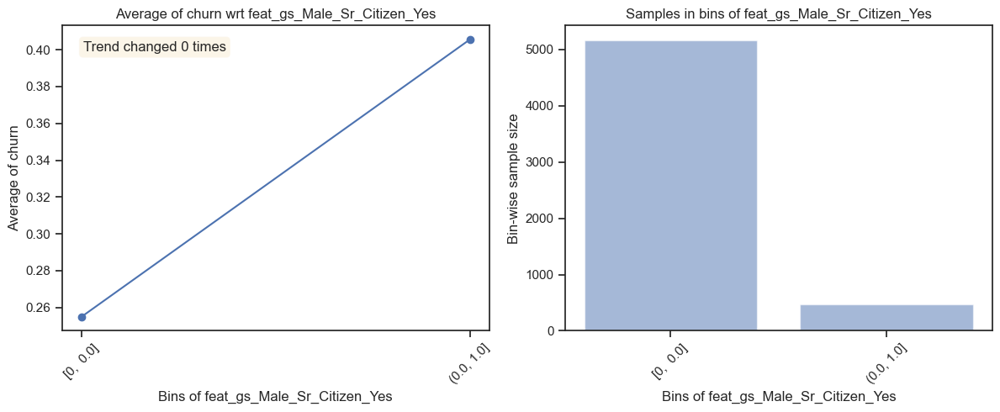

                                           Test data plots                                            


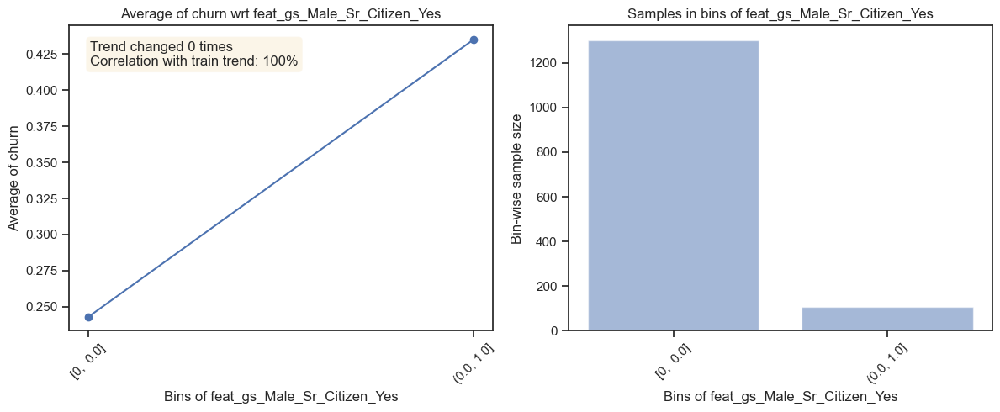

--------------------------------------------------------------------------------------------------------------


                         Plots for feat_gscp_Female_Sr_Citizen_No_Partner_Yes                         
                                           Train data plots                                           


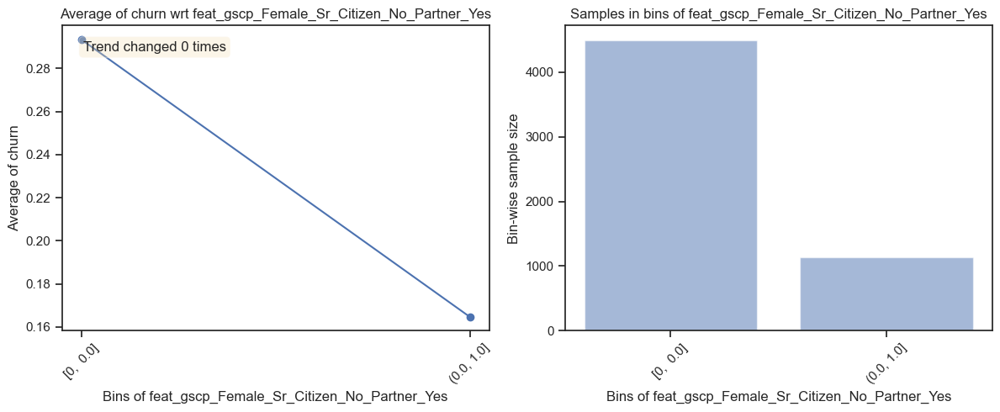

                                           Test data plots                                            


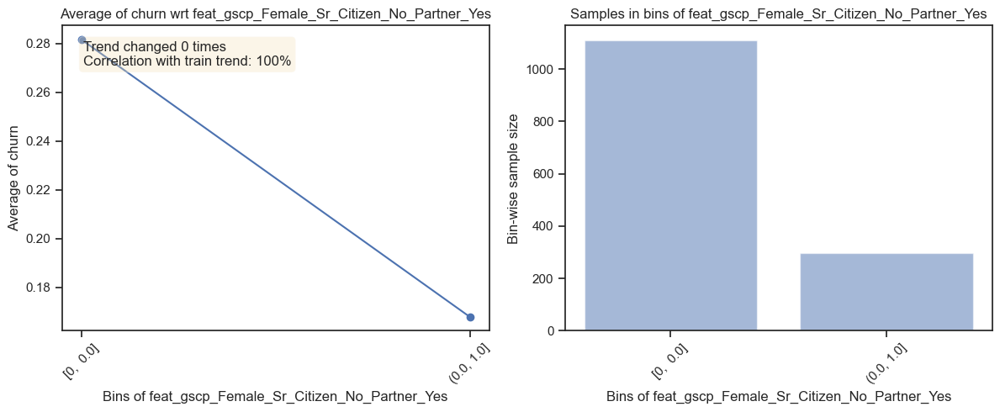

--------------------------------------------------------------------------------------------------------------


                         Plots for feat_gscp_Female_Sr_Citizen_Yes_Partner_No                         
                                           Train data plots                                           


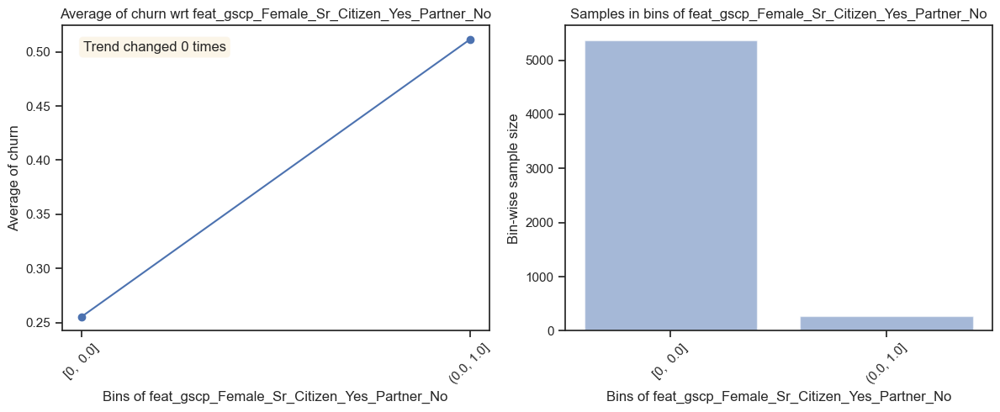

                                           Test data plots                                            


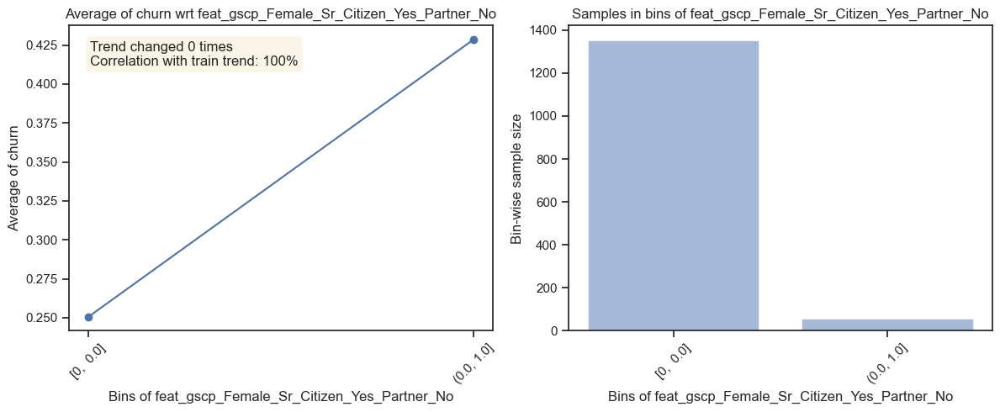

--------------------------------------------------------------------------------------------------------------


                        Plots for feat_gscp_Female_Sr_Citizen_Yes_Partner_Yes                         
                                           Train data plots                                           


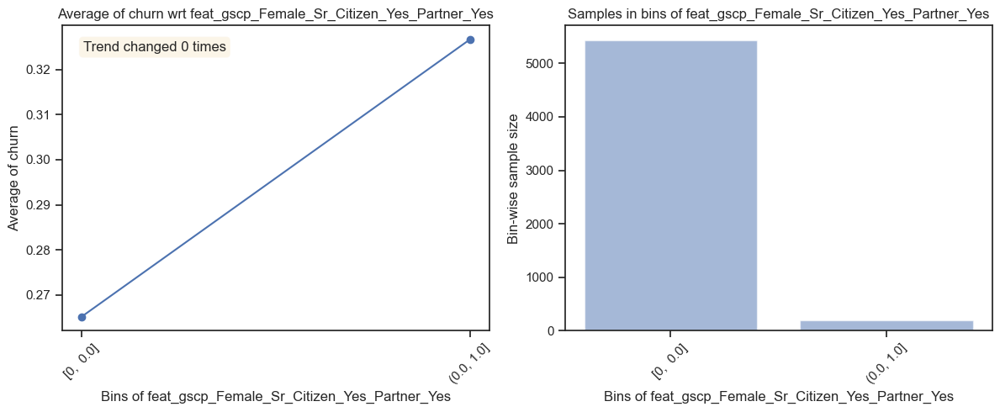

                                           Test data plots                                            


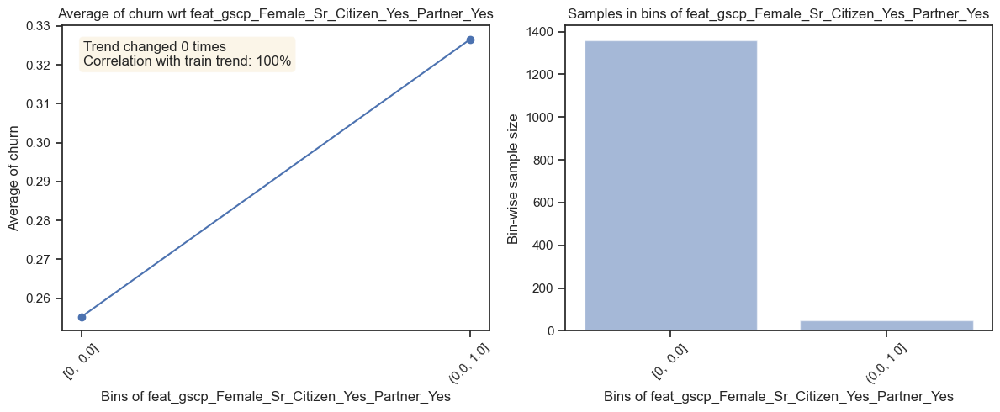

--------------------------------------------------------------------------------------------------------------


                          Plots for feat_gscp_Male_Sr_Citizen_No_Partner_No                           
                                           Train data plots                                           


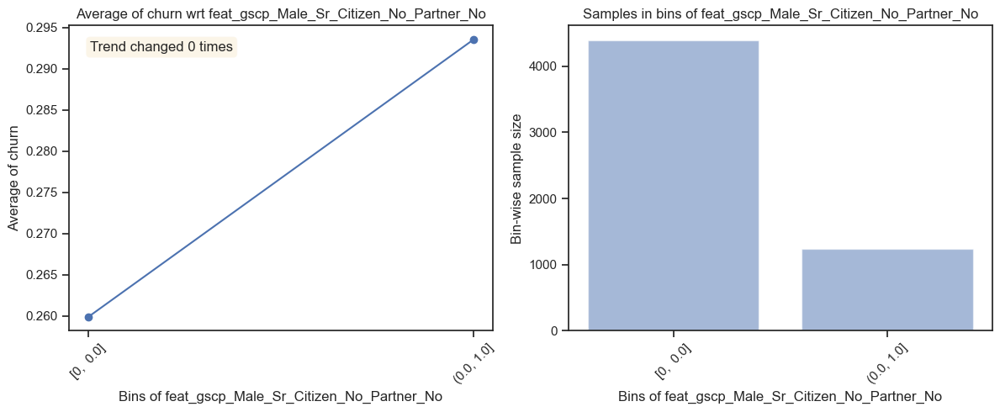

                                           Test data plots                                            


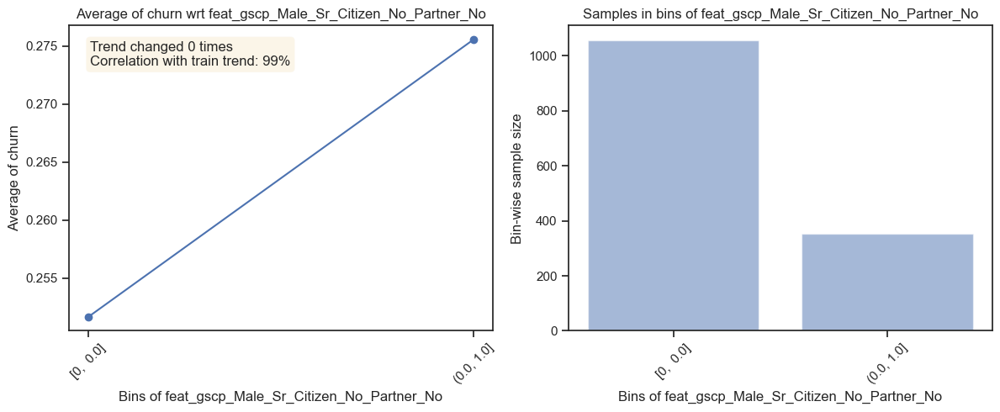

--------------------------------------------------------------------------------------------------------------


                          Plots for feat_gscp_Male_Sr_Citizen_No_Partner_Yes                          
                                           Train data plots                                           


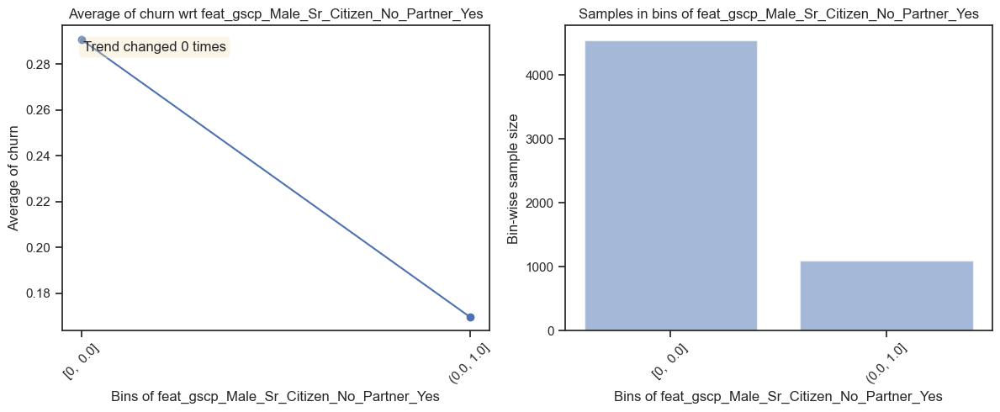

                                           Test data plots                                            


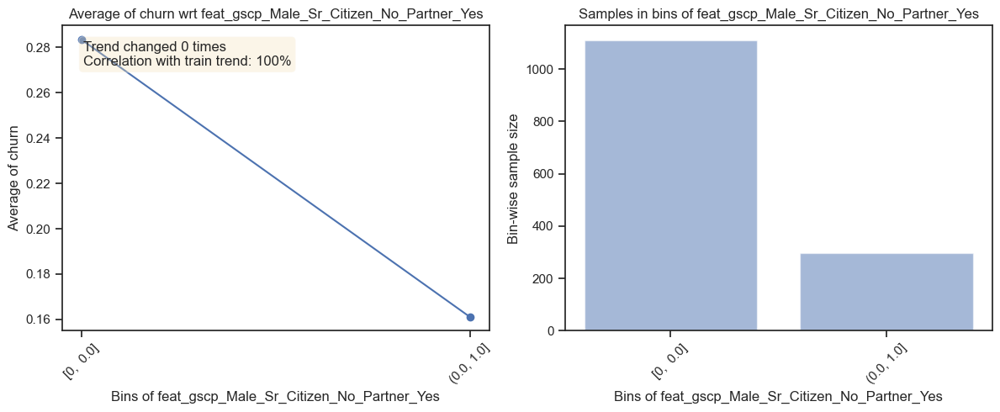

--------------------------------------------------------------------------------------------------------------


                          Plots for feat_gscp_Male_Sr_Citizen_Yes_Partner_No                          
                                           Train data plots                                           


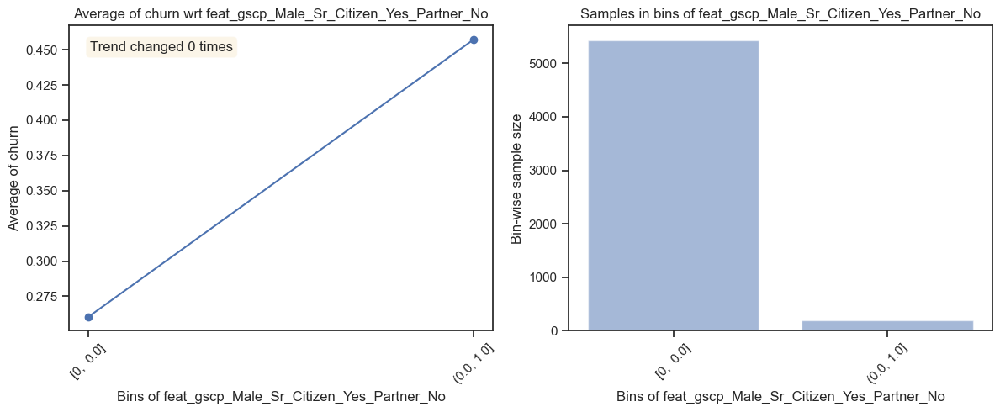

                                           Test data plots                                            


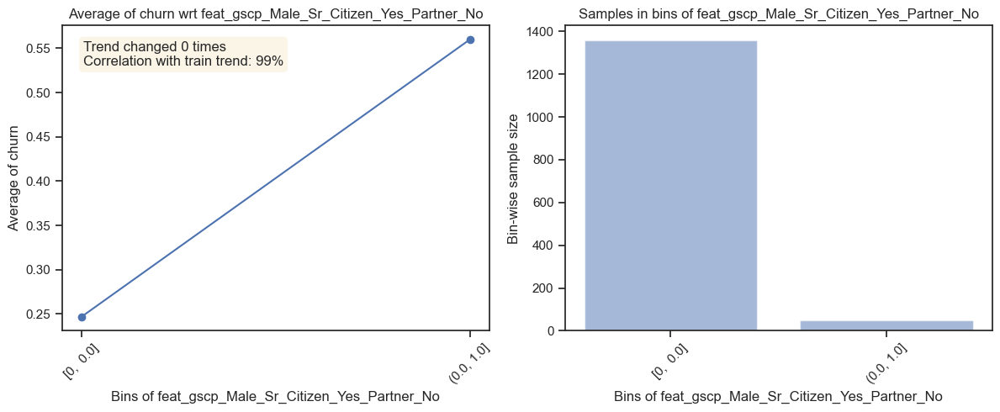

--------------------------------------------------------------------------------------------------------------


                         Plots for feat_gscp_Male_Sr_Citizen_Yes_Partner_Yes                          
                                           Train data plots                                           


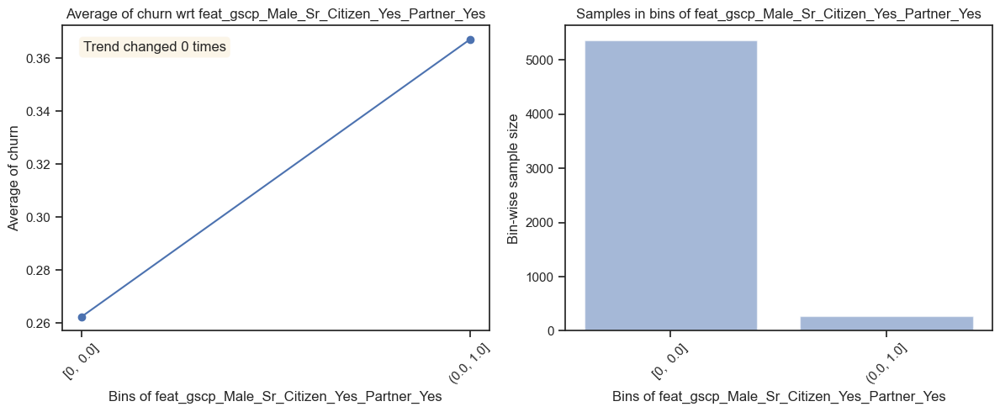

                                           Test data plots                                            


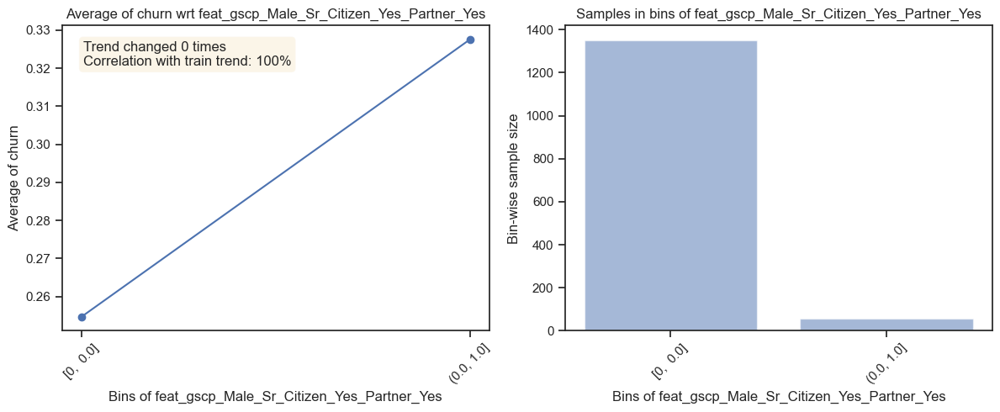

--------------------------------------------------------------------------------------------------------------


                               Plots for feat_sb_Security_No_Backup_Yes                               
                                           Train data plots                                           


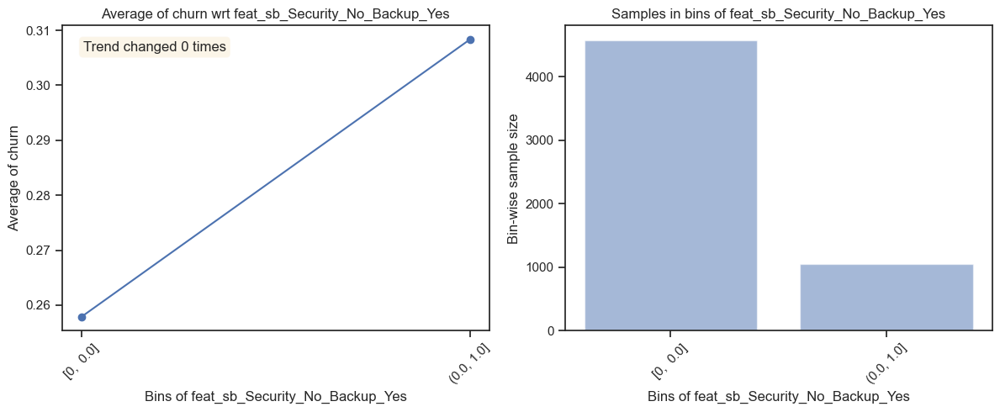

                                           Test data plots                                            


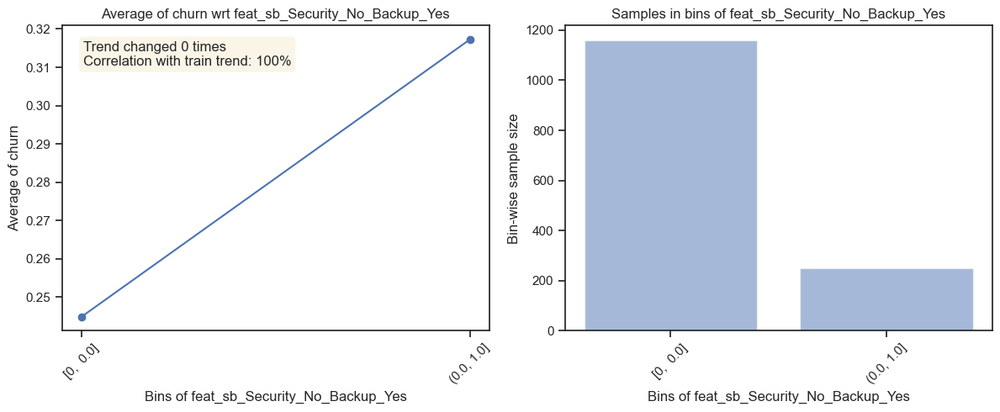

--------------------------------------------------------------------------------------------------------------


                               Plots for feat_sb_Security_Yes_Backup_No                               
                                           Train data plots                                           


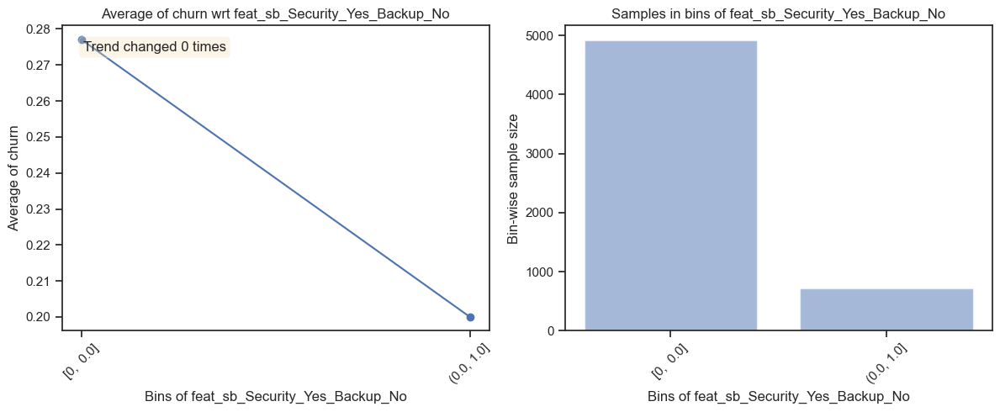

                                           Test data plots                                            


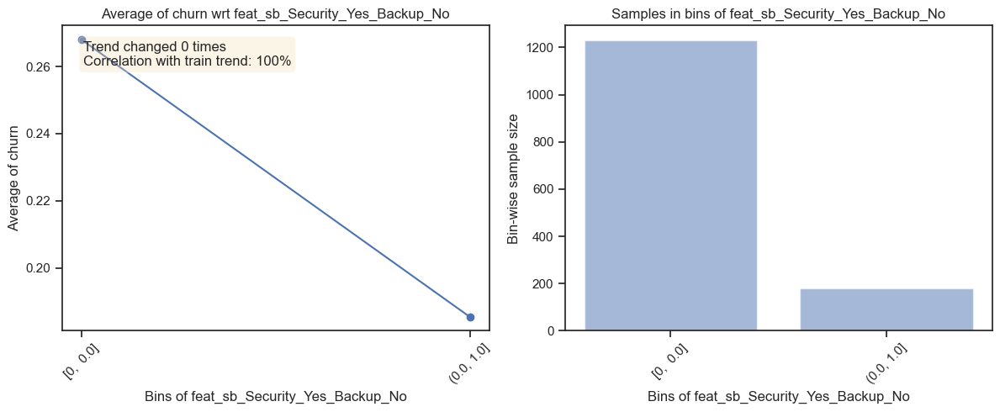

--------------------------------------------------------------------------------------------------------------


                              Plots for feat_sb_Security_Yes_Backup_Yes                               
                                           Train data plots                                           


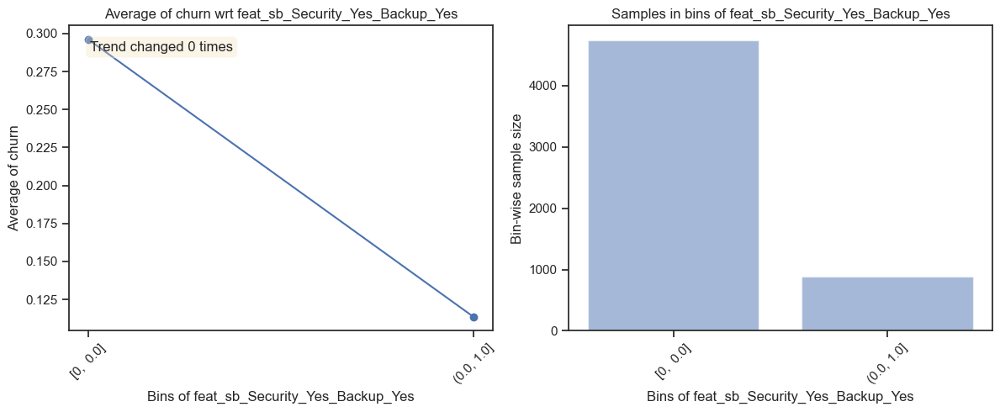

                                           Test data plots                                            


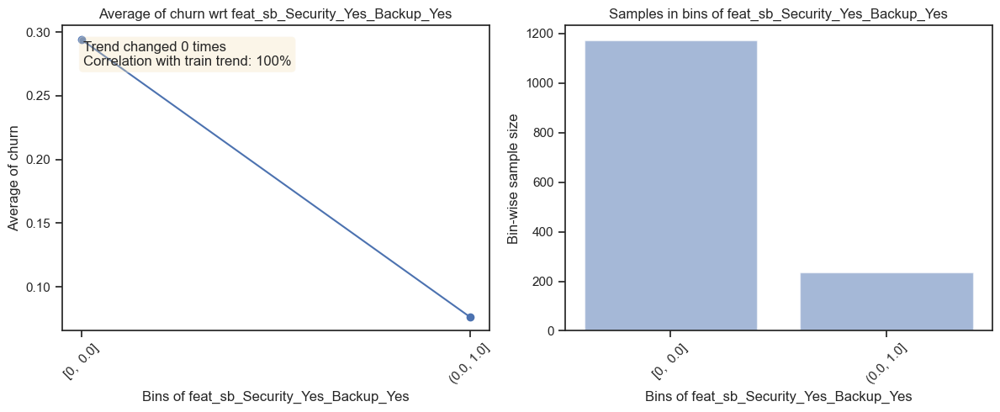

--------------------------------------------------------------------------------------------------------------


                      Plots for feat_sbd_Security_No_Backup_No_DeviceProtect_Yes                      
                                           Train data plots                                           


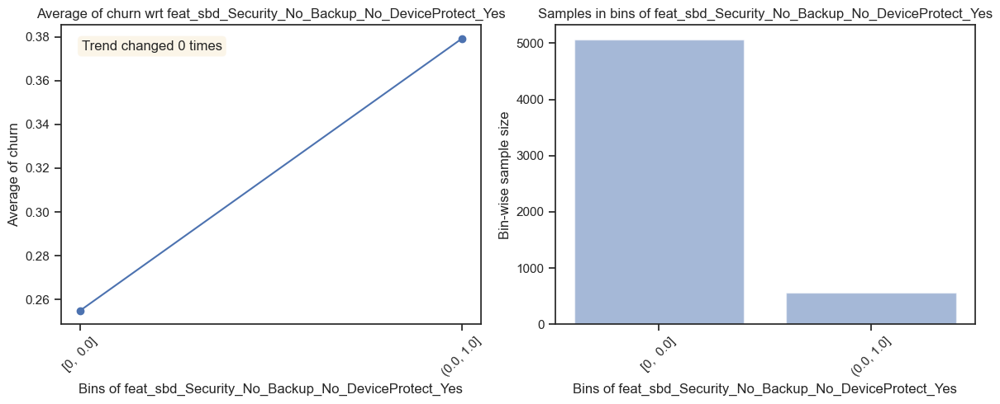

                                           Test data plots                                            


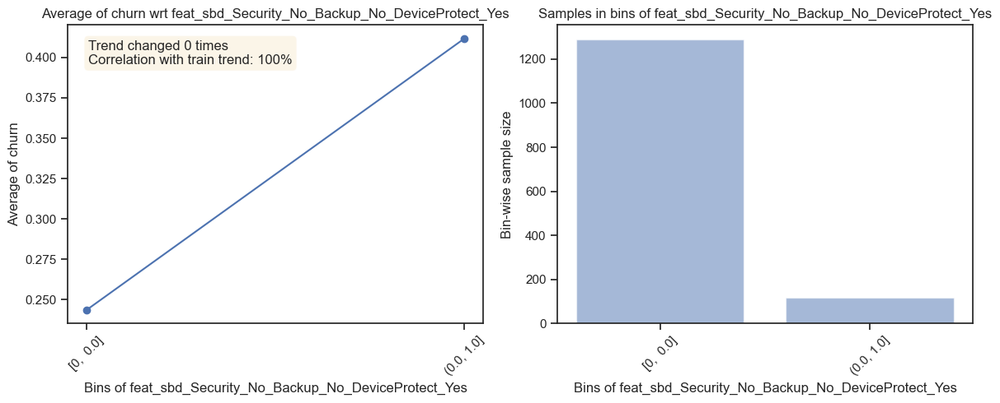

--------------------------------------------------------------------------------------------------------------


                      Plots for feat_sbd_Security_No_Backup_Yes_DeviceProtect_No                      
                                           Train data plots                                           


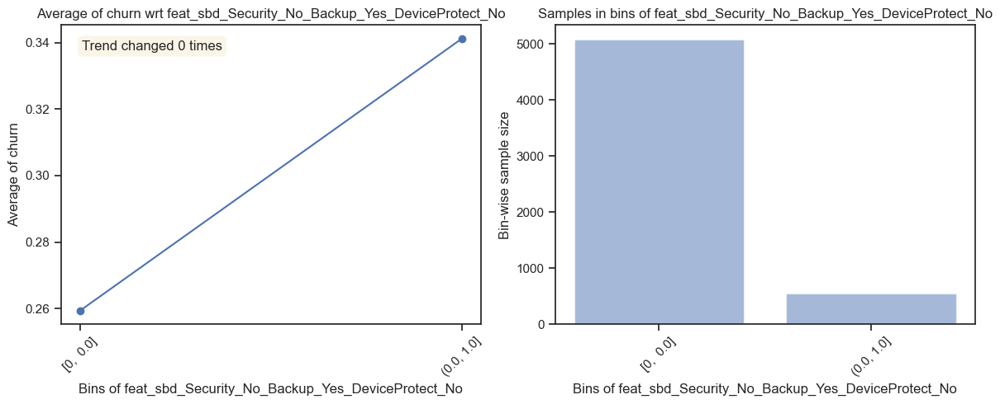

                                           Test data plots                                            


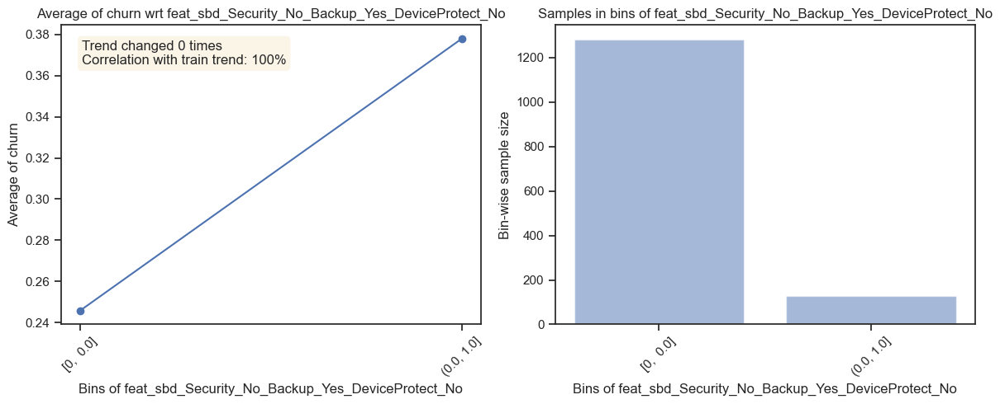

--------------------------------------------------------------------------------------------------------------


                     Plots for feat_sbd_Security_No_Backup_Yes_DeviceProtect_Yes                      
                                           Train data plots                                           


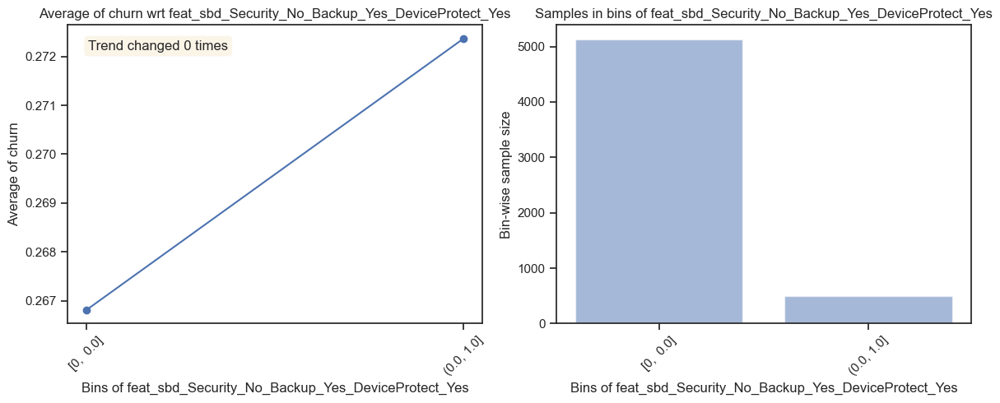

                                           Test data plots                                            


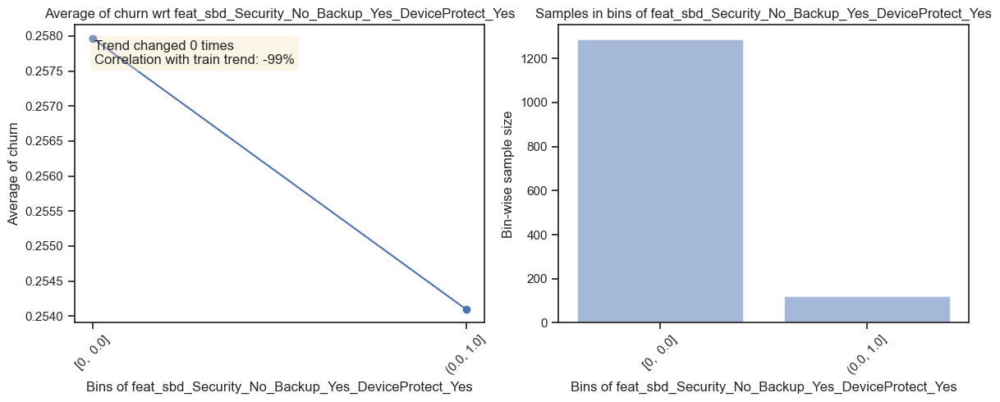

--------------------------------------------------------------------------------------------------------------


                      Plots for feat_sbd_Security_Yes_Backup_No_DeviceProtect_No                      
                                           Train data plots                                           


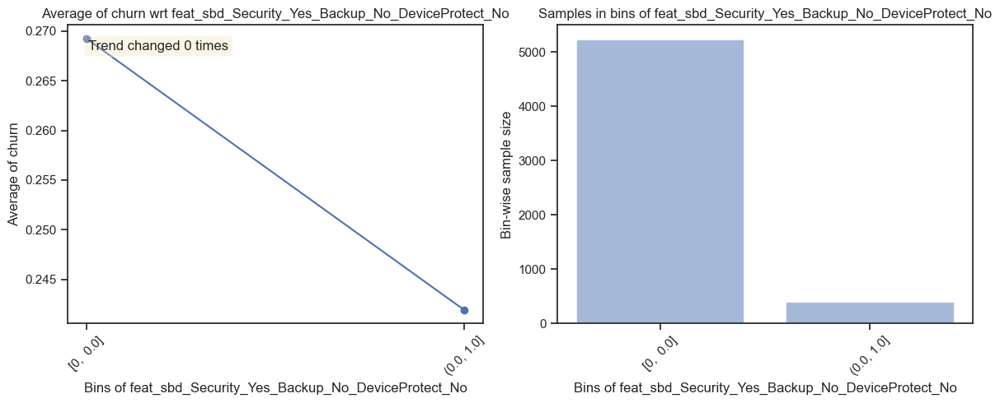

                                           Test data plots                                            


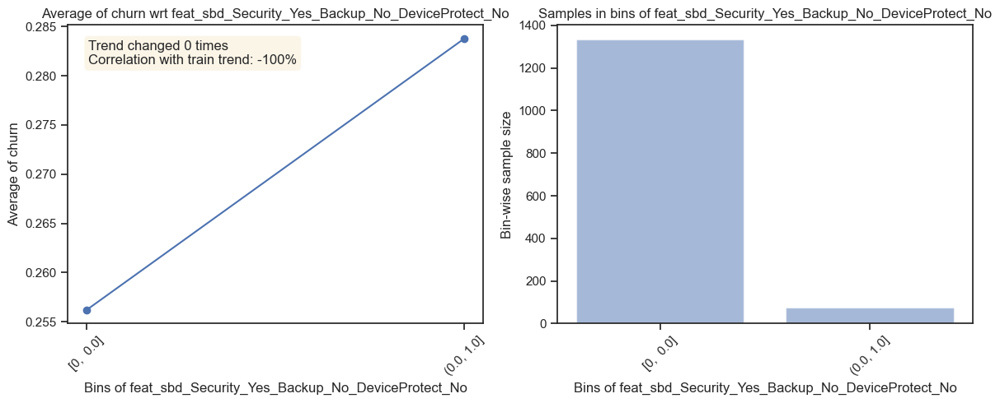

--------------------------------------------------------------------------------------------------------------


                     Plots for feat_sbd_Security_Yes_Backup_No_DeviceProtect_Yes                      
                                           Train data plots                                           


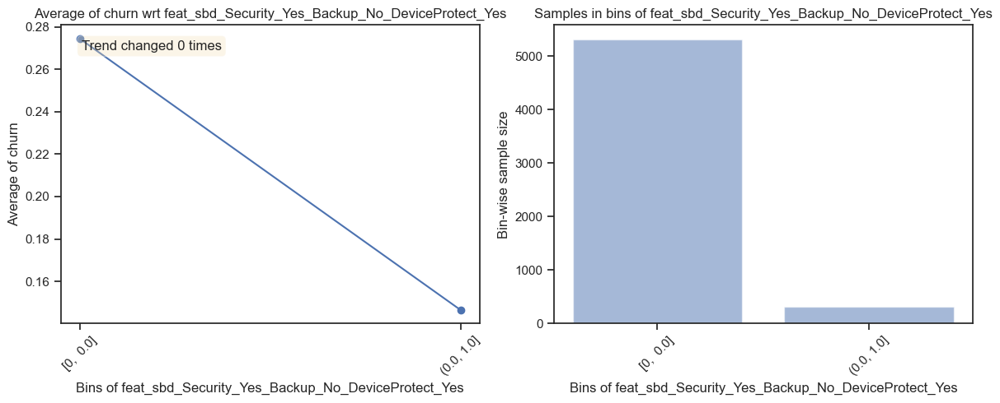

                                           Test data plots                                            


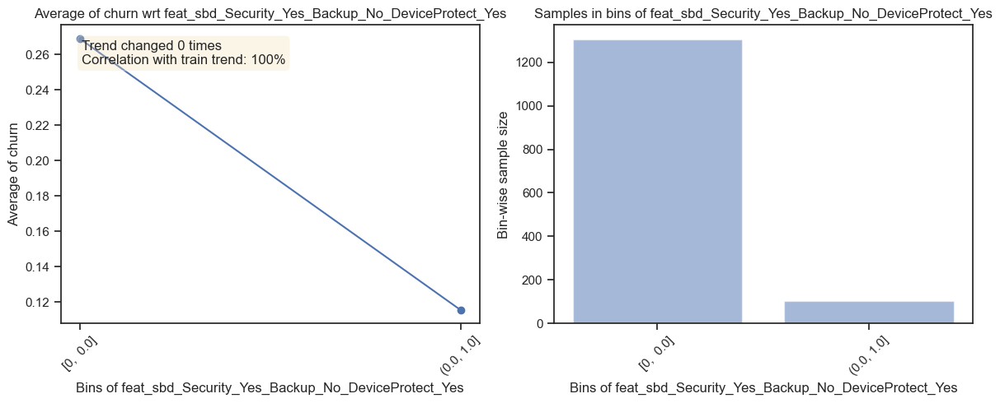

--------------------------------------------------------------------------------------------------------------


                     Plots for feat_sbd_Security_Yes_Backup_Yes_DeviceProtect_No                      
                                           Train data plots                                           


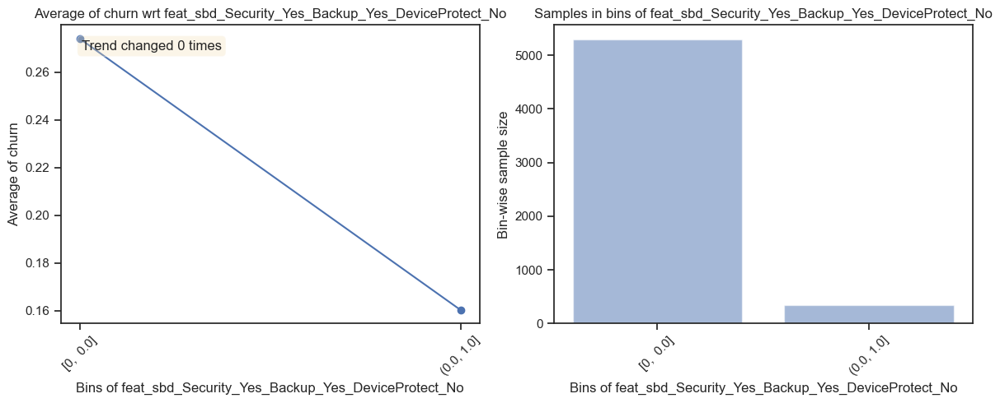

                                           Test data plots                                            


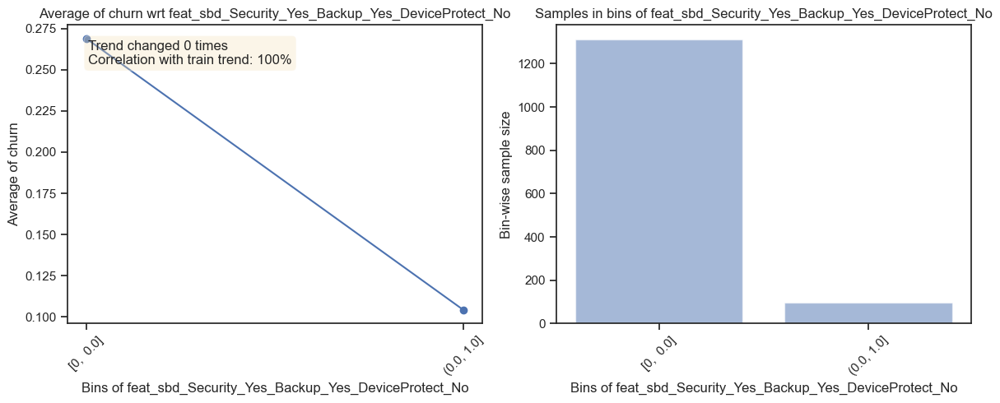

--------------------------------------------------------------------------------------------------------------


                     Plots for feat_sbd_Security_Yes_Backup_Yes_DeviceProtect_Yes                     
                                           Train data plots                                           


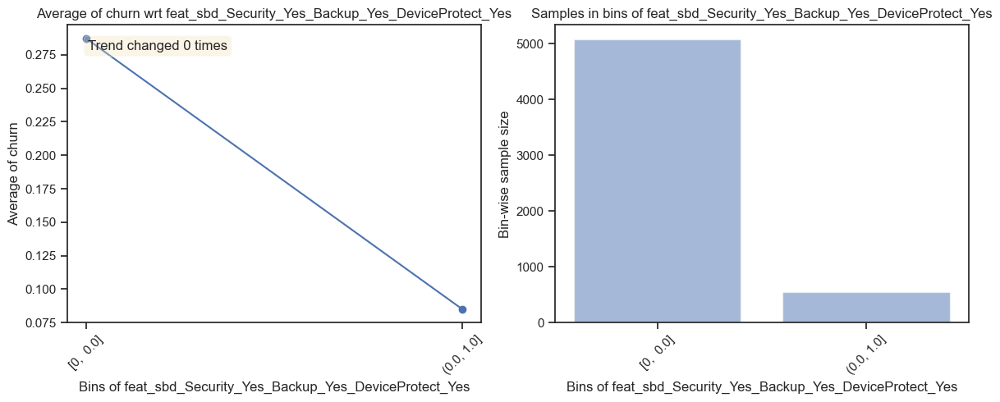

                                           Test data plots                                            


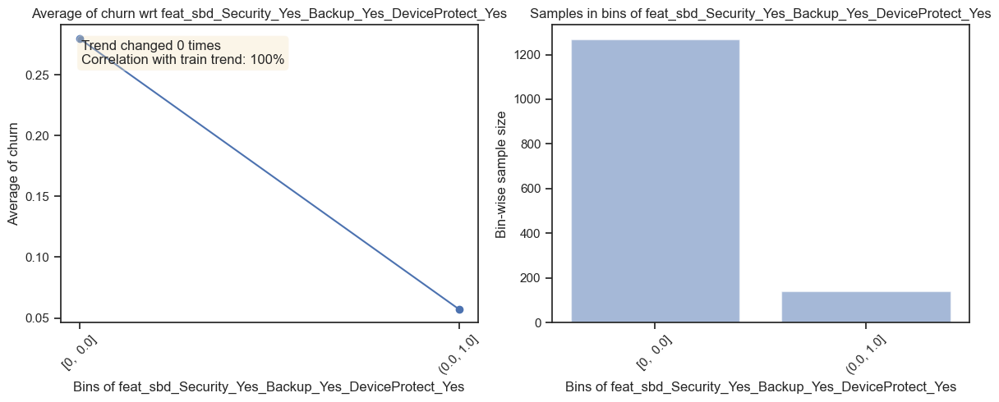

--------------------------------------------------------------------------------------------------------------


              Plots for feat_sbdt_Security_No_Backup_No_DeviceProtect_No_TechSupport_Yes              
                                           Train data plots                                           


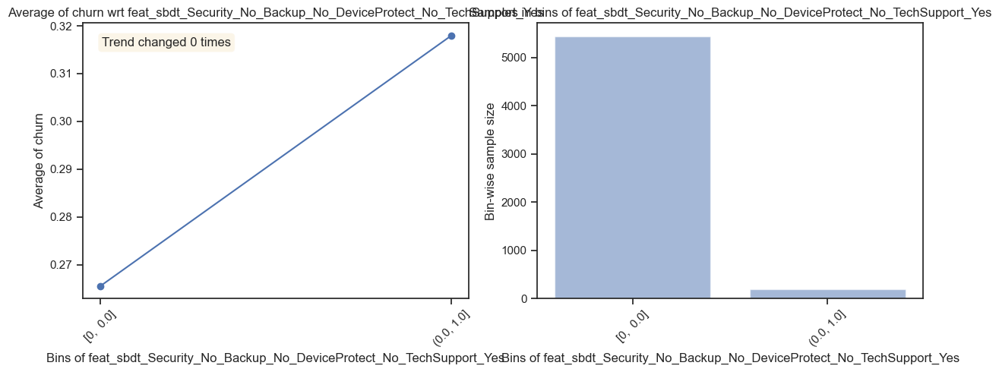

                                           Test data plots                                            


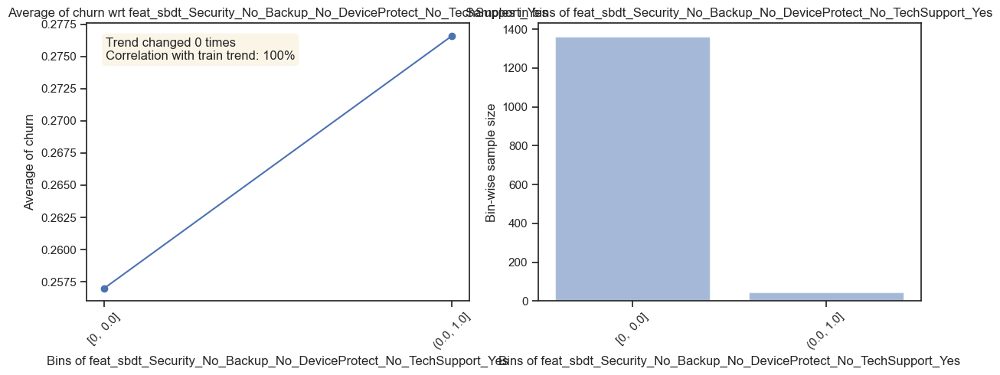

--------------------------------------------------------------------------------------------------------------


              Plots for feat_sbdt_Security_No_Backup_No_DeviceProtect_Yes_TechSupport_No              
                                           Train data plots                                           


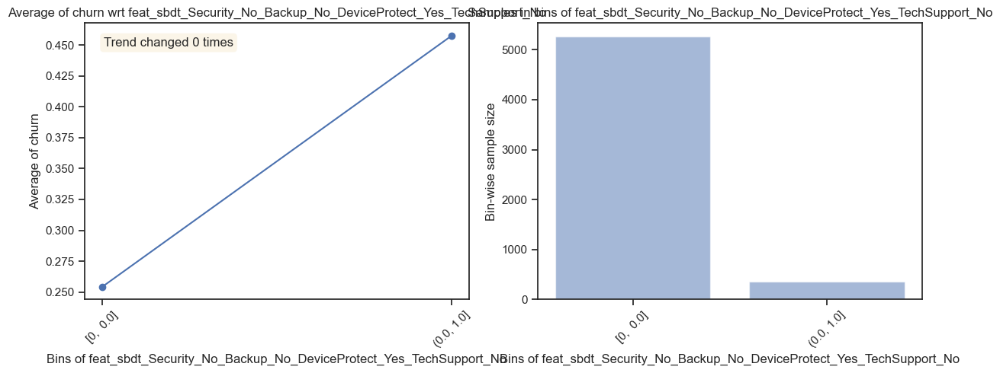

                                           Test data plots                                            


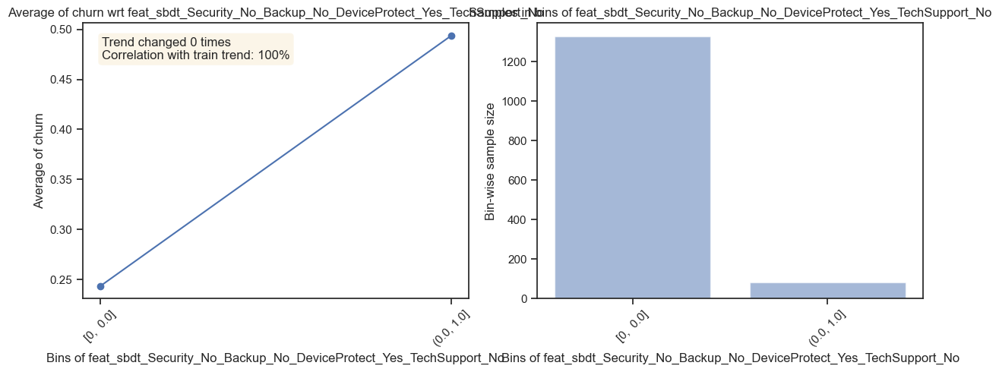

--------------------------------------------------------------------------------------------------------------


             Plots for feat_sbdt_Security_No_Backup_No_DeviceProtect_Yes_TechSupport_Yes              
                                           Train data plots                                           


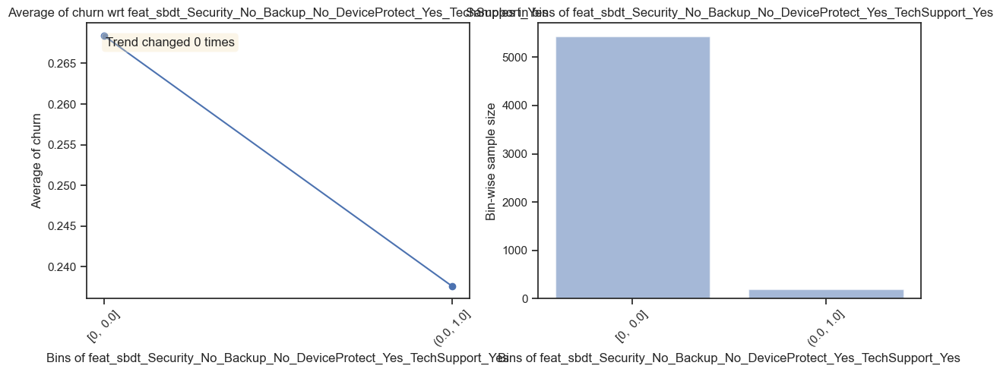

                                           Test data plots                                            


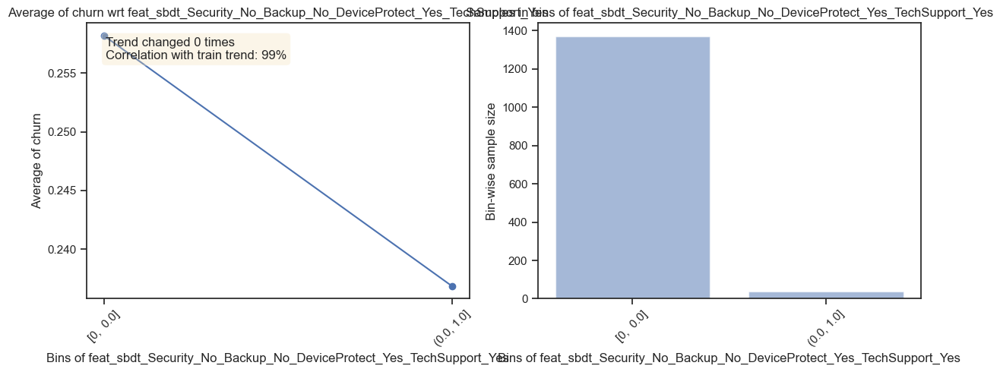

--------------------------------------------------------------------------------------------------------------


              Plots for feat_sbdt_Security_No_Backup_Yes_DeviceProtect_No_TechSupport_No              
                                           Train data plots                                           


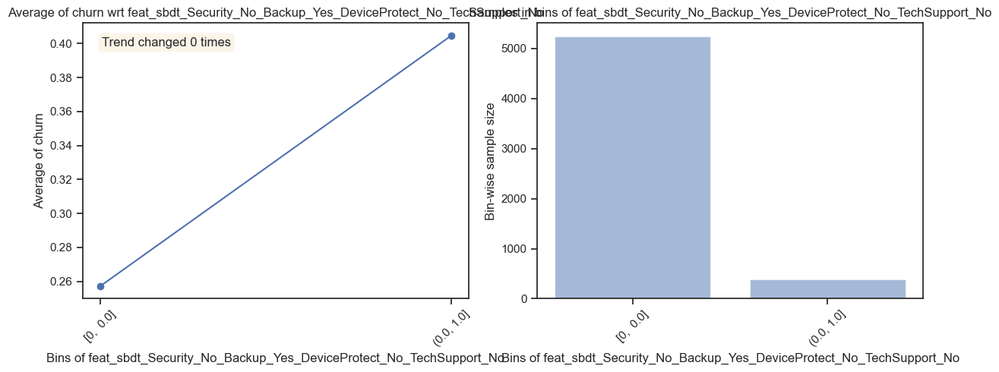

                                           Test data plots                                            


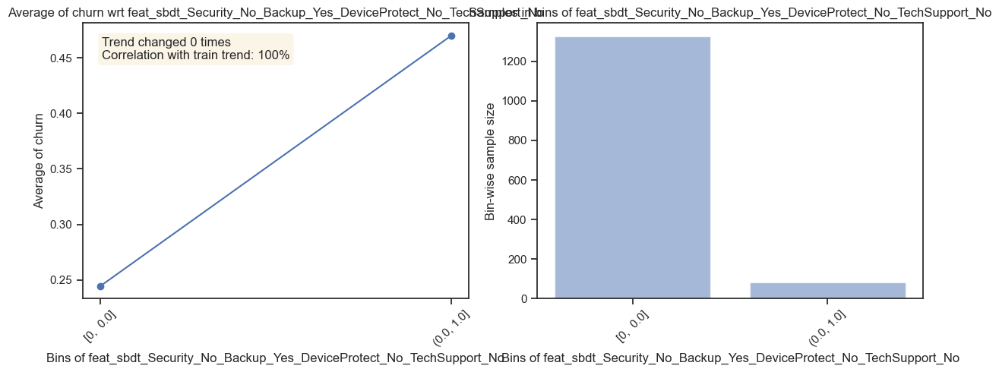

--------------------------------------------------------------------------------------------------------------


             Plots for feat_sbdt_Security_No_Backup_Yes_DeviceProtect_No_TechSupport_Yes              
                                           Train data plots                                           


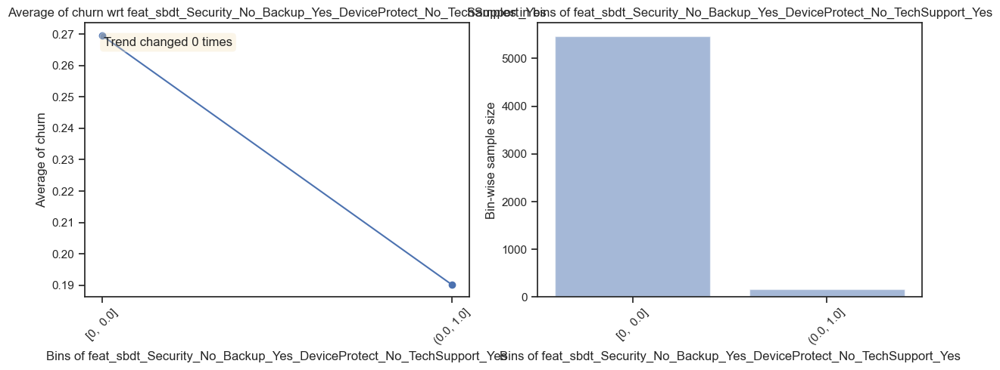

                                           Test data plots                                            


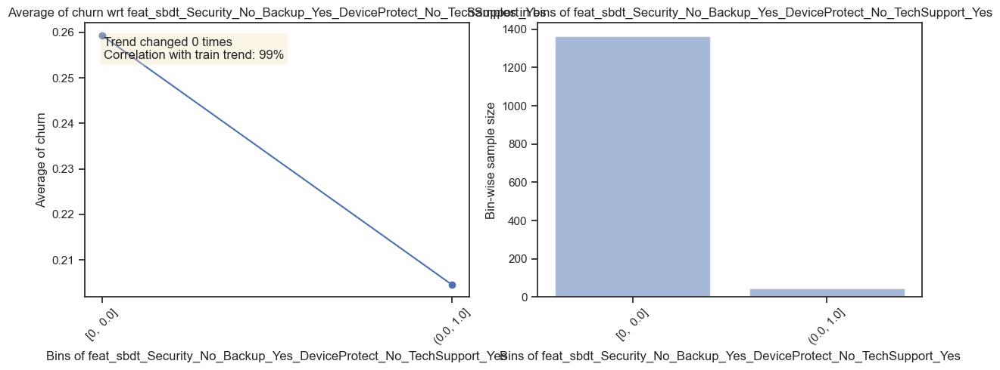

--------------------------------------------------------------------------------------------------------------


             Plots for feat_sbdt_Security_No_Backup_Yes_DeviceProtect_Yes_TechSupport_No              
                                           Train data plots                                           


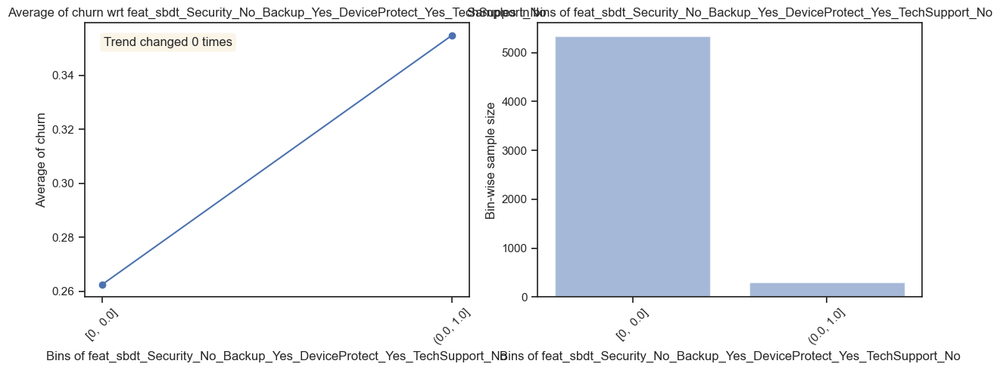

                                           Test data plots                                            


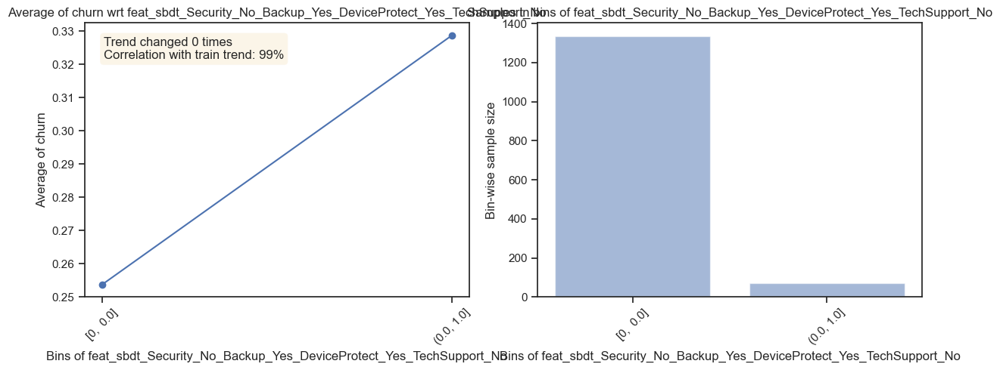

--------------------------------------------------------------------------------------------------------------


             Plots for feat_sbdt_Security_No_Backup_Yes_DeviceProtect_Yes_TechSupport_Yes             
                                           Train data plots                                           


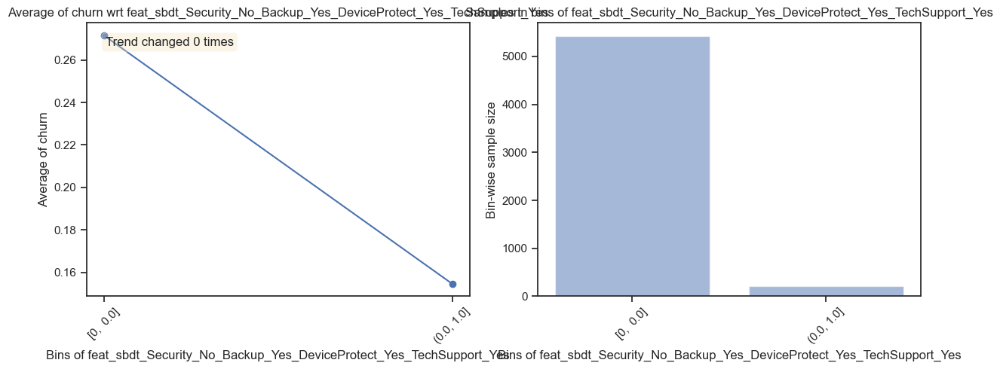

                                           Test data plots                                            


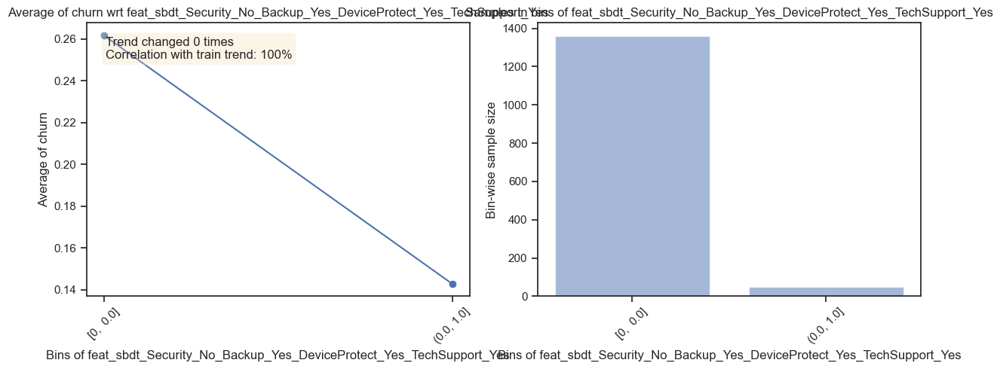

--------------------------------------------------------------------------------------------------------------


              Plots for feat_sbdt_Security_Yes_Backup_No_DeviceProtect_No_TechSupport_No              
                                           Train data plots                                           


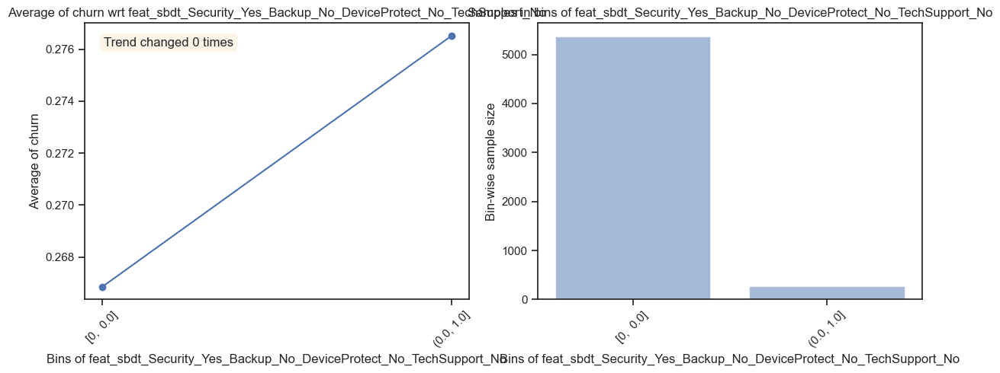

                                           Test data plots                                            


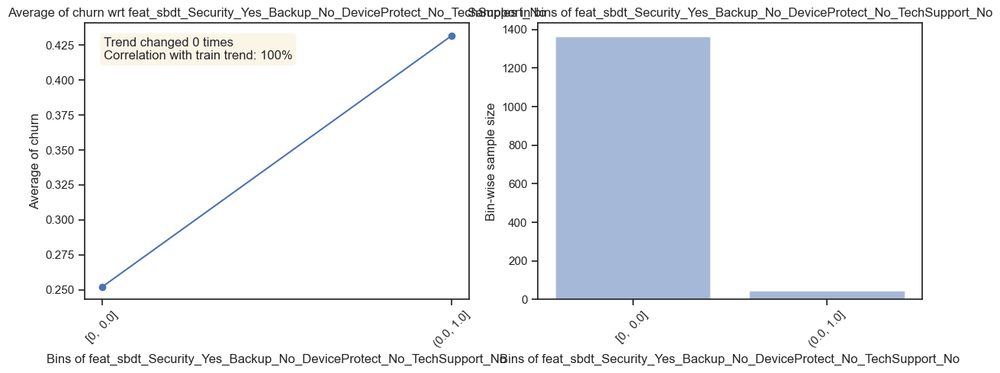

--------------------------------------------------------------------------------------------------------------


             Plots for feat_sbdt_Security_Yes_Backup_No_DeviceProtect_No_TechSupport_Yes              
                                           Train data plots                                           


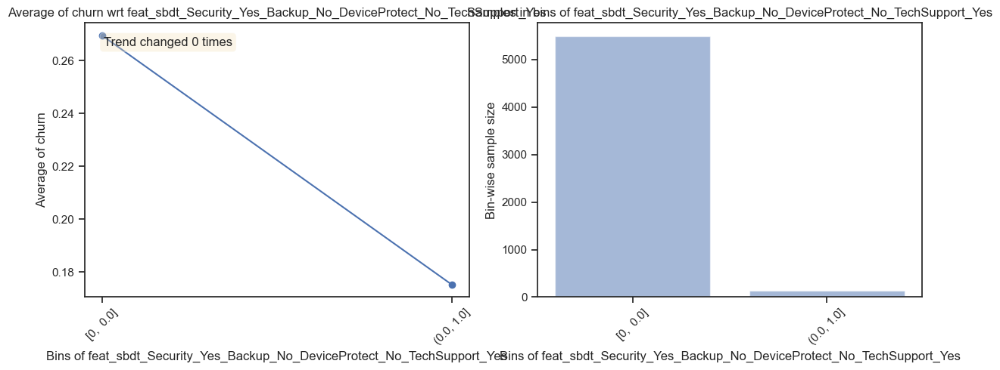

                                           Test data plots                                            


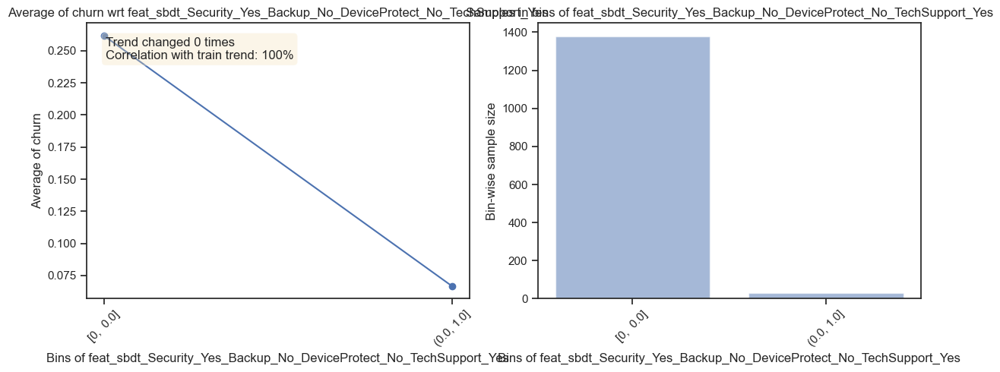

--------------------------------------------------------------------------------------------------------------


             Plots for feat_sbdt_Security_Yes_Backup_No_DeviceProtect_Yes_TechSupport_No              
                                           Train data plots                                           


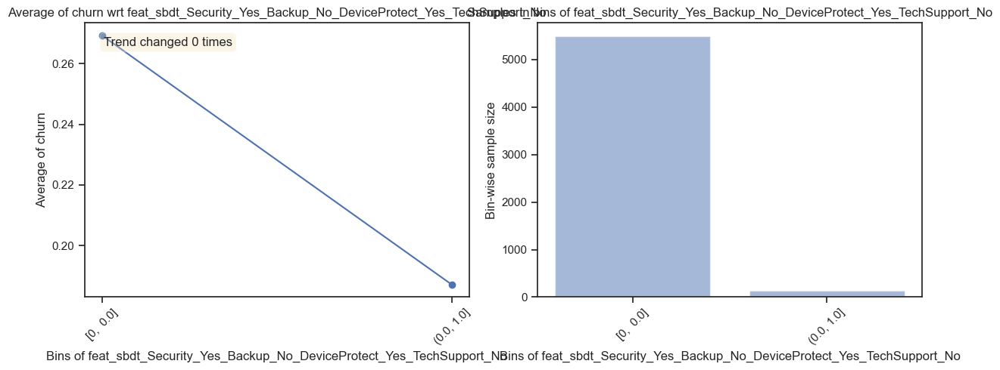

                                           Test data plots                                            


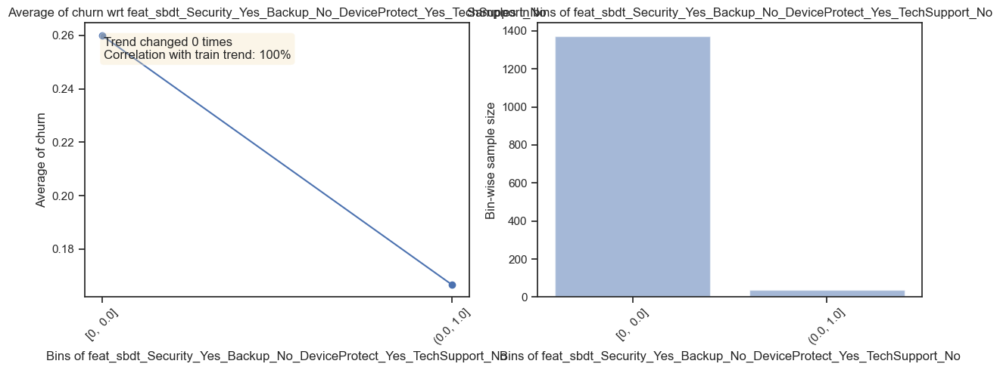

--------------------------------------------------------------------------------------------------------------


             Plots for feat_sbdt_Security_Yes_Backup_No_DeviceProtect_Yes_TechSupport_Yes             
                                           Train data plots                                           


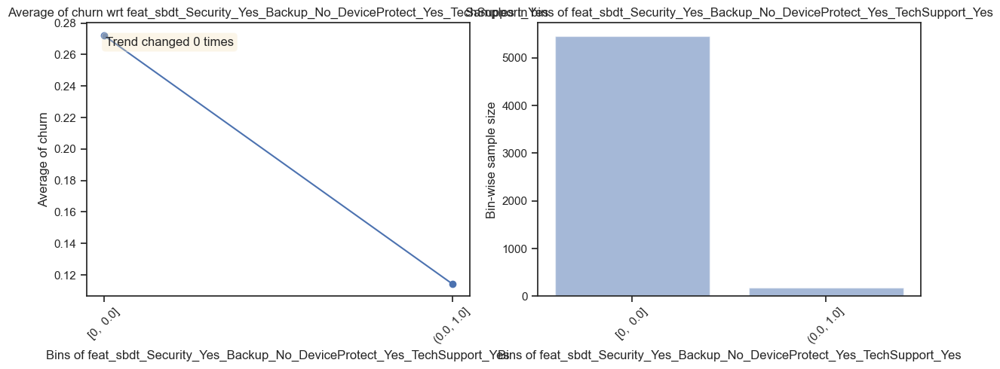

                                           Test data plots                                            


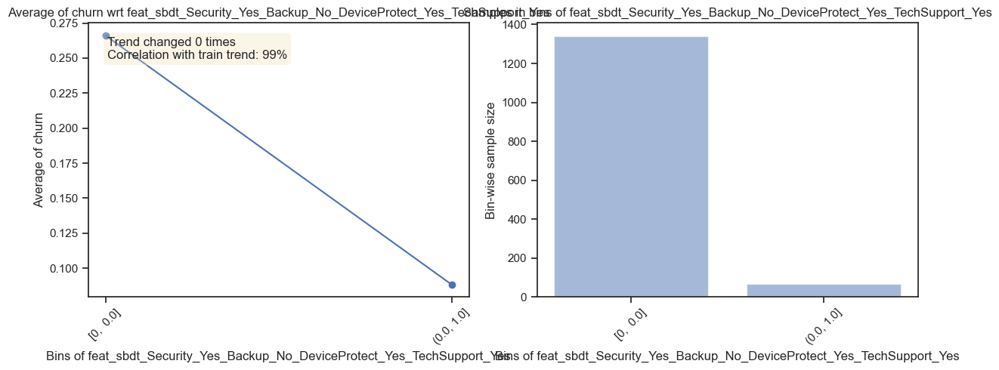

--------------------------------------------------------------------------------------------------------------


             Plots for feat_sbdt_Security_Yes_Backup_Yes_DeviceProtect_No_TechSupport_No              
                                           Train data plots                                           


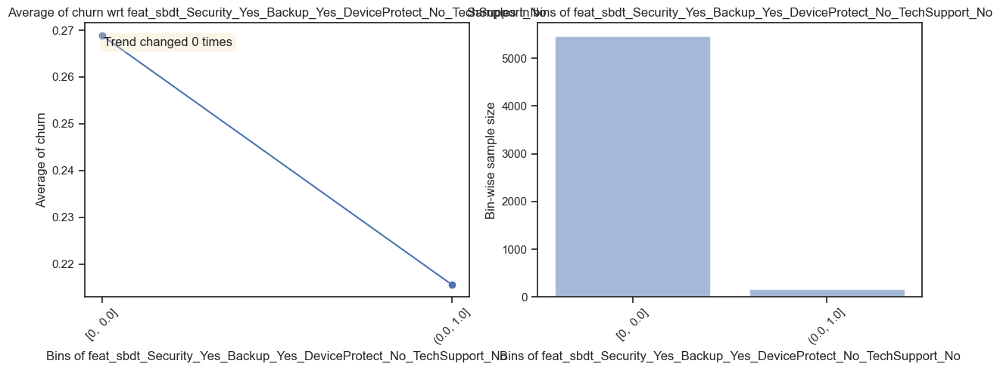

                                           Test data plots                                            


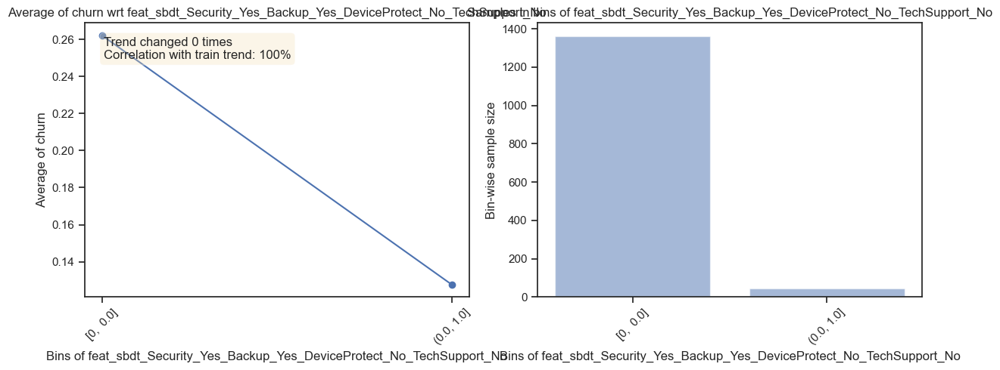

--------------------------------------------------------------------------------------------------------------


             Plots for feat_sbdt_Security_Yes_Backup_Yes_DeviceProtect_No_TechSupport_Yes             
                                           Train data plots                                           


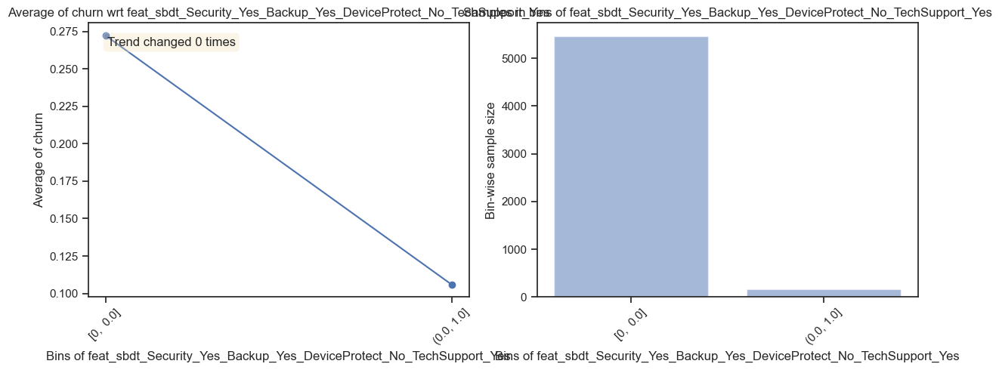

                                           Test data plots                                            


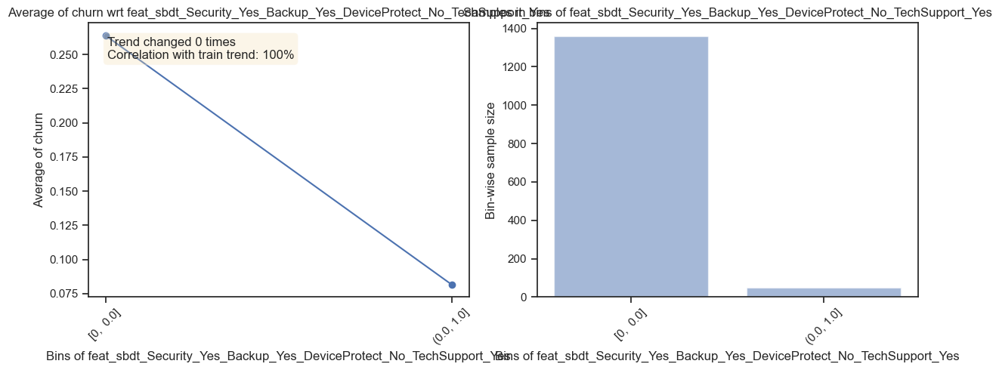

--------------------------------------------------------------------------------------------------------------


             Plots for feat_sbdt_Security_Yes_Backup_Yes_DeviceProtect_Yes_TechSupport_No             
                                           Train data plots                                           


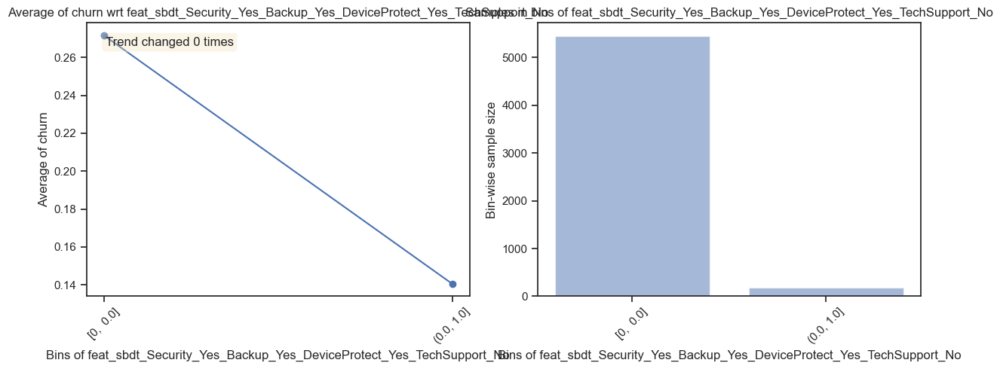

                                           Test data plots                                            


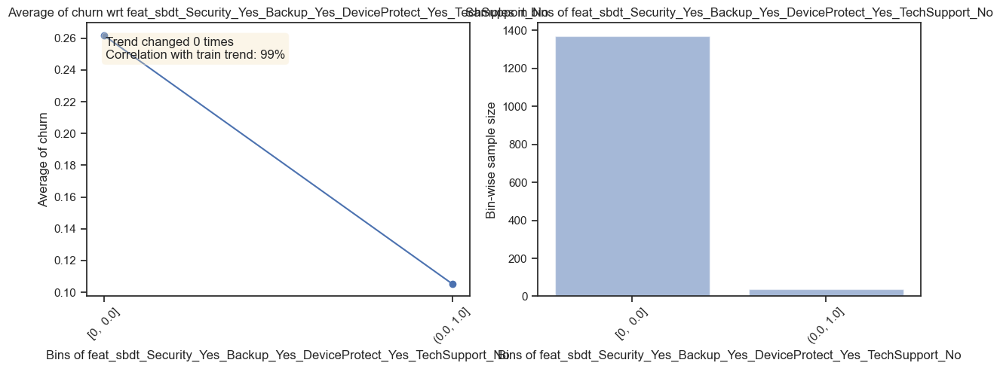

--------------------------------------------------------------------------------------------------------------


            Plots for feat_sbdt_Security_Yes_Backup_Yes_DeviceProtect_Yes_TechSupport_Yes             
                                           Train data plots                                           


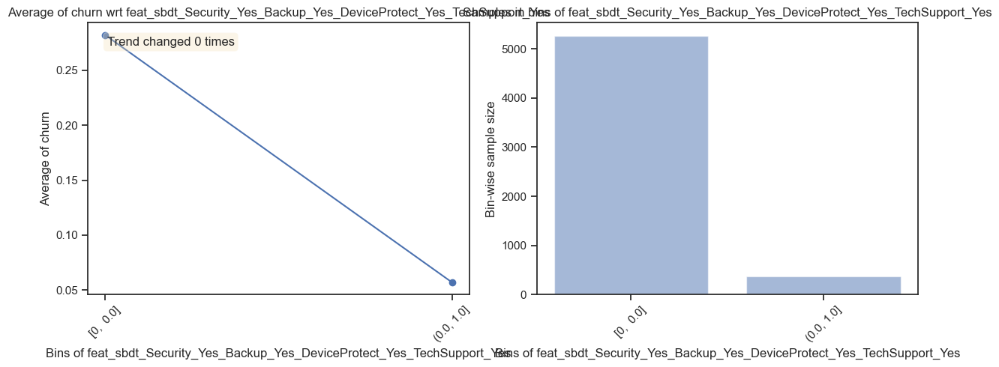

                                           Test data plots                                            


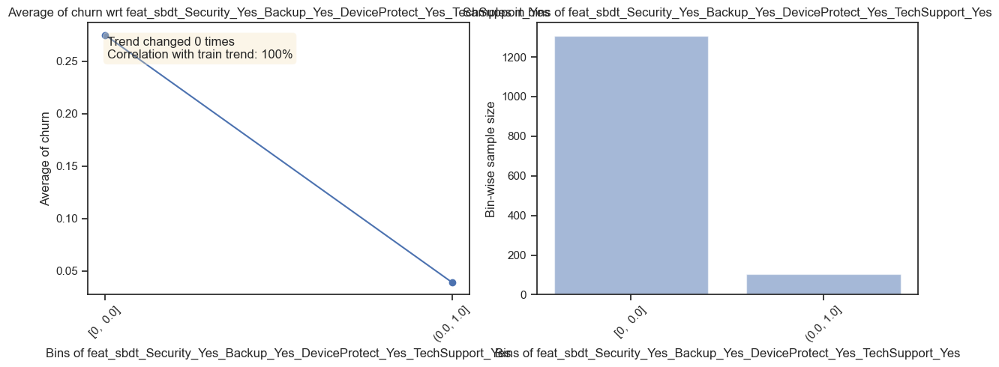

--------------------------------------------------------------------------------------------------------------


                       Plots for feat_stream_StreamingTV_No_StreamingMovies_Yes                       
                                           Train data plots                                           


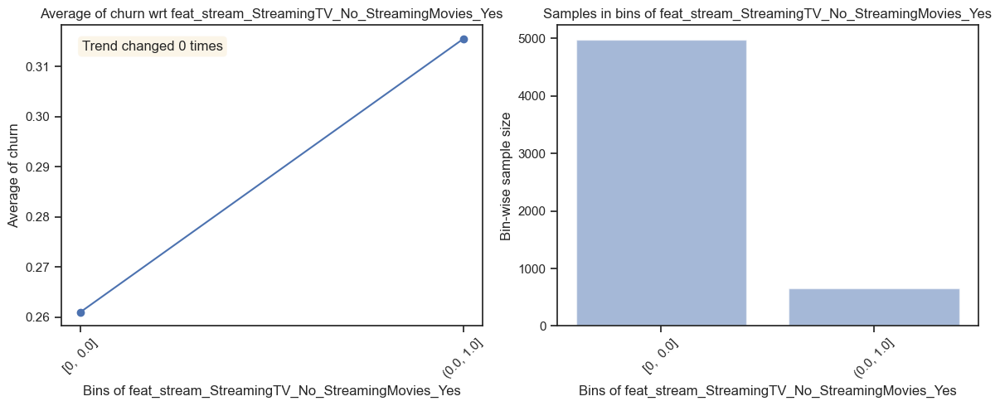

                                           Test data plots                                            


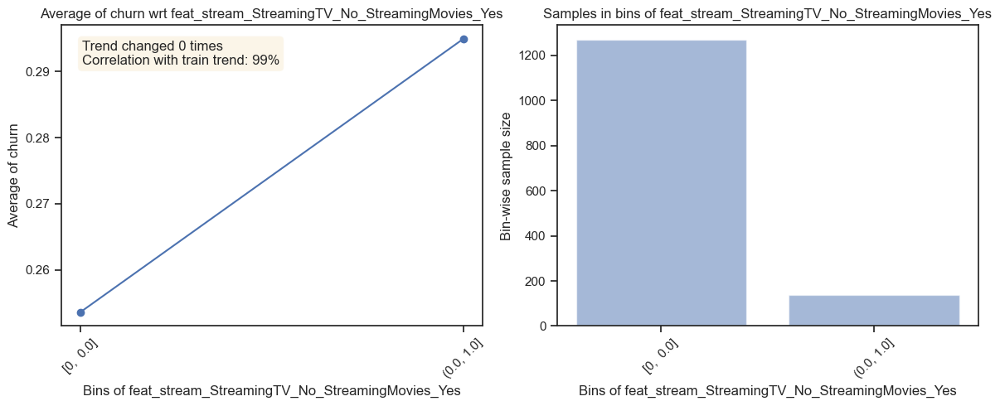

--------------------------------------------------------------------------------------------------------------


                       Plots for feat_stream_StreamingTV_Yes_StreamingMovies_No                       
                                           Train data plots                                           


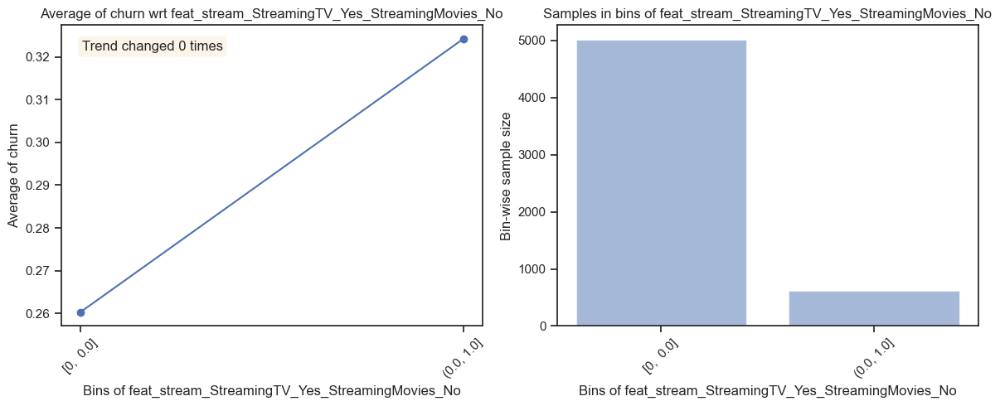

                                           Test data plots                                            


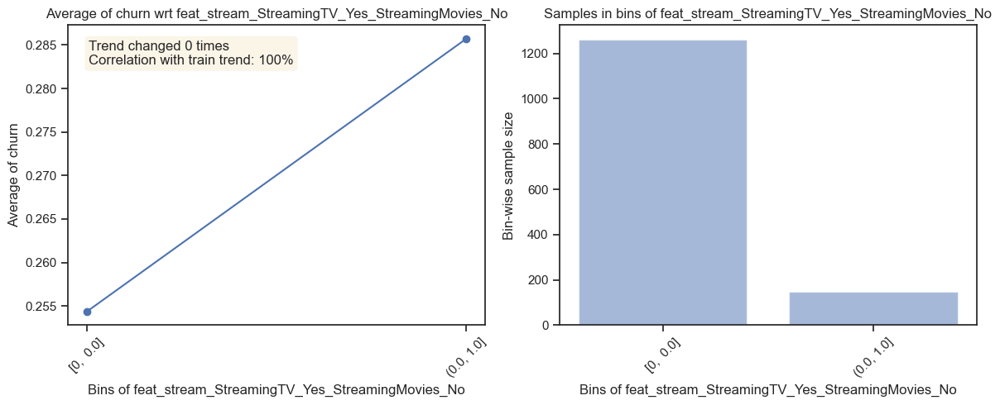

--------------------------------------------------------------------------------------------------------------


                      Plots for feat_stream_StreamingTV_Yes_StreamingMovies_Yes                       
                                           Train data plots                                           


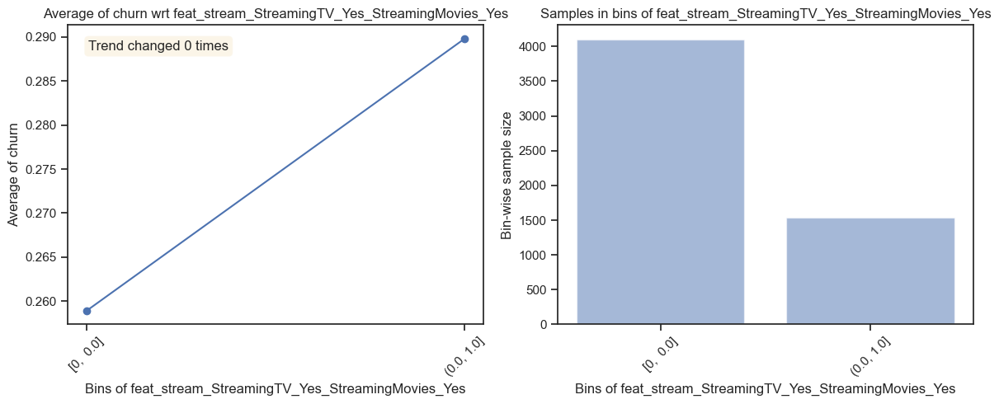

                                           Test data plots                                            


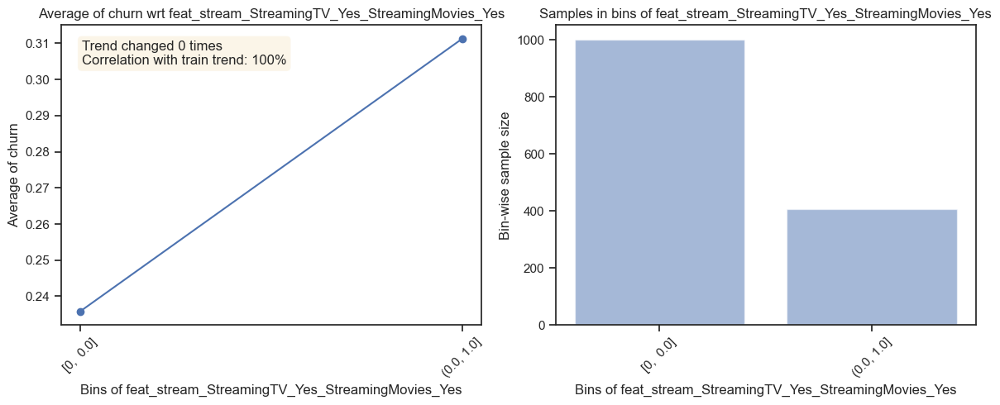

--------------------------------------------------------------------------------------------------------------




In [46]:
# Plots for univariate analysis
get_univariate_plots(data=data_train,target_col='churn',data_test = data_holdout, bins=10)

Comparison of feature trends in train and holdout

Featexp calculates two metrics to display on these plots which help with gauging noisiness:

Trend correlation(seen in test plot): If a feature doesn’t hold same trend w.r.t. target across train and evaluation sets, it can lead to overfitting. This happens because the model is learning something which is not applicable in test data. Trend correlation helps understand how similar train/test trends are and mean target values for bins in train & test are used to calculate it. 

Trend changes: Sudden and repeated changes in trend direction could imply noisiness. But, such trend change can also happen because that bin has a very different population in terms of other features and hence, its incidence rate can’t really be compared with other bins.

In [47]:
# Stats to check for correlation trends between train and test
stats = get_trend_stats(data=data_train, target_col='churn', data_test=data_holdout)

Only one bin created for phoneservice_Yes. Correlation can't be calculated
Returning stats for all numeric features


In [48]:
# Obtain correlation trend stats
stats_low_corr = stats.loc[stats['Trend_correlation'] < 0.8,:]
stats_low_corr.head(10)

,Feature,Trend_changes,Trend_changes_test,Trend_correlation
9,phoneservice_Yes,0,0,0.0
10,multiplelines_Yes,0,0,-1.0
25,feat_gpd_Female_Partner_Yes_Dependents_No,0,0,-1.0
29,feat_gpd_Male_Partner_Yes_Dependents_No,0,0,-1.0
46,feat_sbd_Security_No_Backup_Yes_DeviceProtect_Yes,0,0,-1.0
47,feat_sbd_Security_Yes_Backup_No_DeviceProtect_No,0,0,-1.0


In [49]:
# These features will be removed prior to train and holdout split as there is no correlation or a negative correlation
low_corr_trend_feat = stats_low_corr.Feature.to_list()

### Split data into train and holdout

In [50]:
# Prepare dataframes for train and test split
features = [x for x in df_ohe.columns if x not in key_col if x not in target_col if x not in low_corr_trend_feat]
X = df_ohe[features]
y = df_ohe[target_col]
ID = df_ohe[key_col]
len(features)

63

In [51]:
# Split into train and test
X_train,X_holdout,y_train,y_holdout = train_test_split(X,y,test_size=0.2,random_state=3)

In [52]:
print("Target distribution in train sample")
y_train.value_counts(normalize=True)

Target distribution in train sample


churn
0        0.732694
1        0.267306
dtype: float64

In [53]:
print("Target distribution in holdout sample")
y_train.value_counts(normalize=True)

Target distribution in holdout sample


churn
0        0.732694
1        0.267306
dtype: float64

The distribution of target variable in train and holdout samples look similar

### Train the model

We will consider AUC-ROC (ability of model to rank order well) as our primary model performance metric

In [54]:
# XGboost with default parameters with 3 fold CV
model = XGBClassifier()
kfold = KFold(n_splits=5, random_state=3)
cv_results = cross_val_score(model,X_train,y_train, cv=kfold,scoring='roc_auc')
print ("The mean ROC-AUC on 3 fold cross validation is {AUC}".format(AUC = cv_results.mean()))

The mean ROC-AUC on 3 fold cross validation is 0.8402752677490788


In [55]:
# Defining hyper-parameters for XGBoost classifier
# Grid search takes time and intensive so unless required to further enhance the model performance we will run using randomly chosen hyperparameters 
xgb_clf = xgb.XGBClassifier(learning_rate=0.1, 
                            n_estimators=100, 
                            max_depth=5,
                            min_child_weight=1,
                            gamma=0,
                            subsample=0.9,
                            colsample_bytree=0.6,
                            objective= 'binary:logistic',
                            nthread=-1,
                            scale_pos_weight=1,
                            reg_alpha = 0,
                            reg_lambda = 1,
                            seed=3)

In [56]:
# Fitting the XGBoostclassifier on train data
xgb_clf.fit(X_train, y_train, eval_set=[(X_train, y_train), (X_holdout, y_holdout)], 
            early_stopping_rounds=100, eval_metric='auc', verbose=10)

[0]	validation_0-auc:0.833859	validation_1-auc:0.812217
Multiple eval metrics have been passed: 'validation_1-auc' will be used for early stopping.

Will train until validation_1-auc hasn't improved in 100 rounds.
[10]	validation_0-auc:0.866262	validation_1-auc:0.856394
[20]	validation_0-auc:0.873354	validation_1-auc:0.861252
[30]	validation_0-auc:0.879327	validation_1-auc:0.862234
[40]	validation_0-auc:0.88695	validation_1-auc:0.862858
[50]	validation_0-auc:0.893081	validation_1-auc:0.861793
[60]	validation_0-auc:0.898056	validation_1-auc:0.860943
[70]	validation_0-auc:0.904709	validation_1-auc:0.861012
[80]	validation_0-auc:0.910033	validation_1-auc:0.861491
[90]	validation_0-auc:0.916321	validation_1-auc:0.861044
[99]	validation_0-auc:0.919846	validation_1-auc:0.860767


XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=0.6, gamma=0, learning_rate=0.1, max_delta_step=0,
       max_depth=5, min_child_weight=1, missing=None, n_estimators=100,
       n_jobs=1, nthread=-1, objective='binary:logistic', random_state=0,
       reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=3, silent=True,
       subsample=0.9)

In [57]:
# Making predictions on holdout sampe
predictions = xgb_clf.predict(X_holdout)

### Test the model on hold-out

In [58]:
# Compute ROC-AUC on hold-out sample
predictions_probas = xgb_clf.predict_proba(X_holdout)[:,1]
print("ROC-AUC score on holdout sample is :", round(roc_auc_score(y_holdout, predictions_probas),5))

ROC-AUC score on holdout sample is : 0.86295


The model generalizes well on hold-out sample. No evidence of overfitting

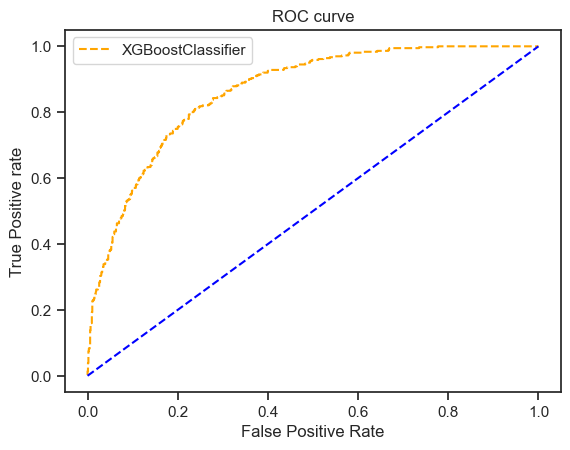

In [59]:
# Plot AUC ROC curve
fpr, tpr, thresh = roc_curve(y_holdout, predictions_probas, pos_label=1)

random_probs = [0 for i in range(len(y_holdout))]
p_fpr, p_tpr, _ = roc_curve(y_holdout, random_probs, pos_label=1)

# plot roc curves
plt.plot(fpr, tpr, linestyle='--',color='orange', label='XGBoostClassifier')
plt.plot(p_fpr, p_tpr, linestyle='--', color='blue')
# title
plt.title('ROC curve')
# x label
plt.xlabel('False Positive Rate')
# y label
plt.ylabel('True Positive rate')

plt.legend(loc='best')
plt.savefig('ROC',dpi=300)
plt.show()

In [60]:
# Compute accuracy on holdout sample
print("Accuracy score on holdout sample is", round(accuracy_score(y_holdout, predictions),5))

Accuracy score on holdout sample is 0.81405


In [61]:
# Precisionm, Recall and F1 score on holdout sample
print(classification_report(y_holdout,predictions))

             precision    recall  f1-score   support

          0       0.85      0.92      0.88      1046
          1       0.68      0.52      0.59       363

avg / total       0.80      0.81      0.81      1409



### Feature Importance

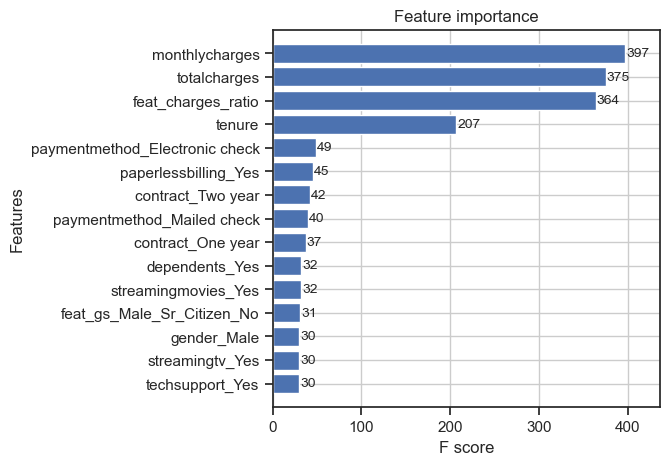

In [62]:
# Feature Importance
fig, ax = plt.subplots(figsize=(5,5))
plot_importance(xgb_clf, max_num_features=15, height=0.8, ax=ax)
plt.show()

### Save model

In [63]:
# Saving the model for future use
file_name = "xgb_clf_churn.pkl"

# save
pickle.dump(xgb_clf, open(file_name, "wb"))

# load
# xgb_clf_loaded = pickle.load(open(file_name, "rb"))

### Decile tables, Lift and Gains charts

In [64]:
# Functions for plotting

def plot_pandas_style(styler):
    from IPython.core.display import HTML
    html = '\n'.join([line.lstrip() for line in styler.render().split('\n')])
    return HTML(html)

def highlight_max(s,color='yellow'):
    '''
    highlight the maximum in a Series yellow.
    '''
    is_max = s == s.max()
    return ['background-color: {}'.format(color) if v else '' for v in is_max]

def decile_labels(agg1,label,color='skyblue'):
    agg_dummy = pd.DataFrame(OrderedDict((('TOTAL',0),('TARGET',0),('NONTARGET',0),('PCT_TAR',0),('CUM_TAR',0),('CUM_NONTAR',0),('DIST_TAR',0),('DIST_NONTAR',0),('SPREAD',0))),index=[0])
    agg1 = agg1.append(agg_dummy).sort_index()
    agg1.index.name = label
    agg1 = agg1.style.apply(highlight_max, color = 'yellow', subset=['SPREAD'])
    agg1.bar(subset=['TARGET'], color='{}'.format(color))
    agg1.bar(subset=['TOTAL'], color='{}'.format(color))
    agg1.bar(subset=['PCT_TAR'], color='{}'.format(color))
    return(agg1)

def deciling(data,decile_by,target,nontarget):
    inputs = list(decile_by)
    inputs.extend((target,nontarget))
    decile = data[inputs]
    grouped = decile.groupby(decile_by)
    agg1 = pd.DataFrame({},index=[])
    agg1['TOTAL'] = grouped.sum()[nontarget] + grouped.sum()[target]
    agg1['TARGET'] = grouped.sum()[target]
    agg1['NONTARGET'] = grouped.sum()[nontarget]
    agg1['PCT_TAR'] = grouped.mean()[target]*100
    agg1['CUM_TAR'] = grouped.sum()[target].cumsum()
    agg1['CUM_NONTAR'] = grouped.sum()[nontarget].cumsum()
    agg1['DIST_TAR'] = agg1['CUM_TAR']/agg1['TARGET'].sum()*100
    agg1['DIST_NONTAR'] = agg1['CUM_NONTAR']/agg1['NONTARGET'].sum()*100
    agg1['SPREAD'] = (agg1['DIST_TAR'] - agg1['DIST_NONTAR'])
    agg1 = decile_labels(agg1,'DECILE',color='skyblue')
    return(plot_pandas_style(agg1))

In [67]:
# Preparing data to calculate churn rate by decile
scores_holdout = pd.DataFrame(xgb_clf.predict_proba(X_holdout)[:,1], columns = ['SCORE'])
scores_holdout['DECILE'] = pd.qcut(scores_holdout['SCORE'].rank(method = 'first'),10,labels=range(10,0,-1))
scores_holdout['DECILE'] = scores_holdout['DECILE'].astype(int)
scores_holdout['TARGET'] = y_holdout.values
scores_holdout['NONTARGET'] = 1 - y_holdout.values

In [68]:
# Print decile table for holdout sample
print("Decile table for holdout sample")
deciling(scores_holdout,['DECILE'],'TARGET','NONTARGET')

Decile table for holdout sample


,TOTAL,TARGET,NONTARGET,PCT_TAR,CUM_TAR,CUM_NONTAR,DIST_TAR,DIST_NONTAR,SPREAD
DECILE,,,,,,,,,
0,0,0,0,0.000000,0,0,0.000000,0.000000,0.000000
1,141,110,31,78.014184,110,31,30.303030,2.963671,27.339359
2,141,82,59,58.156028,192,90,52.892562,8.604207,44.288355
3,141,61,80,43.262411,253,170,69.696970,16.252390,53.444580
4,141,44,97,31.205674,297,267,81.818182,25.525813,56.292369
5,140,30,110,21.428571,327,377,90.082645,36.042065,54.040580
6,141,16,125,11.347518,343,502,94.490358,47.992352,46.498006
7,141,13,128,9.219858,356,630,98.071625,60.229446,37.842180
8,141,5,136,3.546099,361,766,99.449036,73.231358,26.217678


Model is rank ordering very well on holdout sample without any discontinuity. 70% of churners are captured within the first 3 deciles. A cutoff at either the 3rd -- ~70% churners or 4th decile -- ~80% churners will be optimum depending on marketing budget, contact strategy, retention unnit capacity etc. Below the 4th decile it is a point of diminishing return.

In [69]:
# Functions for plotting lift, PvO and gain charts
def plots(agg1,target,type):

    plt.figure(1,figsize=(20, 5))

    plt.subplot(131)
    plt.plot(agg1['DECILE'],agg1['ACTUAL'],label='Actual')
    plt.plot(agg1['DECILE'],agg1['PRED'],label='Pred')
    plt.xticks(range(10,110,10))
    plt.legend(fontsize=15)
    plt.grid(True)
    plt.title('Actual vs Predicted', fontsize=20)
    plt.xlabel("Population %",fontsize=15)
    plt.ylabel(str(target) + " " + str(type) + " %",fontsize=15)

    plt.subplot(132)
    X = agg1['DECILE'].tolist()
    X.append(0)
    Y = agg1['DIST_TAR'].tolist()
    Y.append(0)
    plt.plot(sorted(X),sorted(Y))
    plt.plot([0, 100], [0, 100],'r--')
    plt.xticks(range(0,110,10))
    plt.yticks(range(0,110,10))
    plt.grid(True)
    plt.title('Gains Chart', fontsize=20)
    plt.xlabel("Population %",fontsize=15)
    plt.ylabel(str(target) + str(" DISTRIBUTION") + " %",fontsize=15)
    plt.annotate(round(agg1[agg1['DECILE'] == 30].DIST_TAR.item(),2),xy=[30,30], 
            xytext=(25, agg1[agg1['DECILE'] == 30].DIST_TAR.item() + 5),fontsize = 13)
    plt.annotate(round(agg1[agg1['DECILE'] == 50].DIST_TAR.item(),2),xy=[50,50], 
            xytext=(45, agg1[agg1['DECILE'] == 50].DIST_TAR.item() + 5),fontsize = 13)

    plt.subplot(133)
    plt.plot(agg1['DECILE'],agg1['LIFT'])
    plt.xticks(range(10,110,10))
    plt.grid(True)
    plt.title('Lift Chart', fontsize=20)
    plt.xlabel("Population %",fontsize=15)
    plt.ylabel("Lift",fontsize=15)

    plt.tight_layout()
    
def gains(data,decile_by,target,score):
    inputs = list(decile_by)
    inputs.extend((target,score))
    decile = data[inputs]
    grouped = decile.groupby(decile_by)
    agg1 = pd.DataFrame({},index=[])
    agg1['ACTUAL'] = grouped.mean()[target]*100
    agg1['PRED'] = grouped.mean()[score]*100
    agg1['DIST_TAR'] = grouped.sum()[target].cumsum()/grouped.sum()[target].sum()*100
    agg1.index.name = 'DECILE'
    agg1 = agg1.reset_index()
    agg1['DECILE'] = agg1['DECILE']*10
    agg1['LIFT'] = agg1['DIST_TAR']/agg1['DECILE']
    plots(agg1,target,'Distribution')

Charts for holdout sample


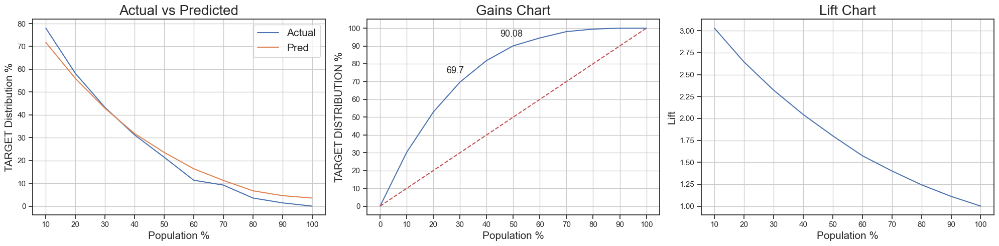

In [70]:
# Plot charts for holdout sample
lift_holdout = pd.concat([X_holdout,scores_holdout],axis=1)
print("Charts for holdout sample")
gains(lift_holdout,['DECILE'],'TARGET','SCORE')

### Target plots

In [71]:
# Target plots for top 10 features
xgb_fea_imp = pd.DataFrame(list(xgb_clf.get_booster().get_fscore().items()), columns = ['feature','importance']).sort_values('importance',ascending= False)
top_10_feat = xgb_fea_imp.iloc[:20,0].tolist()
top_10_feat

['monthlycharges',
 'totalcharges',
 'feat_charges_ratio',
 'tenure',
 'paymentmethod_Electronic check',
 'paperlessbilling_Yes',
 'contract_Two year',
 'paymentmethod_Mailed check',
 'contract_One year',
 'dependents_Yes',
 'streamingmovies_Yes',
 'feat_gs_Male_Sr_Citizen_No',
 'techsupport_Yes',
 'streamingtv_Yes',
 'gender_Male',
 'onlinesecurity_Yes',
 'seniorcitizen_Yes',
 'internetservice_Fiber optic',
 'onlinebackup_Yes',
 'feat_sbdt_Security_No_Backup_Yes_DeviceProtect_Yes_TechSupport_No']

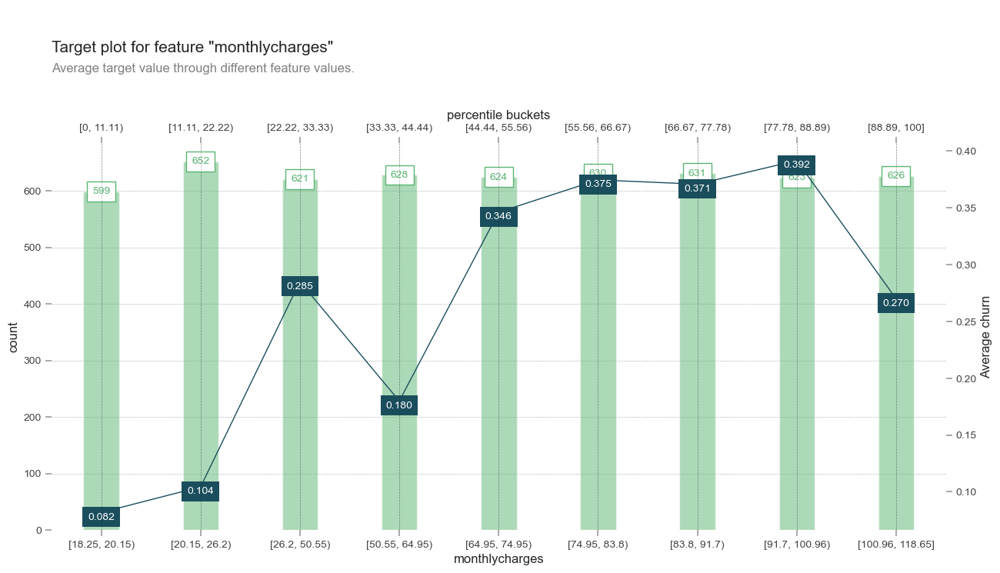

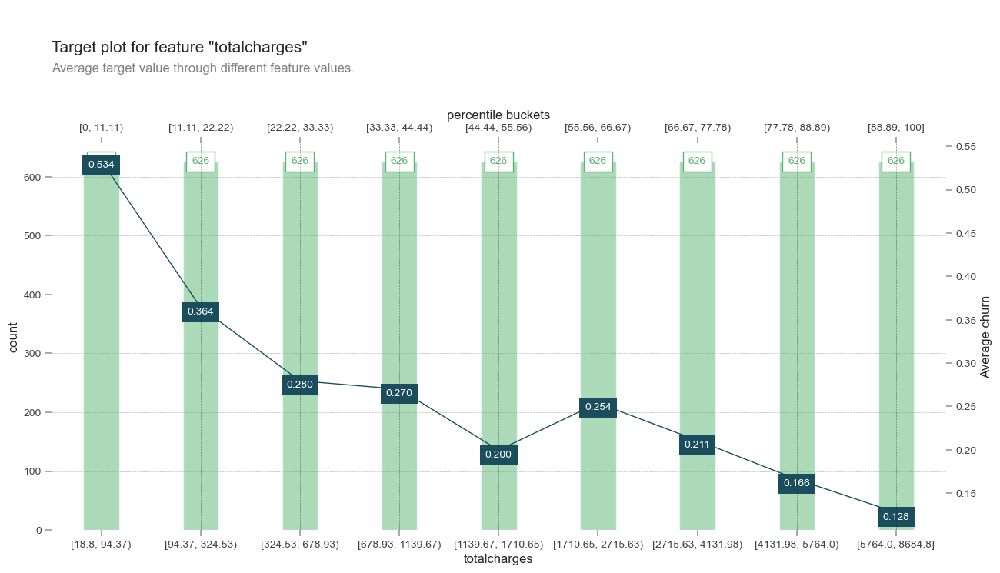

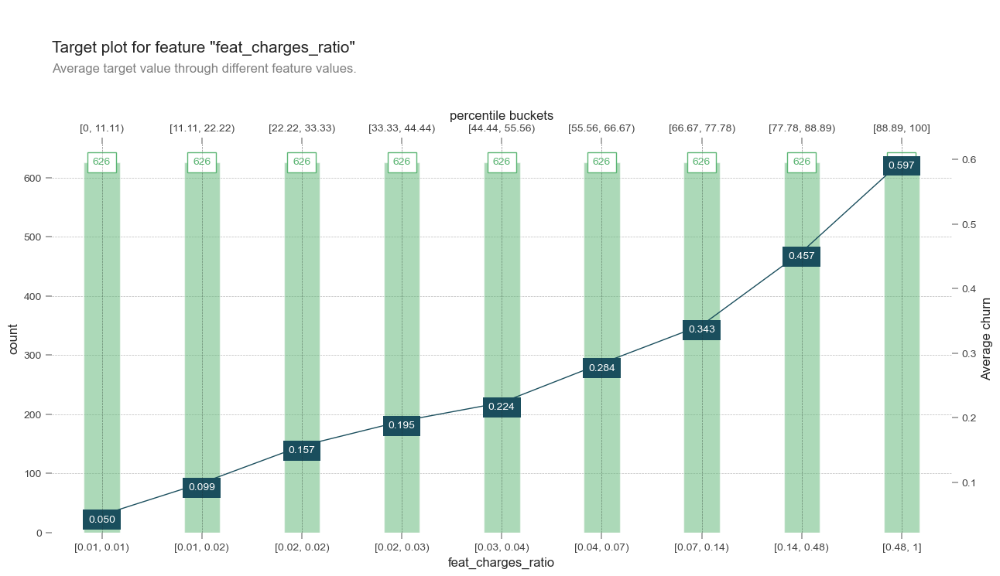

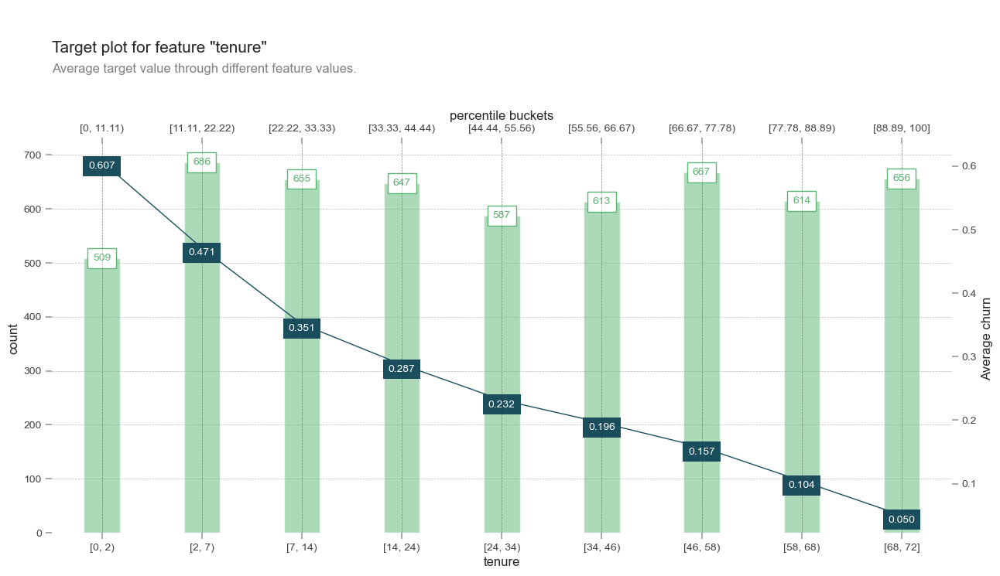

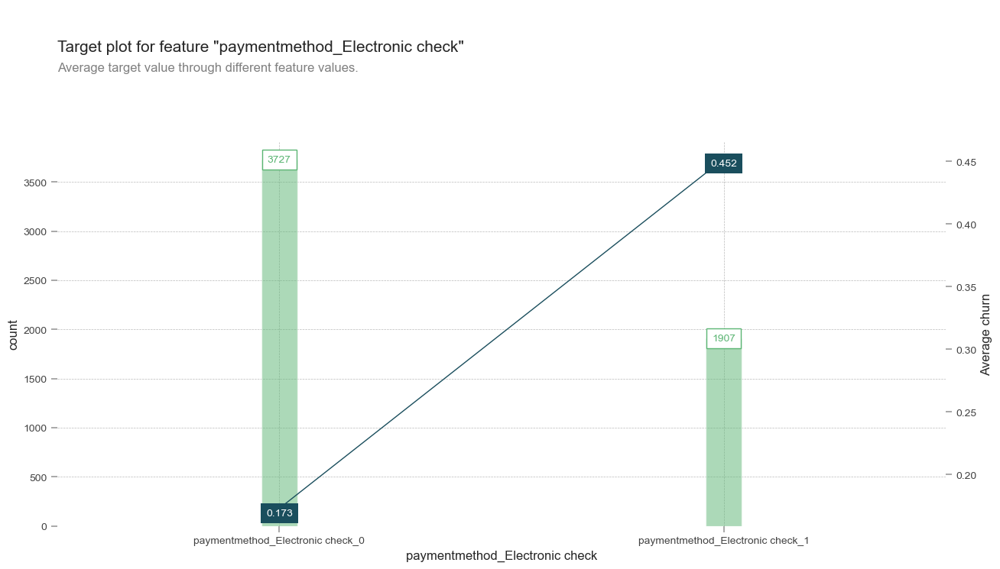

...

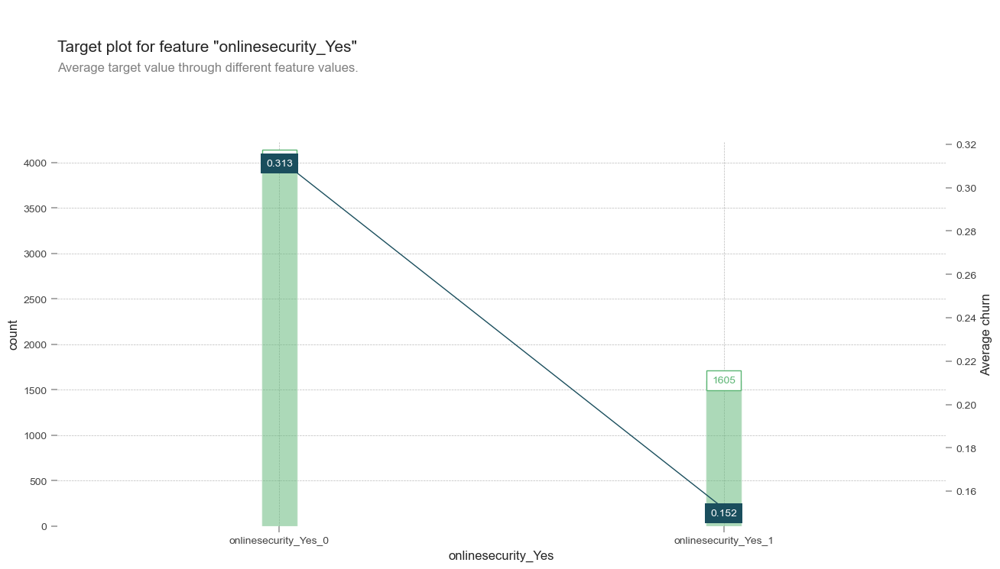

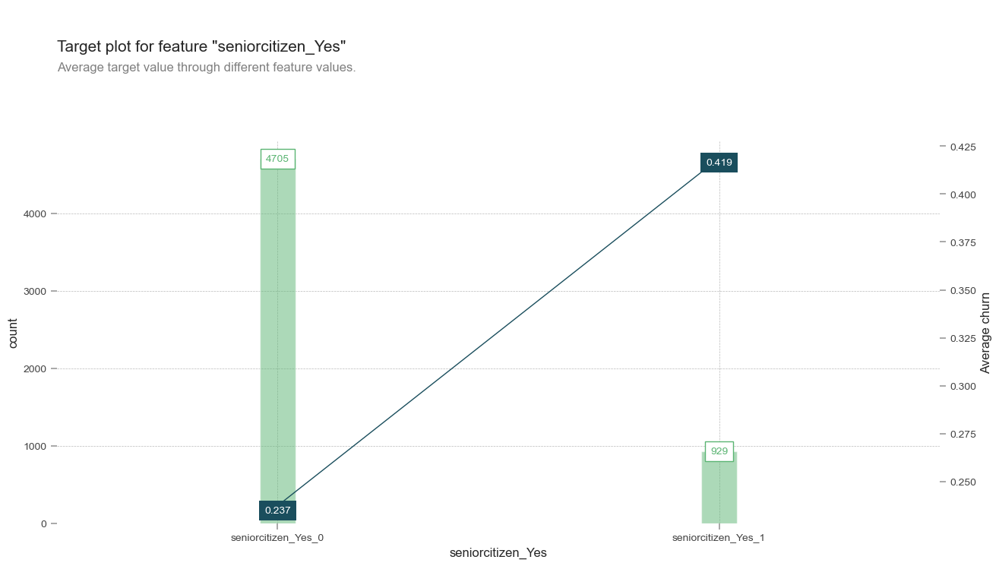

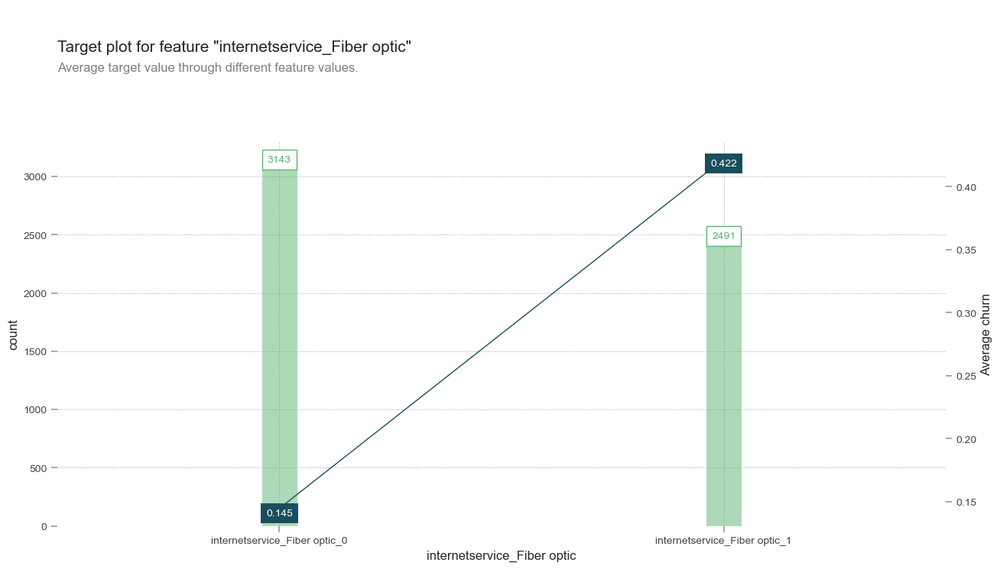

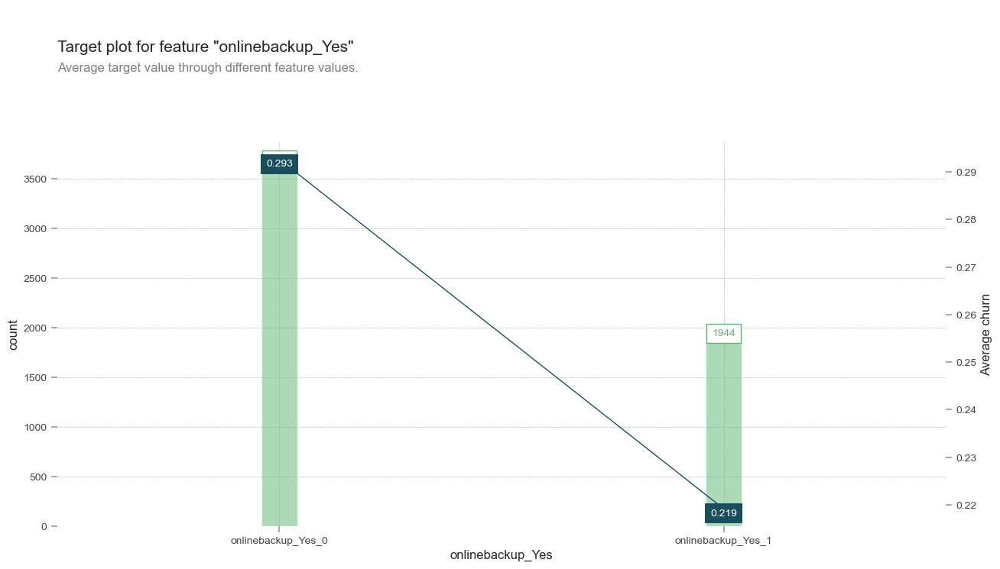

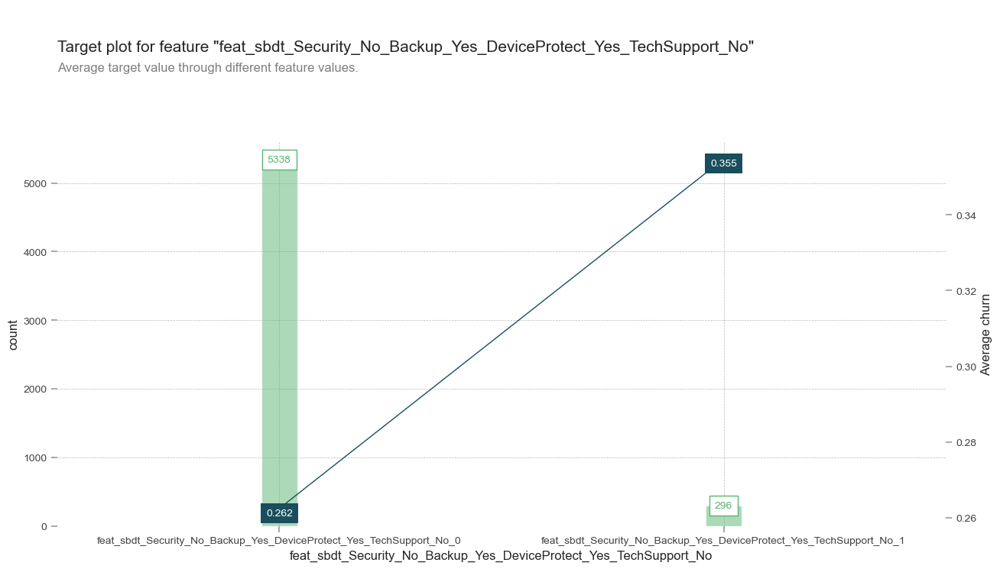

In [72]:
# Target plots for top 10 features
for _ in top_10_feat:
    fig, axes, summary_df = info_plots.target_plot(
    df=data_train, feature=_, feature_name=_,
    target=target_col, show_percentile=True)

## Customers generally churn voluntarily due to the following reasons -
1. Price (switch)
2. Quality of service
3. Features

## Whom to target -
1. Clearly customers in the top 3 deciles (depends on appetite, costs, resources, exclusions due to marketing consent etc.) identified above have a churn rate i.e. 1.5 to 3 times of the average churn rate. 
The ROI will be higher by targeting these customers.
2. The customers who tend to churn-
+ pay higher than average monthly charges, 
+ have low tenure and are probably young,
+ likely digitally savvy (evident from mode of payments and paperless billing)
+ are on short-term contract periods
+ have a fiber optic connection (hypothesis - issues with service)

## Recommendations -

1. To price sensitive customers - Offer discounts based on Customer LifeTime Value and Tenure. Also recognise loyalty.
2. Improve stickiness of customers by signiing them up for long term contracts and cross sell additional services by 
bundling products/features (eg. providing online security and backup)
3. Understand what issues Fiber Optic customers are facing and resolve them on priority and follow up until issues are resolved.
Tech support seems to be poor too, so that needs to be fixed.
4. For younger, low tenure customers who generally have a tendency to switch frequently could think of offering high speed 
internet service during non-peak times (eg. gaming, binging on Netflix etc.) at no additional cost.


## Additional comments and next steps -
+ A one size fits all approach will likely not be effective for retention unlike personalised approach
+ Recommend passing on insights to call centre centre team for retention to have personlized comms with customer based on 
breakdown of individual prediction for each customer based on SHAP. For eg. a customer who is sensitive might be offered a 
discount, while offering upgrades/additional services to a customer for whom the service and experience is important.
+ Having temporal data over a period of time will help improve behavior of customer and likely improve performance of model
by having aggregated features. This will also help with proactive retention when there are early signs of switching.
+ Additional data sources such as the following could be explored to enrich data. Some of the additional features created turned out to be in the top 15-20 features.
    - Demographics based on postal code of where customer lives (ABS)
    - Complaints data
    - Competitor pricing
    - Usage logs

##### Model Interpretability for personalized communications using SHAP - WIP

In [75]:
# Create object that can calculate shap values
explainer = shap.TreeExplainer(xgb_clf)

# Calculate Shap values
shap_values = explainer.shap_values(X_train)

In [76]:
# SHAP Feature importance
vals = np.abs(shap_values).mean(0)
feat_importance = pd.DataFrame(list(zip(X_train.columns,vals)), columns = ['feature_name','feature_importance_value'])
feat_importance.sort_values(by=['feature_importance_value'],ascending=False, inplace=True)

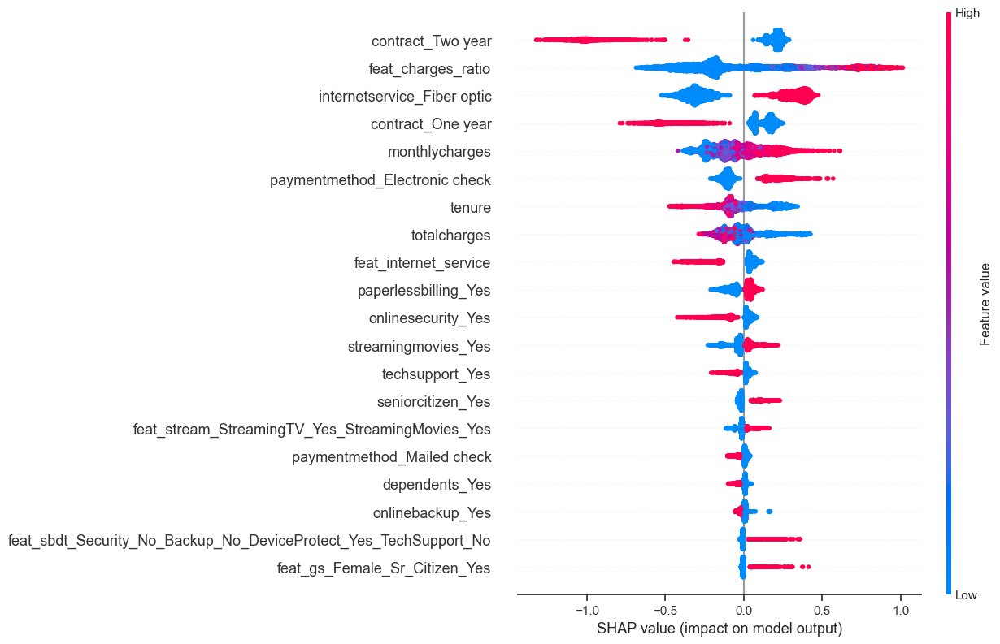

In [77]:
# SHAP Feature importance summary plot
shap.summary_plot(shap_values,X_train)